In [1]:
%load_ext autoreload 
%autoreload 2
import cv2
import json, os, cv2
from pathlib import Path
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np
import xarray as xr
import sys
sys.path.insert(0, 'C:/Users/nlab/Documents/GitHub/obstacle_avoidance')
#sys.path.append(r'C:\Users\nlab\Documents\GitHub\obstacle_avoidance\plots') # go to parent dir 
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from scipy.stats import gaussian_kde

from utils.base_functions import *

from streamline_clustering.clustering import *
from src.utils.auxiliary import flatten_series
from src.utils.path import find
from src.base import BaseInput
from plots.plots import plot_oa
from plots.plots2 import *
#from plots.plots import *
import warnings
warnings.filterwarnings('ignore')
from dipy.segment.clustering import QuickBundles






<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
light = pd.read_hdf(r"D:\obstacle_avoidance\recordings\data_h5\oa_df_04142024.h5")
head_body_angle(light)
ns_oa_long,ns_oa_short,ns_oa_middle = create_df_by_type_nostart(light)
oa_long,oa_short,oa_middle = create_df_by_type(light)


ow_oa_long,ow_oa_short,ow_oa_middle = create_df_by_type_out_ofway(light)

In [14]:
dark = pd.read_hdf(r"D:\obstacle_avoidance\recordings\data_h5\dark_oa_df_04142024.h5")
head_body_angle(dark)
for ind,row in dark.iterrows():
    if row.date == '071023':
        dark.at[ind,'skill'] = 'naive'
    elif row.date == '071123':
        dark.at[ind,'skill'] = 'early'
    elif row.date == '071223':
        dark.at[ind,'skill'] = 'middle'
    elif row.date == '071323':
        dark.at[ind,'skill'] = 'late'
ns_dark_long,ns_dark_short,ns_dark_middle = create_df_by_type_nostart(dark)
dark_long,dark_short,dark_middle = create_df_by_type(dark)

ow_dark_long,ow_dark_short,ow_dark_middle = create_df_by_type_out_ofway(dark)

In [12]:
for ind,row in dark.iterrows():
    if row.date == '071023':
        dark.at[ind,'skill'] = 'naive'
    elif row.date == '071123':
        dark.at[ind,'skill'] = 'early'
    elif row.date == '071223':
        dark.at[ind,'skill'] = 'middle'
    elif row.date == '071323':
        dark.at[ind,'skill'] = 'late'

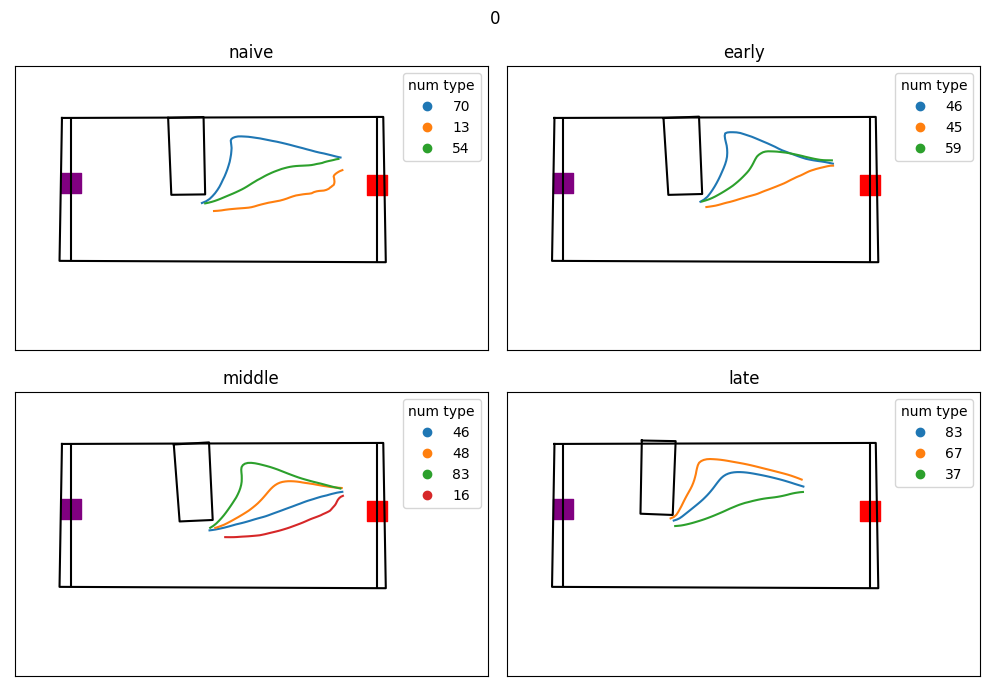

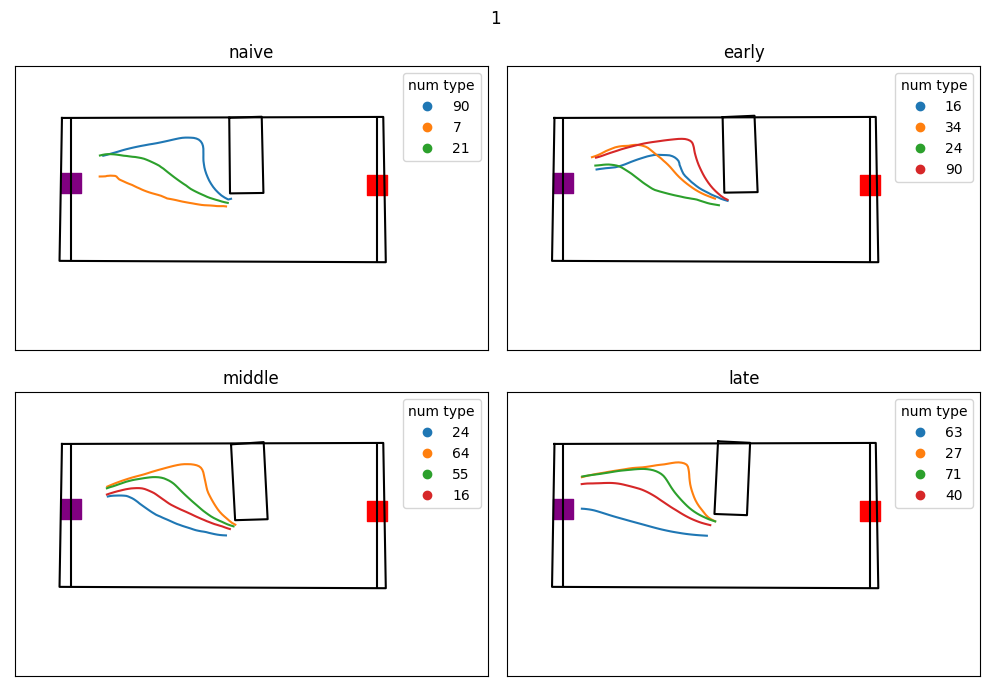

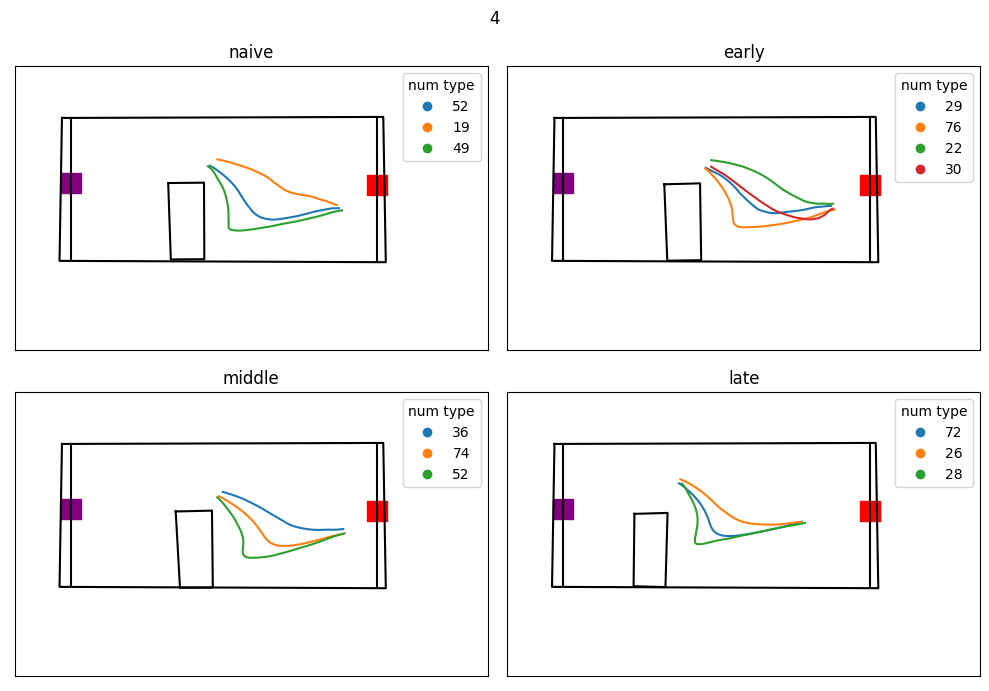

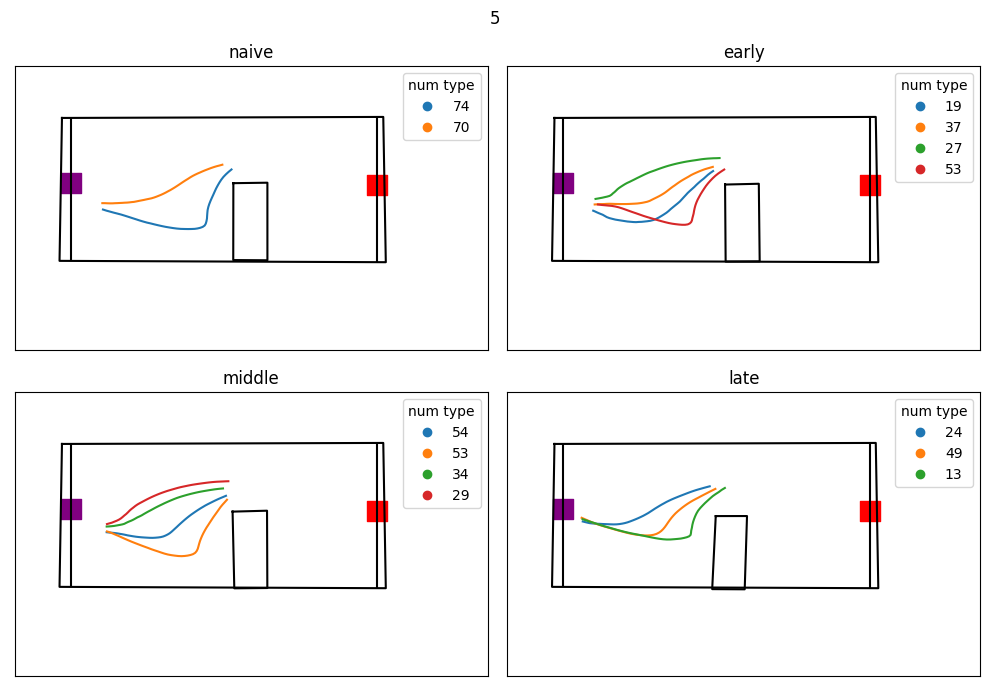

In [13]:
for cluster in oa_long.obstacle_cluster.unique():

    data = oa_long[(oa_long['obstacle_cluster']==cluster) ]
    data = drop_nans_in_columns(data,'obstacle_devations')
    data = drop_nans_in_columns(data,'skill')
    fig,axs = plt.subplots(2,2, figsize = (10,7),tight_layout =False)
    fig.suptitle(cluster)
    for skill,skill_df in data.groupby(['skill']):
        for ax in axs.reshape(-1):
            ax.set_xticks([], [])
            ax.set_yticks([], [])
            #plot_arena(data,ax,obstacle=False)
        if skill == 'naive':
            axs[0,0].set_title(skill)
            plot_arena(oa_long,axs[0,0],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[0,0],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == 'early':
            axs[0,1].set_title(skill)
            plot_arena(oa_long,axs[0,1],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[0,1],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[0,1].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[0,1].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == 'middle':
            axs[1,0].set_title(skill)
            plot_arena(oa_long,axs[1,0],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[1,0],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[1,0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[1,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == 'late':
            axs[1,1].set_title(skill)
            plot_arena(oa_long,axs[1,1],obstacle=False)
            if cluster in [4,5]:
                plot_orginal_obstacle(skill_df,axs[1,1],cluster=cluster,correct=True)
            else:
                plot_orginal_obstacle(skill_df,axs[1,1],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[1,1].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[1,1].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)

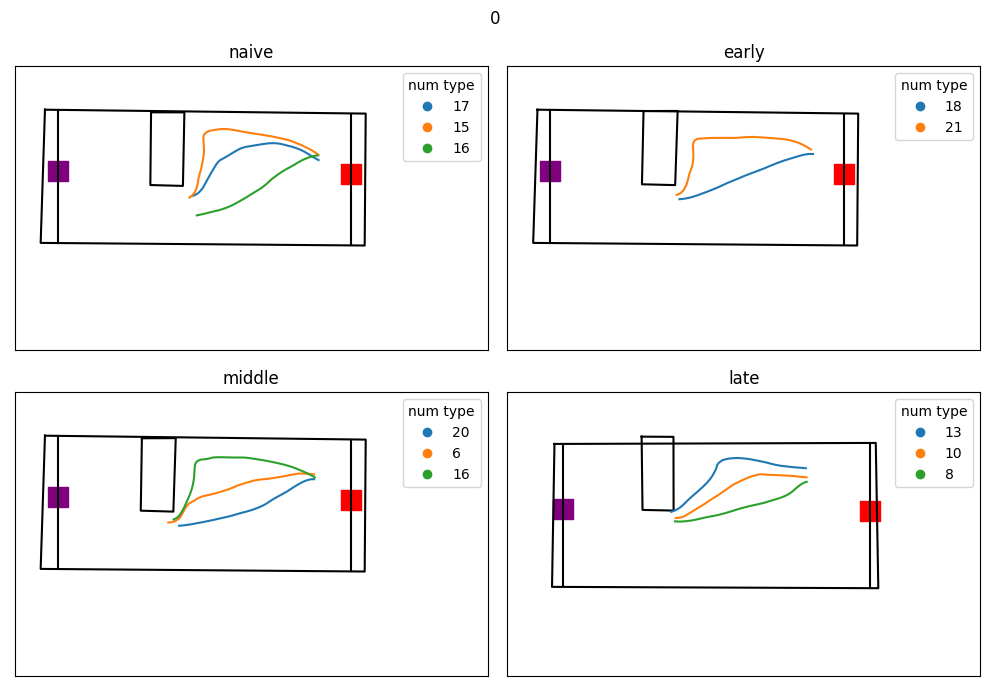

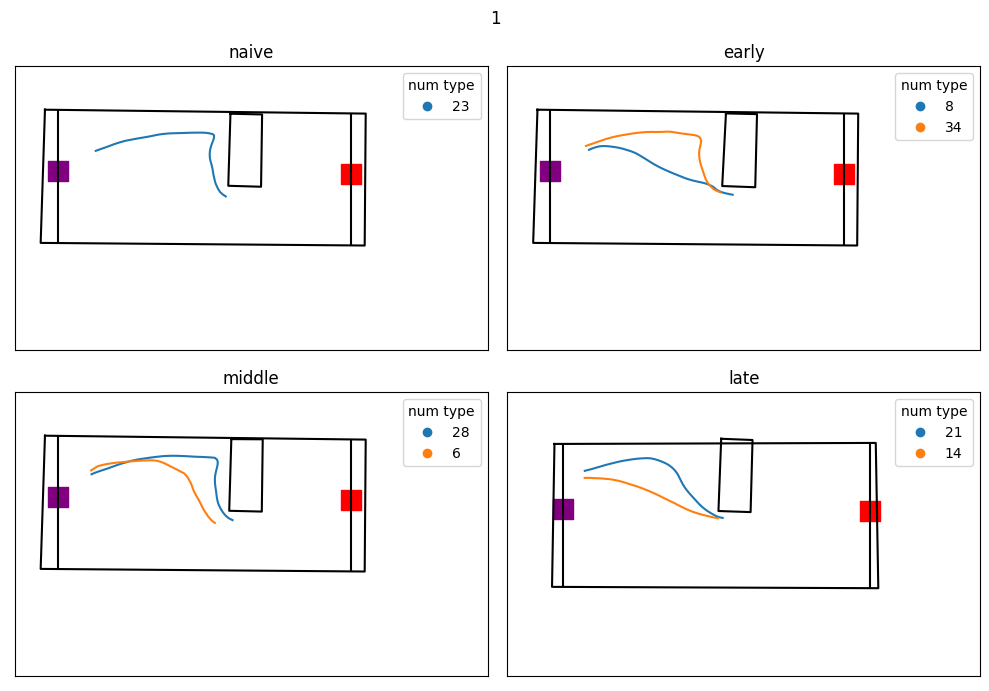

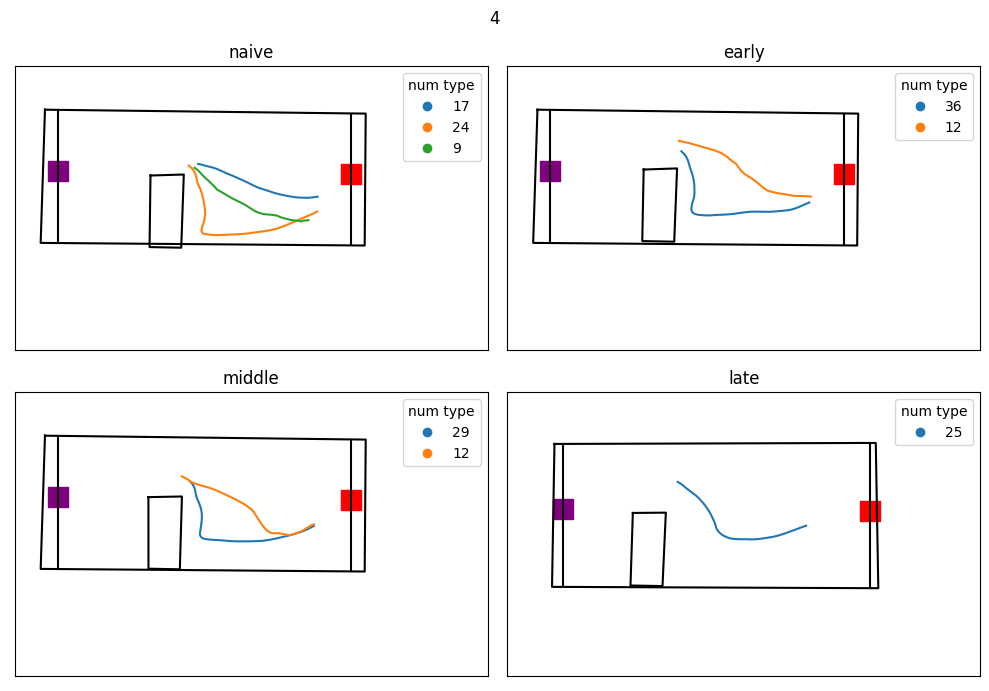

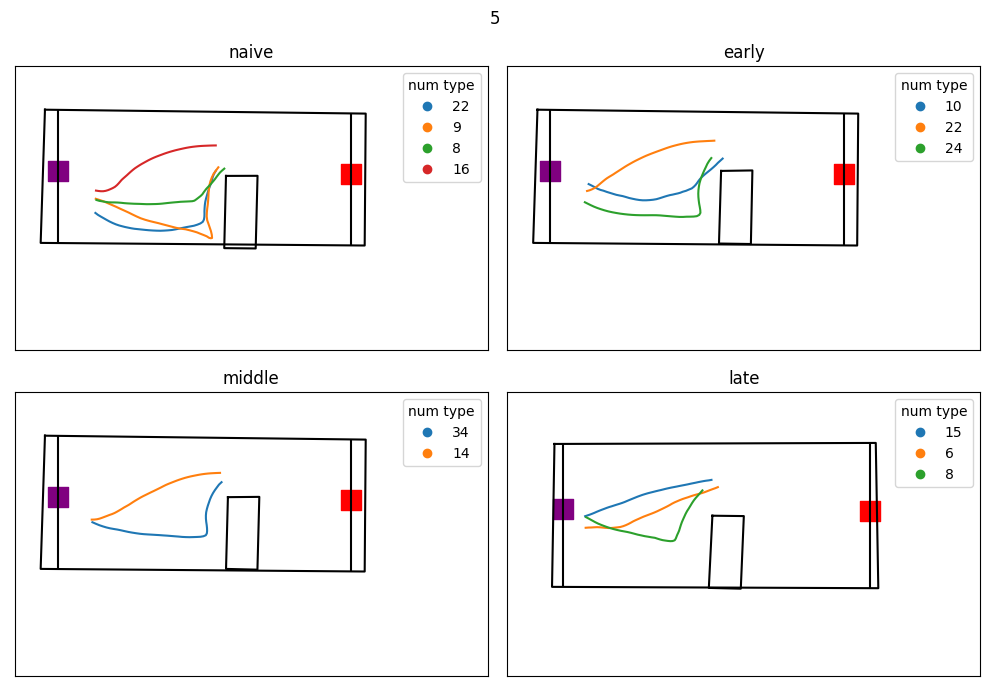

In [139]:
for cluster in dark_long.obstacle_cluster.unique():

    data = dark_long[(dark_long['obstacle_cluster']==cluster) ]
    data = drop_nans_in_columns(data,'obstacle_devations')
    data = drop_nans_in_columns(data,'skill')
    fig,axs = plt.subplots(2,2, figsize = (10,7),tight_layout =False)
    fig.suptitle(cluster)
    for skill,skill_df in data.groupby(['skill']):
        for ax in axs.reshape(-1):
            ax.set_xticks([], [])
            ax.set_yticks([], [])
            #plot_arena(data,ax,obstacle=False)
        if skill == 'naive':
            axs[0,0].set_title(skill)
            plot_arena(dark_long,axs[0,0],obstacle=False)
            plot_obstacle(skill_df,axs[0,0],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == 'early':
            axs[0,1].set_title(skill)
            plot_arena(dark_long,axs[0,1],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[0,1],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[0,1].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[0,1].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == 'middle':
            axs[1,0].set_title(skill)
            plot_arena(dark_long,axs[1,0],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[1,0],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[1,0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[1,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)
        elif skill == 'late':
            axs[1,1].set_title(skill)
            plot_arena(oa_long,axs[1,1],obstacle=False)
            if cluster in [4,5]:
                plot_orginal_obstacle(skill_df,axs[1,1],cluster=cluster,correct=True)
            else:
                plot_orginal_obstacle(skill_df,axs[1,1],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[1,1].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[1,1].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)

In [135]:
oa_cluster_list = [ ]
data = drop_nans_in_columns(dark_long,'skill')
for cluster in data.obstacle_cluster.unique():
    for skill in data.skill.unique():
        df = data[(data['obstacle_cluster']==cluster) & (data['skill']==skill)]
        cluster_dict = create_cluster_dict(df,Skill=True)
        oa_cluster_list.append(cluster_dict)
cluster_df = pd.DataFrame([])
for dictionary in oa_cluster_list:
  cluster_dict = dict( type = [dictionary.get('type')[0] for _ in range(flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object).size)]
                      , obstacle_cluster  = [dictionary.get('obstacle_cluster')[0] for _ in range(flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object).size)] ,
                      inter_cluster_distance = flatten_list_of_arrays(dictionary.get('cluster_distances')).astype(object))
  series = pd.DataFrame(data=cluster_dict)
  cluster_df = cluster_df.append(pd.DataFrame(data=series))

<AxesSubplot: xlabel='obstacle_cluster', ylabel='inter_cluster_distance'>

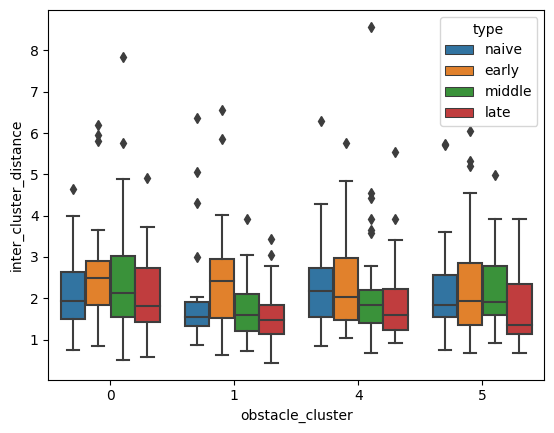

In [136]:
data= cluster_df[cluster_df['inter_cluster_distance']<20]
sns.boxplot(data=data, x="obstacle_cluster", y="inter_cluster_distance", hue="type")

In [7]:

from itertools import combinations

def generate_combinations(input_list):
    """
    Generate all combinations of strings from the input list.

    Parameters:
    input_list (list): The list of strings.

    Returns:
    list of lists: A list where each element is a list containing one or more strings.
    """
    result = []
    for r in range(1, len(input_list) + 1):  # Generate combinations of all lengths from 1 to len(input_list)
        result.extend(combinations(input_list, r))
    return [list(comb) for comb in result]  # Convert tuples to lists



def resample(array,bins):
    """interpolate array across fake time bins"""
    fake_time = np.linspace(0,1,bins)
    xT = np.linspace(0,1,len(array))
    resampled_array = interp1d(xT, array, bounds_error=False)(fake_time)
    resampled_array = pd.Series(resampled_array)
    resampled_array.fillna(method='ffill', axis=0, inplace=True)
    resampled_array.fillna(method='bfill', axis=0, inplace=True)


    return resampled_array.to_numpy()

def create_obstacle_vector(row,key):
    obstacle_vector = row[key][:int(row.obstacle_ind)]
    return obstacle_vector

def create_obstacle_vector_resampled(row,key,bins):
    obstacle_vector = row[key][:int(row.obstacle_ind)]
    return resample(obstacle_vector,bins)


def create_goal_vector_resampled(row,key,bins):
    obstacle_vector = row[key][int(row.obstacle_ind):]
    return resample(obstacle_vector,bins)

def create_feature_vector(row,feature_list):
    feature_array_list = []
    for i in feature_list:
        feature = row[i]
        feature_array_list.append(feature)
    return flatten_list_of_arrays(feature_array_list)

def create_feature_matrix(df,feature_list,chunking =False,chunk = None):
    feature_mat = []
    if chunking ==False:
        for ind, row in df.iterrows():
             feature_vector = create_feature_vector(row,feature_list)
             feature_mat.append(feature_vector)
        return np.vstack(feature_mat)
    else:
        for ind, row in df.iterrows():
             feature_vector = create_feature_vector_chunk(row,feature_list,chunk)
             feature_mat.append(feature_vector)
        return np.vstack(feature_mat)


        
def create_feature_vector_chunk(row,feature_list,chunk):
    feature_array_list = []
    for i in feature_list:
        feature = row[i][chunk[0]:chunk[1]]
        feature_array_list.append(feature)
    return flatten_list_of_arrays(feature_array_list)
    

#def create_feature_vector(df,feature_list):
    
    




In [8]:
def create_obstacle_trajectories_df(df,bins,var_list = ['ts_speed','ts_angle_to_corner','ts_head_body_angle','ts_distance_from_edge']):
    copy =df.copy(deep=True) 
    trajectories_df = copy.dropna(subset = ['obstacle_ind','ts_speed','ts_angle_to_corner','ts_head_body_angle','ts_distance_from_edge'])
    var_list =  ['ts_speed','ts_angle_to_corner','ts_head_body_angle','ts_distance_from_edge']
    for ind,row in trajectories_df.iterrows():
        for i in var_list:
            obstacle_vector = create_obstacle_vector(row,i)
            resampled_obstacle_vector = create_obstacle_vector_resampled(row,i,bins)

            trajectories_df.at[ind,'ob_' + i] = obstacle_vector
            trajectories_df.at[ind,'resampled_ob_' + i] = resampled_obstacle_vector.astype(object)
    var_list =  ['obstacle_nose_x','obstacle_nose_y']
    for ind,row in trajectories_df.iterrows():
        for i in var_list:
            resample_vec = resample(row[i],bins)
            trajectories_df.at[ind,'resampled_' + i] = resample_vec.astype(object)
    return trajectories_df


In [ ]:
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
for feature_list_comb in feature_list_all_comb:
    accuracy_list = []
    for lis in chunk_list:
        feature_mat = create_feature_matrix(light_log,feature_list_comb,chunking=True,chunk=lis)

        X, y = feature_mat, light_log.obstacle_cluster.to_numpy()
        no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
        no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)

        # Standardize the features (optional but recommended)
        #scaler = StandardScaler()
        #X_train_scaled = scaler.fit_transform(X_train)
        #X_test_scaled = scaler.transform(X_test)

        # Create and train a multinomial logistic regression model
        model = LogisticRegression()
        model.fit(X_train, y_train)

        # Make predictions on the testing set
        y_pred = model.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_list.append(accuracy)
    label = " ".join(str(x) for x in feature_list_comb)
    label = label.replace('resampled_ob_ts_', '')
    model_dict = {'type':'non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
    dictionary_list.append(model_dict)

In [70]:
def create_logistic_model_accuracy_score(df,features:list,chunking =False,shuffle_train = False):
    accuracy_list = []
    if chunking==True:
        chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
        for chunk in chunk_list:
            feature_mat = create_feature_matrix(df,features,chunking=True,chunk=chunk)
            X, y = feature_mat, df.obstacle_cluster.to_numpy()
            no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
            no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
            X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)
            if shuffle_train == True:
                np.random.shuffle(y_train)
            else:
                None
            model = LogisticRegression()
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            accuracy = accuracy_score(y_test, y_pred)
            accuracy_list.append(accuracy)
        return accuracy_list,chunk_list
    else:
        feature_mat = create_feature_matrix(df,features,chunking=False,chunk=None)
        X, y = feature_mat, df.obstacle_cluster.to_numpy()
        no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
        no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
        X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)
        if shuffle_train == True:
            np.random.shuffle(y_train)
        else:
            None
        model = LogisticRegression()
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_list.append(accuracy)
        return accuracy_list
            



In [79]:
feature_list =['ts_speed','ts_angle_to_corner','ts_head_body_angle','ts_distance_from_edge'] 
feature_mat = create_feature_matrix(test,feature_list,chunking=True,chunk=[30,45])

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 60 and the array at index 385 has size 59

In [ ]:
axs[0,0].set_title(skill)
            plot_arena(oa_long,axs[0,0],obstacle=False)
            plot_orginal_obstacle(skill_df,axs[0,0],cluster=cluster)
            streamlines,matx,maty = create_streamlines(skill_df)
            clusters = cluster_streamlines(streamlines)
            color_pallete = 'tab10'
            color_labels = [len(cluster) for cluster in clusters]
            rgb_values = sns.color_palette(color_pallete, len(color_labels))
            color_map = dict(zip(color_labels, rgb_values))
            markers = [plt.Line2D([0,0],[0,0],c=color, marker='o', linestyle='') for color in color_map.values()]
            axs[0,0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
            for i in list(range(len(clusters.centroids))):
                color = color_map.get(len(clusters[i]))
                axs[0,0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)

In [ ]:

for ind in clusters[0].indices:
    axs[0,1].plot(matx[ind],maty[ind],c = 'grey',alpha = .5)
axs[0,1].plot(clusters.centroids[0][:,0],clusters.centroids[0][:,1],c = 'black')

In [6]:
con_dark = create_consective_df_new(dark)

In [7]:
con_dark_long,con_dark_short,con_dark_middle = create_df_by_type(con_dark)

In [2]:
data = con_dark_long[(con_dark_long['obstacle_cluster']==0)& (con_dark_long['consective_type']==1)]
streamlines,matx,maty = create_streamlines(data)
clusters = cluster_streamlines(streamlines,num_cluster=0,threshold=0)
fig,ax = plt.subplots(1,2,figsize = (15,5))
plot_arena(data,ax[0],obstacle=True)
color_pallete = 'tab10'
color_labels = [len(cluster) for cluster in clusters]
rgb_values = sns.color_palette(color_pallete, len(color_labels))
color_map = dict(zip(color_labels, rgb_values))
ax[0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
for i in list(range(len(clusters.centroids))):
    color = color_map.get(len(clusters[i]))
    ax[0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)

NameError: name 'con_dark_long' is not defined

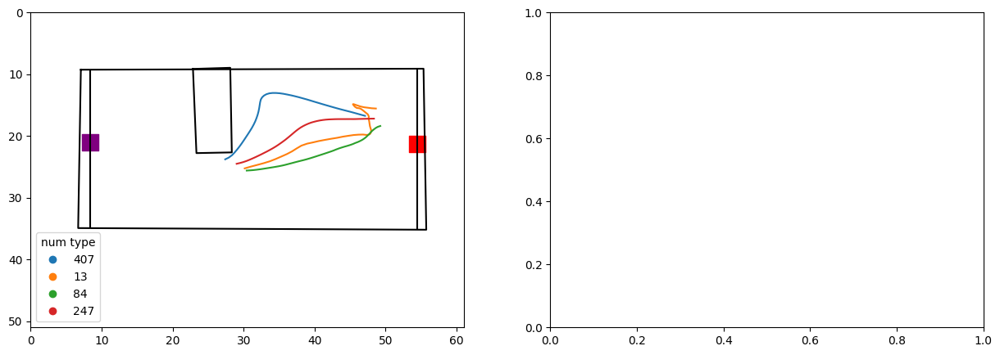

In [315]:
data = oa_long[oa_long['obstacle_cluster']==0]
streamlines,matx,maty = create_streamlines(data)
clusters = cluster_streamlines(streamlines)
fig,ax = plt.subplots(1,2,figsize = (15,5))
plot_arena(data,ax[0],obstacle=True)
color_pallete = 'tab10'
color_labels = [len(cluster) for cluster in clusters]
rgb_values = sns.color_palette(color_pallete, len(color_labels))
color_map = dict(zip(color_labels, rgb_values))
ax[0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
for i in list(range(len(clusters.centroids))):
    color = color_map.get(len(clusters[i]))
    ax[0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)


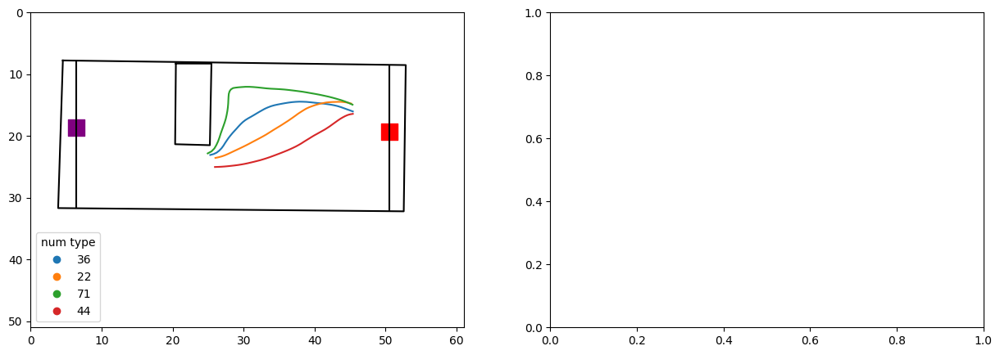

In [8]:
data = dark_long[dark_long['obstacle_cluster']==0]
streamlines,matx,maty = create_streamlines(data)
clusters = cluster_streamlines(streamlines)
fig,ax = plt.subplots(1,2,figsize = (15,5))
plot_arena(data,ax[0],obstacle=True)
color_pallete = 'tab10'
color_labels = [len(cluster) for cluster in clusters]
rgb_values = sns.color_palette(color_pallete, len(color_labels))
color_map = dict(zip(color_labels, rgb_values))
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
ax[0].legend(markers, color_map.keys(), numpoints=1,title = 'num type')
for i in list(range(len(clusters.centroids))):
    color = color_map.get(len(clusters[i]))
    ax[0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)

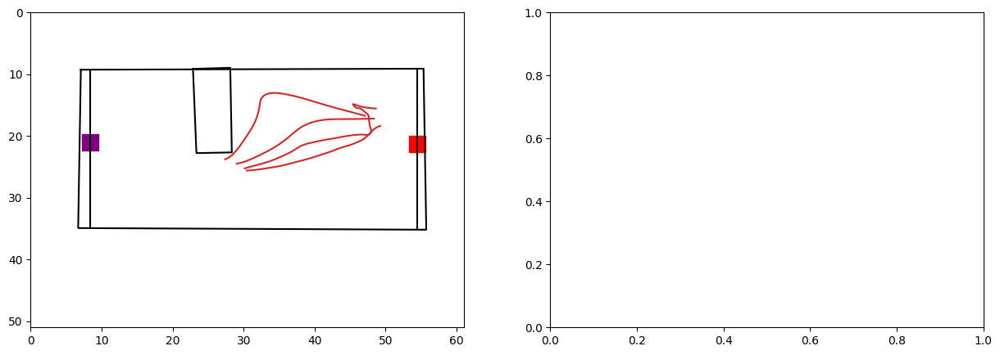

In [310]:
data = oa_long[oa_long['obstacle_cluster']==0]
streamlines,matx,maty = create_streamlines(data)
clusters = cluster_streamlines(streamlines)
fig,ax = plt.subplots(1,2,figsize = (15,5))
plot_arena(data,ax[0],obstacle=True)
for i in list(range(len(clusters.centroids))):
    ax[0].plot(clusters.centroids[i][:,0],clusters.centroids[i][:,1],c=color)


(array([3.72690066e-05, 0.00000000e+00, 1.24230022e-05, 5.49717847e-03,
        6.10590558e-02, 5.43071541e-02, 3.78031957e-02, 4.02256811e-02,
        3.77597152e-02, 4.48470379e-03]),
 array([-16.51561105, -12.36943988,  -8.2232687 ,  -4.07709753,
          0.06907365,   4.21524482,   8.361416  ,  12.50758717,
         16.65375834,  20.79992952,  24.94610069]),
 <BarContainer object of 10 artists>)

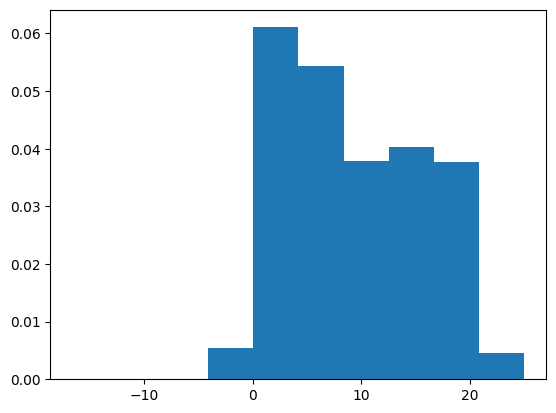

In [24]:

data = oa_long[(oa_long['obstacle_cluster']==1)]
lateral_error = []
for ind,row in data.iterrows():
    lateral_error.append(create_obstacle_vector(row,'ts_distance_from_edge'))
    

lateral_error = flatten_list_of_arrays(lateral_error)
plt.hist(lateral_error,density=True)

In [29]:
row.lateral_error[:10]

array([-6.466445703402181, -6.519524030764819, -6.6153188935284835,
       -6.556620534570653, -6.373112712885968, -5.9990053401867005,
       -5.650832401300807, -5.379167398567805, -5.163952516087313,
       -4.8680248467833565], dtype=object)

(array([0.00174316, 0.01167919, 0.04288181, 0.11347992, 0.1955829 ,
        0.16586197, 0.09020869, 0.02553734, 0.00636255, 0.00122021]),
 array([-13.38369526, -11.85594617, -10.32819708,  -8.80044799,
         -7.2726989 ,  -5.74494981,  -4.21720072,  -2.68945162,
         -1.16170253,   0.36604656,   1.89379565]),
 <BarContainer object of 10 artists>)

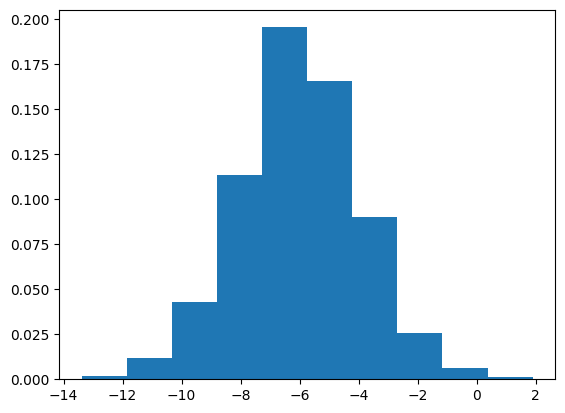

In [32]:

data = oa_long[(oa_long['obstacle_cluster']==0)]
lateral_error = []
for ind,row in data.iterrows():
    lateral_error.append(row.lateral_error[:10])
    

lateral_error = flatten_list_of_arrays(lateral_error)
plt.hist(lateral_error,density=True)

(array([0.00963769, 0.05231888, 0.10188413, 0.12024163, 0.15971025,
        0.12804357, 0.12024163, 0.07021744, 0.02753625, 0.00413044]),
 array([-12.29812641, -11.03862012,  -9.77911382,  -8.51960753,
         -7.26010124,  -6.00059494,  -4.74108865,  -3.48158236,
         -2.22207607,  -0.96256977,   0.29693652]),
 <BarContainer object of 10 artists>)

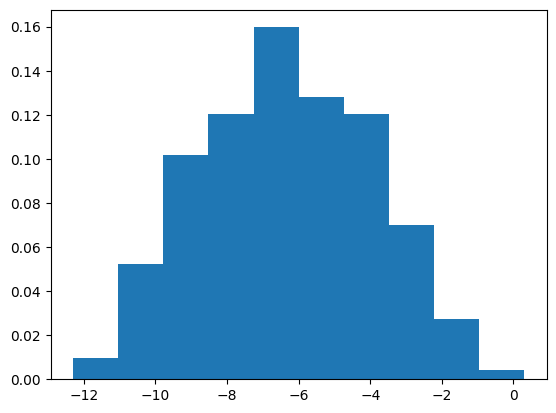

In [33]:

data = dark_long[(dark_long['obstacle_cluster']==0)]
lateral_error = []
for ind,row in data.iterrows():
    lateral_error.append(row.lateral_error[:10])
    

lateral_error = flatten_list_of_arrays(lateral_error)
plt.hist(lateral_error,density=True)

(array([0.0299106 , 0.1255395 , 0.10062286, 0.06348697, 0.04372366,
        0.04600813, 0.04993954, 0.00701279, 0.00228447, 0.00132818]),
 array([-13.04370065, -10.91539209,  -8.78708353,  -6.65877497,
         -4.53046641,  -2.40215785,  -0.27384929,   1.85445928,
          3.98276784,   6.1110764 ,   8.23938496]),
 <BarContainer object of 10 artists>)

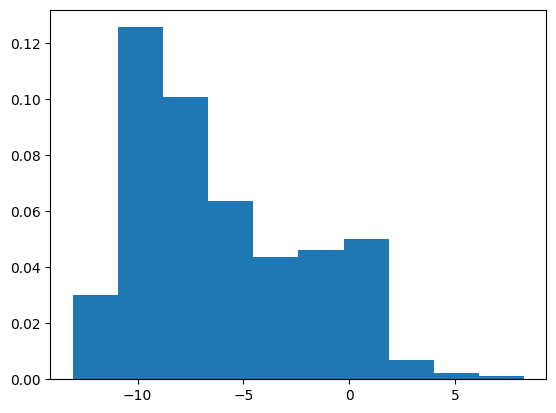

In [21]:

data = dark_long[(dark_long['obstacle_cluster']==1)]
lateral_error = []
for ind,row in data.iterrows():
    lateral_error.append(create_obstacle_vector(row,'lateral_error'))
    

lateral_error = flatten_list_of_arrays(lateral_error)
plt.hist(lateral_error,density=True)

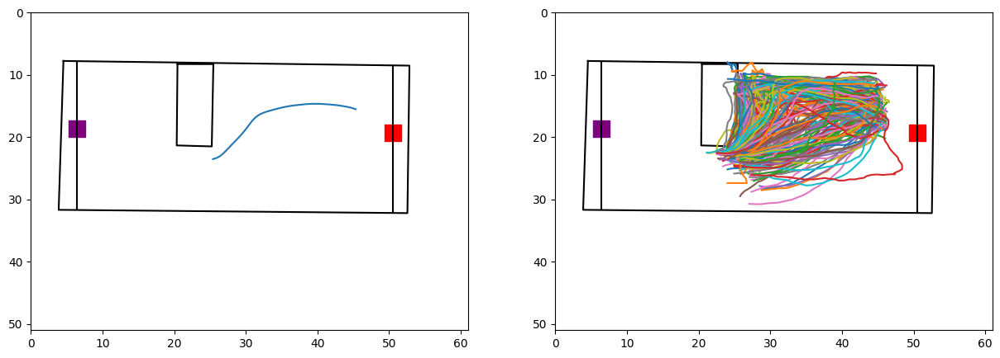

In [9]:

data = dark_long[(dark_long['obstacle_cluster']==0)]
fig,ax = plt.subplots(1,2,figsize = (15,5))
plot_arena(data,ax[0],obstacle=True)
plot_arena(data,ax[1],obstacle=True)
interp_x = get_mean_of_df(data,'obstacle_nose_x',50)
interp_y = get_mean_of_df(data,'obstacle_nose_y',50)
#ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
ax[0].plot(interp_x,interp_y)
for ind,row in data.iterrows(): 
    ax[1].plot(row.obstacle_nose_x,row.obstacle_nose_y)

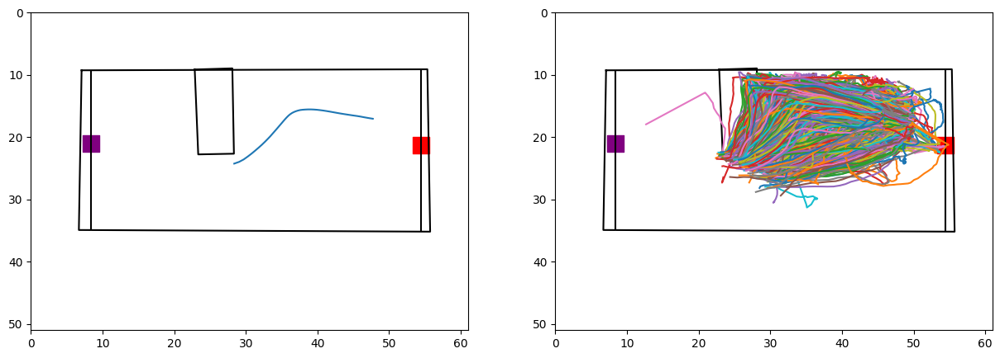

In [15]:

data = oa_long[(oa_long['obstacle_cluster']==0)]
fig,ax = plt.subplots(1,2,figsize = (15,5))
plot_arena(data,ax[0],obstacle=True)
plot_arena(data,ax[1],obstacle=True)
interp_x = get_mean_of_df(data,'obstacle_nose_x',50)
interp_y = get_mean_of_df(data,'obstacle_nose_y',50)
#ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
ax[0].plot(interp_x,interp_y)
for ind,row in data.iterrows(): 
    ax[1].plot(row.obstacle_nose_x,row.obstacle_nose_y)

In [21]:
matx.flatten()

array([45.63603092, 45.48610515, 45.3091946 , ..., 33.06180509,
       32.19215016, 31.39534346])

<AxesSubplot: >

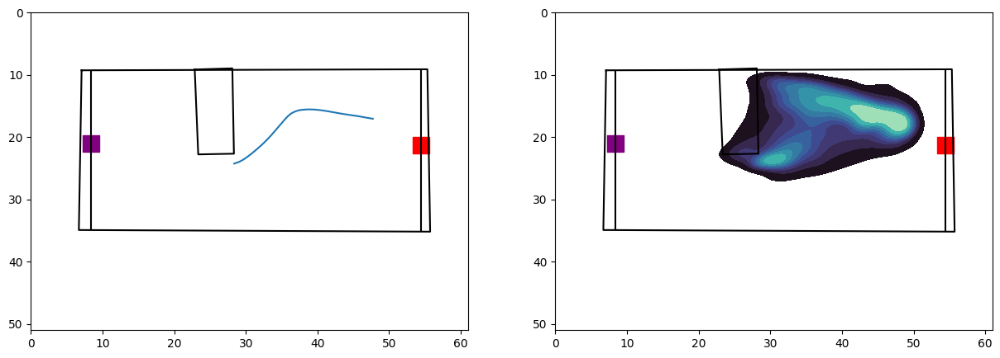

In [35]:

data = oa_long[(oa_long['obstacle_cluster']==0)]
fig,ax = plt.subplots(1,2,figsize = (15,5))
plot_arena(data,ax[0],obstacle=True)
plot_arena(data,ax[1],obstacle=True)
interp_x,matx = get_mean_of_df(data,'obstacle_nose_x',50,matx=True)
interp_y,maty = get_mean_of_df(data,'obstacle_nose_y',50,matx=True)
#ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
ax[0].plot(interp_x,interp_y)
sns.kdeplot(x = matx.flatten(),y=maty.flatten(),ax=ax[1],cmap='mako',fill=True,gridsize=100,common_norm = True)

<AxesSubplot: >

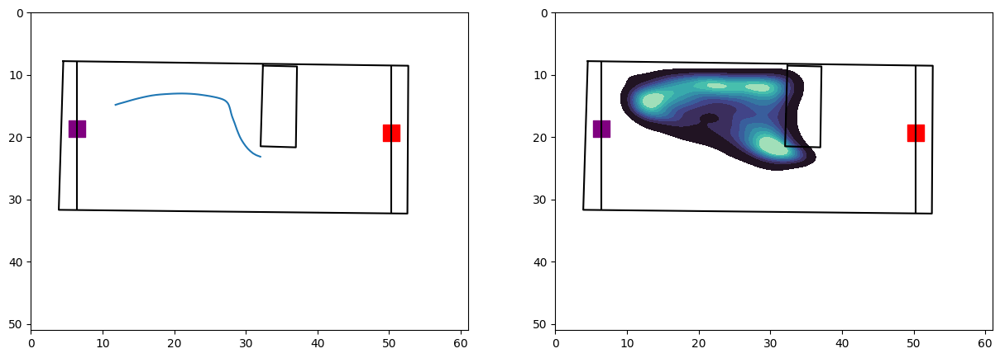

In [37]:

data = dark_long[(dark_long['obstacle_cluster']==1)]
fig,ax = plt.subplots(1,2,figsize = (15,5))
plot_arena(data,ax[0],obstacle=True)
plot_arena(data,ax[1],obstacle=True)
interp_x,matx = get_mean_of_df(data,'obstacle_nose_x',50,matx=True)
interp_y,maty = get_mean_of_df(data,'obstacle_nose_y',50,matx=True)
#ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
ax[0].plot(interp_x,interp_y)
sns.kdeplot(x = matx.flatten(),y=maty.flatten(),ax=ax[1],cmap='mako',fill=True,gridsize=100,common_norm = True)


In [40]:
from scipy.stats import gaussian_kde
xy = np.vstack([matx.flatten(),maty.flatten()])
z = gaussian_kde(xy)(xy)
idx = z.argsort()
x, y, z = x[idx], y[idx], z[idx]
ax.scatter(x, y, c=z, s=50)

In [39]:
xy

array([[12.44433682, 13.57271327, 14.66224494, ..., 29.70621555,
        30.17936394, 30.70148884],
       [16.89183769, 16.96966081, 17.02313536, ..., 22.18683966,
        22.35327811, 22.53790012]])

In [46]:
interpolate_array(x)

array([12.62091025, 15.29783723, 18.2665634 , ..., 31.22347941,
       31.68703882, 32.19856626])

In [ ]:

data = oa_long[(oa_long['obstacle_cluster']==4)]
fig,ax = plt.subplots(1,2,figsize = (15,5))
plot_arena(data,ax[0],obstacle=True)
plot_arena(data,ax[1],obstacle=True)
interp_x,matx = get_mean_of_df(data,'obstacle_nose_x',50,matx=True)
interp_y,maty = get_mean_of_df(data,'obstacle_nose_y',50,matx=True)
#ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
ax[0].plot(interp_x,interp_y)
x = interpolate_array(matx.flatten())
y = interpolate_array(maty.flatten())
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
idx = z.argsort()
x, y, z = x[idx], y[idx], z[idx]
ax[1].scatter(x, y, c=z, s=10)

In [60]:
data

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,skill,ts_head_body_angle


In [59]:
data[['gt_obstacleTL_y_cm',
'gt_obstacleTR_y_cm','gt_obstacleBR_y_cm',
'gt_obstacleBL_y_cm',
'gt_obstacleTL_y_cm']]

,gt_obstacleTL_y_cm,gt_obstacleTR_y_cm,gt_obstacleBR_y_cm,gt_obstacleBL_y_cm,gt_obstacleTL_y_cm


In [58]:
pd.unique(data[['gt_obstacleTL_y_cm',
'gt_obstacleTR_y_cm','gt_obstacleBR_y_cm',
'gt_obstacleBL_y_cm',
'gt_obstacleTL_y_cm']].values.ravel('K'))

array([], dtype=float64)

IndexError: index 0 is out of bounds for axis 0 with size 0

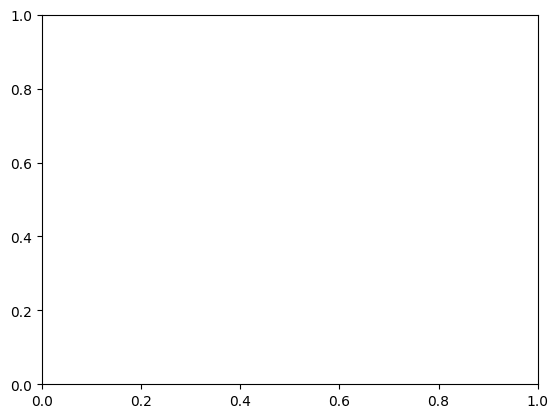

In [57]:
fig,ax =plt.subplots()
plot_orginal_obstacle(data,ax,cluster = i)

In [72]:
oa_long.skill.unique()[3]

nan

In [74]:
test=drop_nans_in_columns(oa_long,'skill')
for skill in test.skill.unique():
    print(skill)

naive
early
middle
late


In [73]:
oa_long[oa_long['skill']==oa_long.skill.unique()[3]]

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,skill,ts_head_body_angle


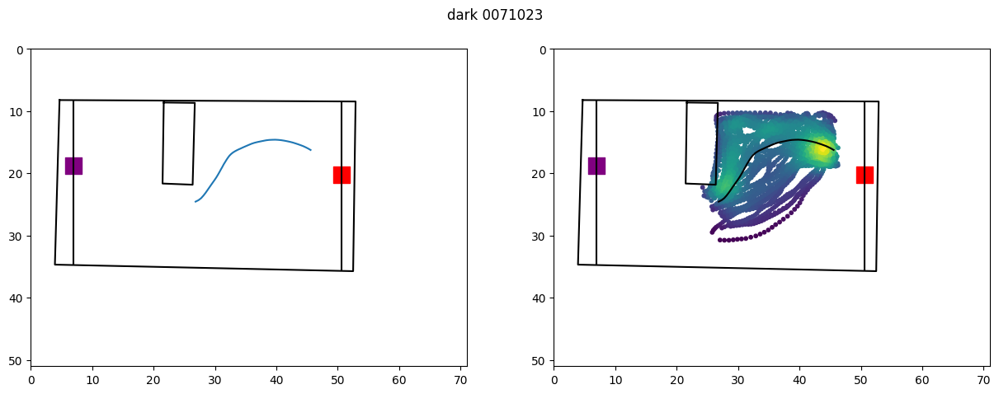

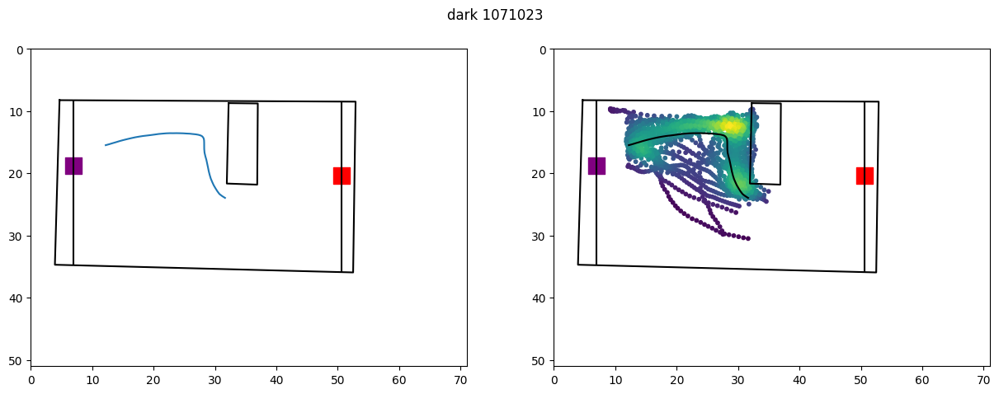

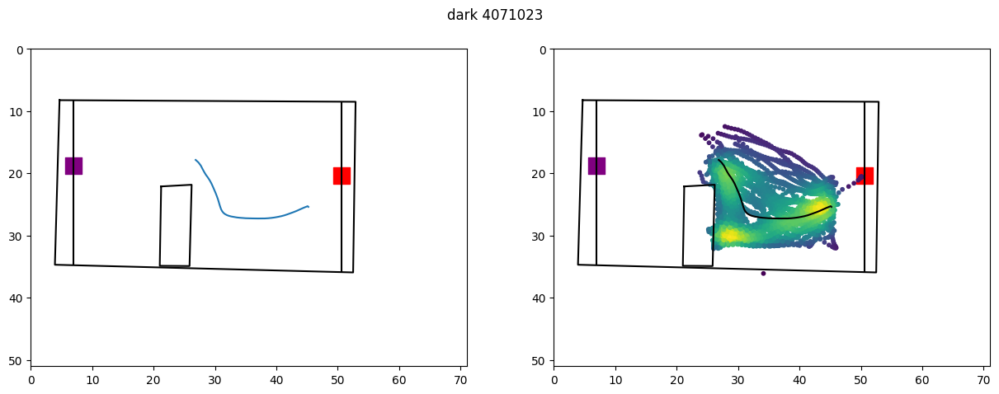

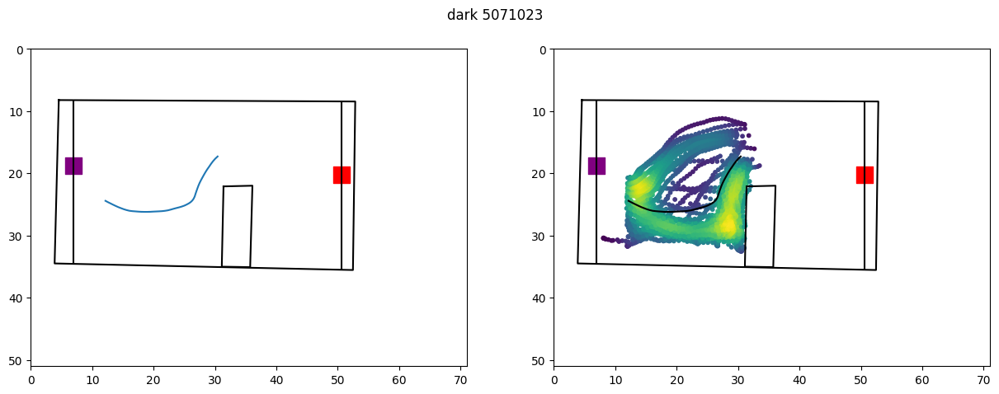

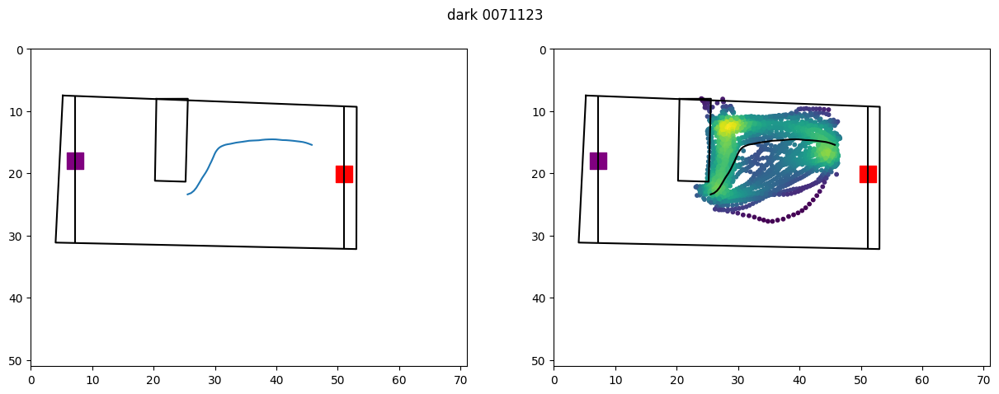

...

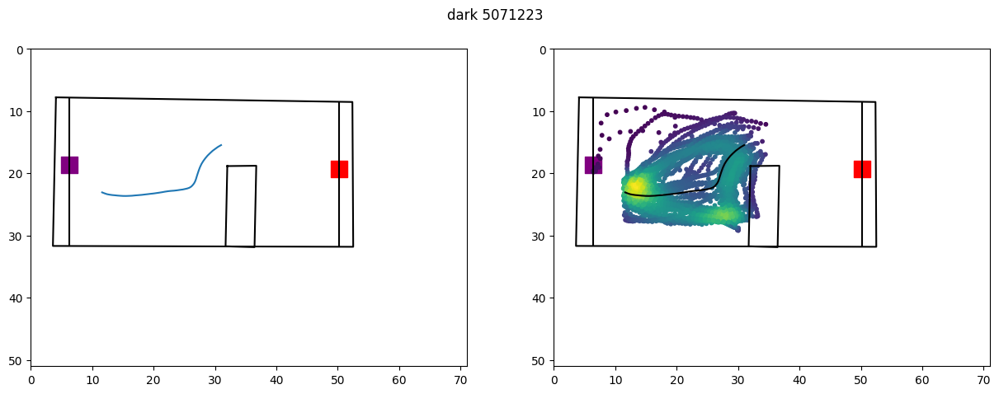

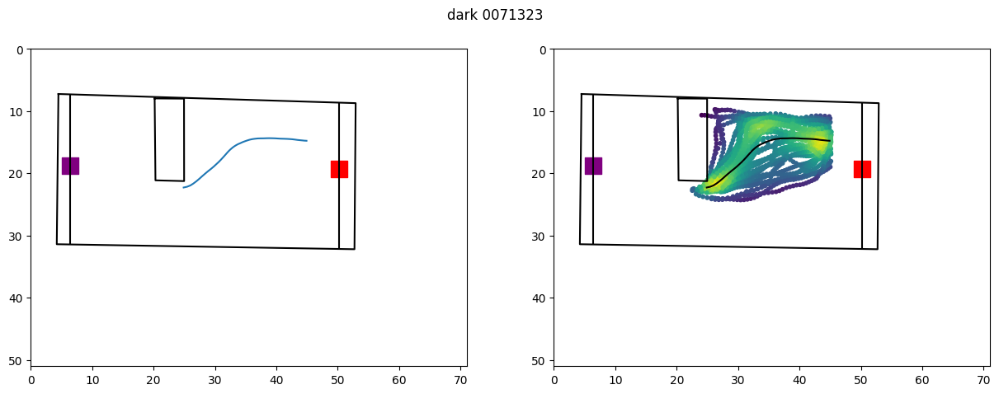

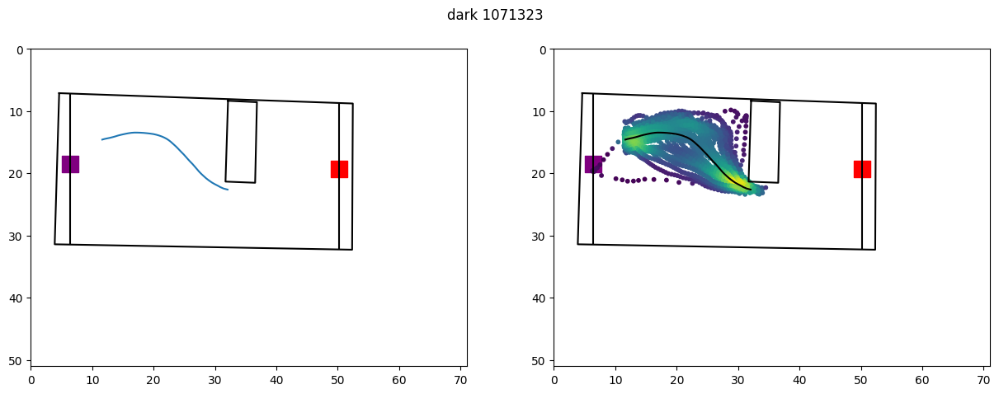

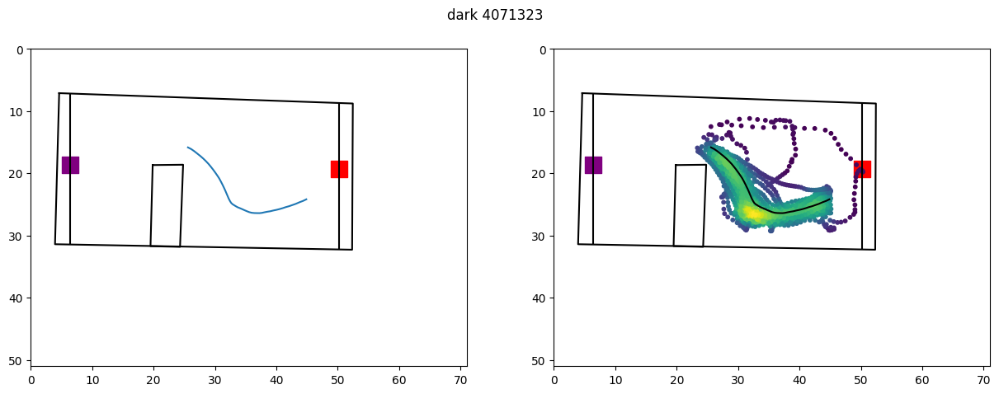

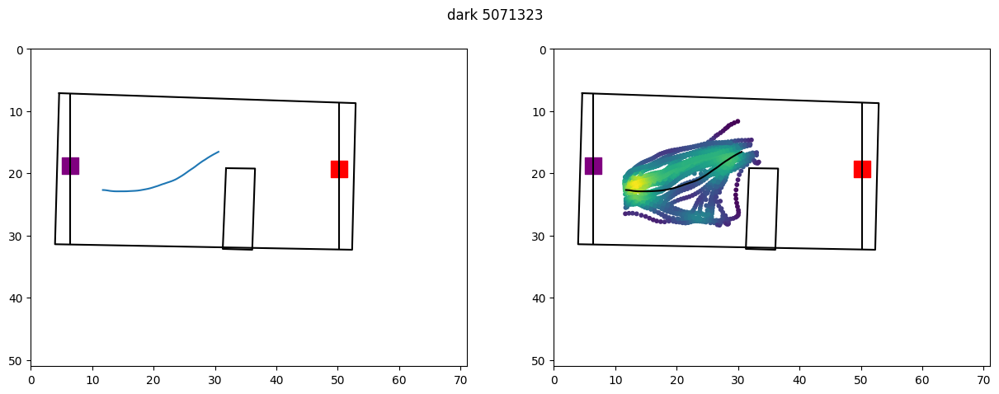

In [85]:
df = drop_nans_in_columns(dark_long,'date')
for date in df.date.unique():
    for i in df.obstacle_cluster.unique():
        data = df[(df['obstacle_cluster']==i)&(df['date']==date)]
        fig,ax = plt.subplots(1,2,figsize = (15,5))
        plot_arena(data,ax[0])
        plot_orginal_obstacle(data,ax[0],cluster = i)
        plot_arena(data,ax[1])
        plot_orginal_obstacle(data,ax[1],cluster = i)
        interp_x,matx = get_mean_of_df(data,'obstacle_nose_x',50,matx=True)
        interp_y,maty = get_mean_of_df(data,'obstacle_nose_y',50,matx=True)
        fig.suptitle('dark' +' ' + str(i) + str(date))
        #ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
        ax[0].plot(interp_x,interp_y)
        x = interpolate_array(matx.flatten())
        y = interpolate_array(maty.flatten())
        xy = np.vstack([x,y])
        z = gaussian_kde(xy)(xy)

        ax[1].scatter(x, y, c=z, s=10)
        ax[1].plot(interp_x,interp_y,c = 'black')

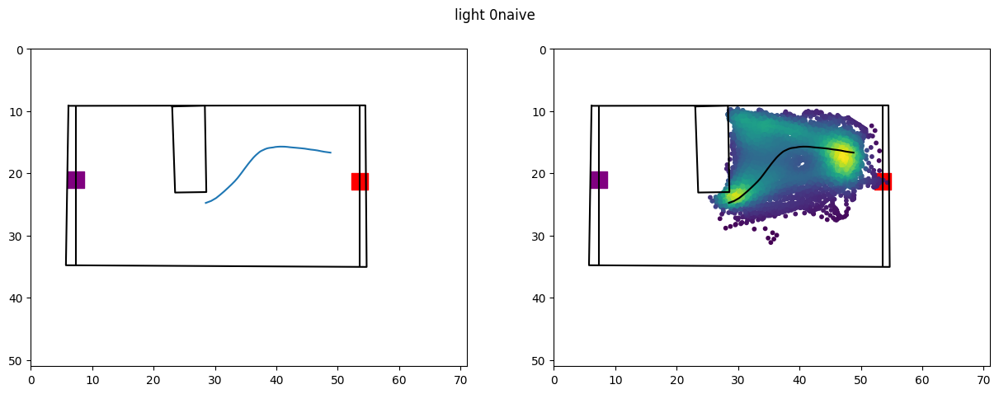

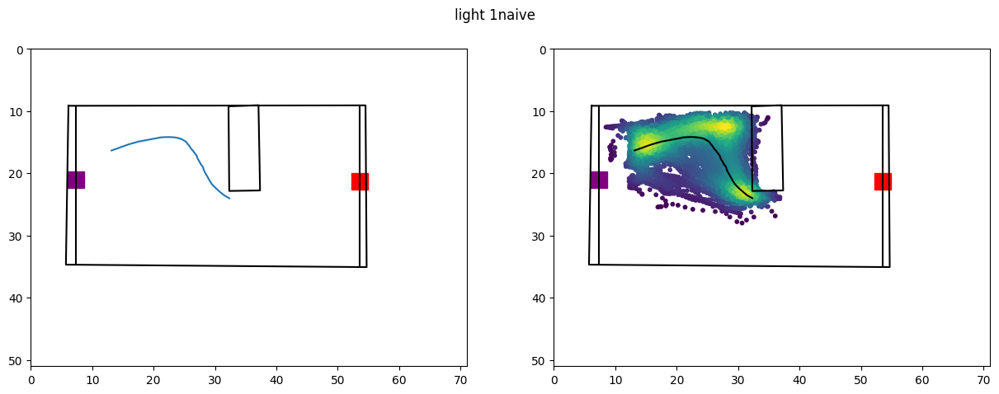

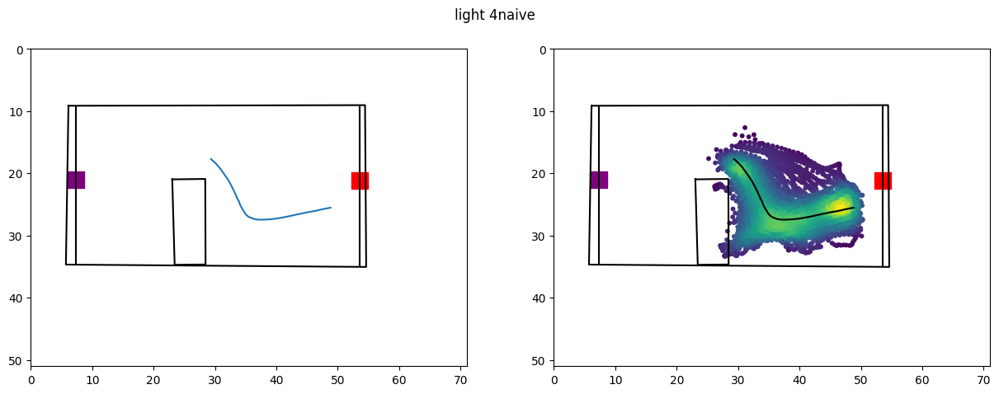

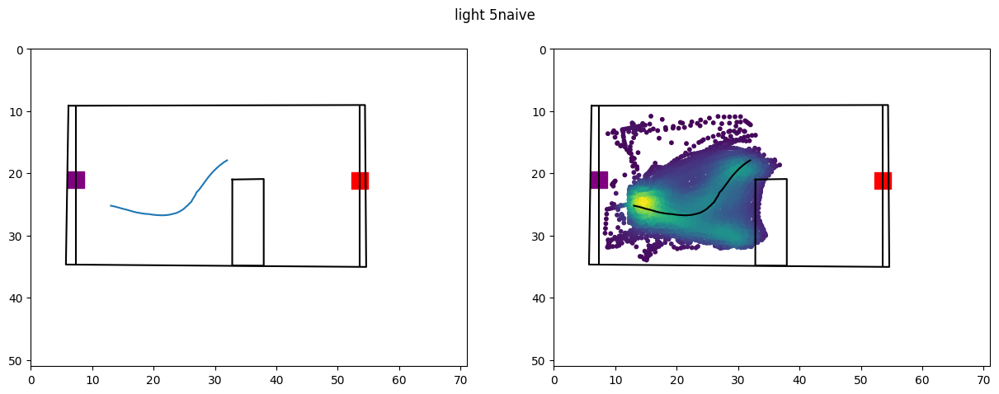

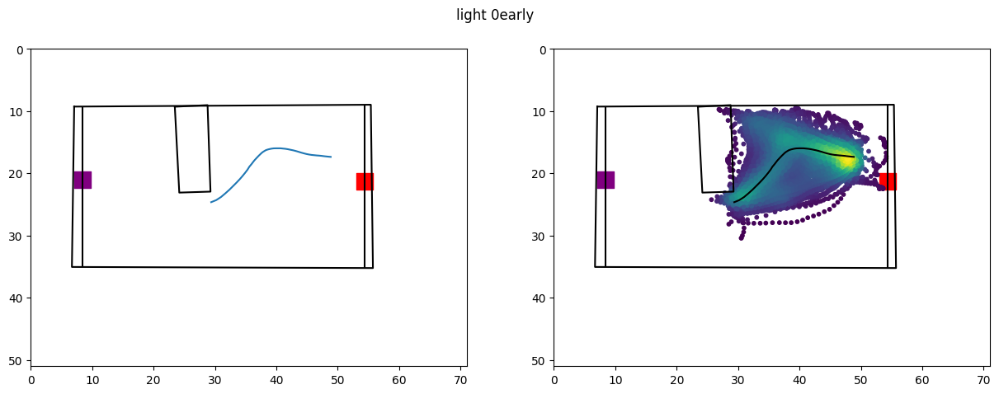

...

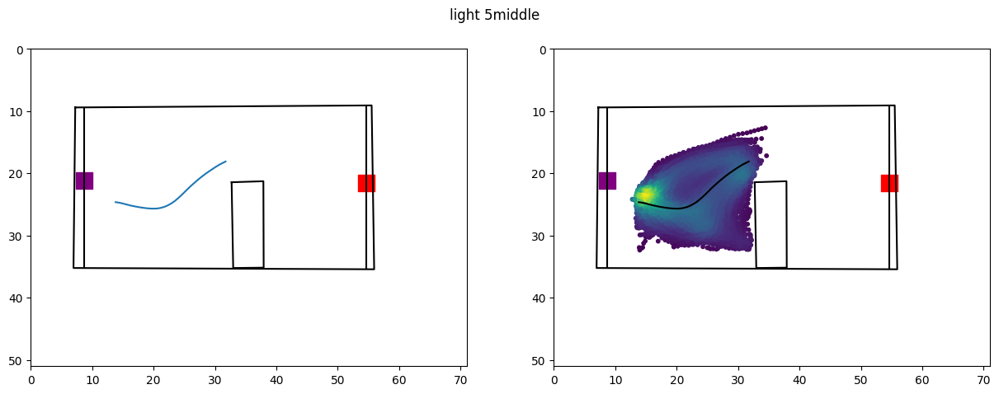

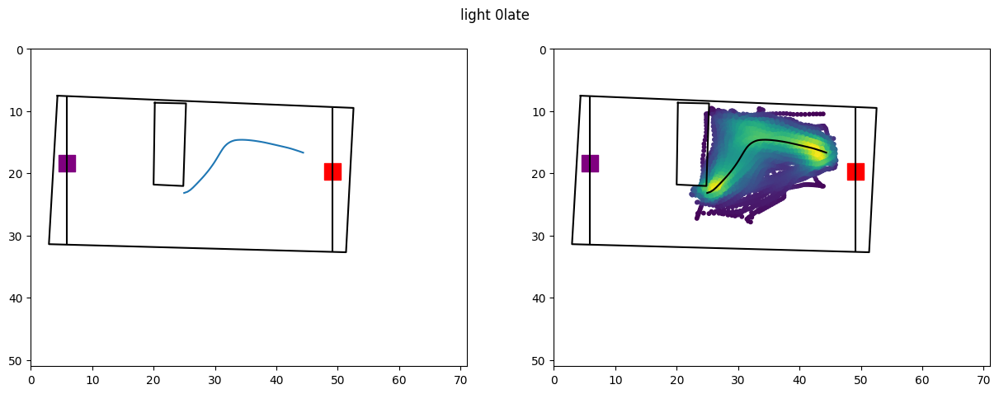

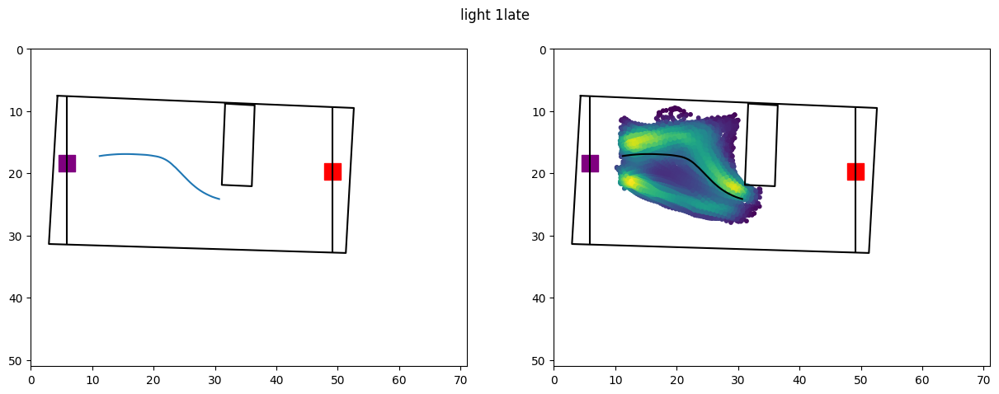

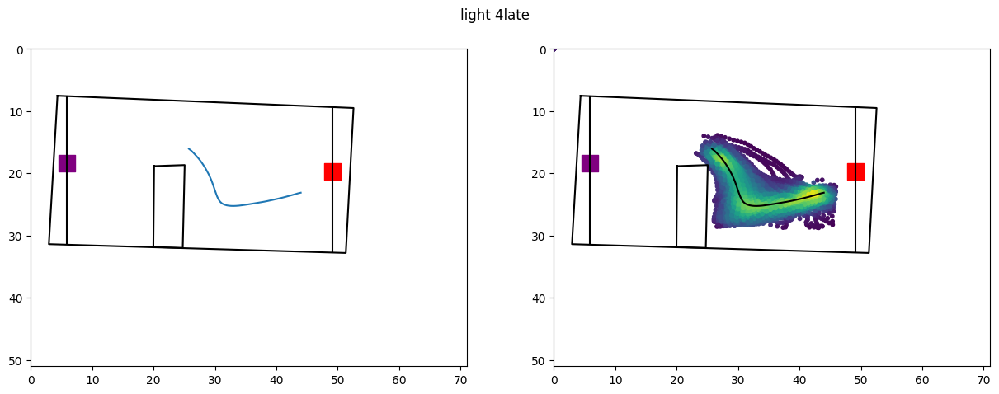

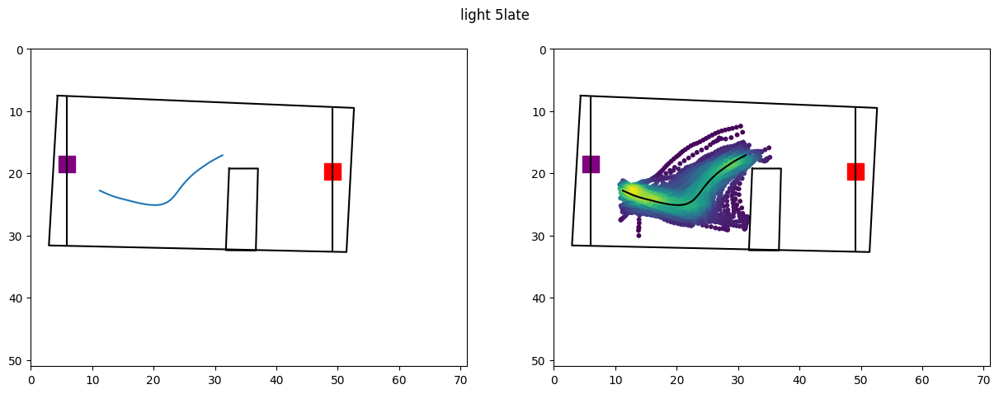

In [86]:
df = drop_nans_in_columns(oa_long,'skill')
for skill in df.skill.unique():
    for i in df.obstacle_cluster.unique():
        data = df[(df['obstacle_cluster']==i)&(df['skill']==skill)]
        fig,ax = plt.subplots(1,2,figsize = (15,5))
        plot_arena(data,ax[0])
        plot_orginal_obstacle(data,ax[0],cluster = i)
        plot_arena(data,ax[1])
        plot_orginal_obstacle(data,ax[1],cluster = i)
        interp_x,matx = get_mean_of_df(data,'obstacle_nose_x',50,matx=True)
        interp_y,maty = get_mean_of_df(data,'obstacle_nose_y',50,matx=True)
        fig.suptitle('light' +' ' + str(i) + str(skill))
        #ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
        ax[0].plot(interp_x,interp_y)
        x = interpolate_array(matx.flatten())
        y = interpolate_array(maty.flatten())
        xy = np.vstack([x,y])
        z = gaussian_kde(xy)(xy)

        ax[1].scatter(x, y, c=z, s=10)
        ax[1].plot(interp_x,interp_y,c = 'black')

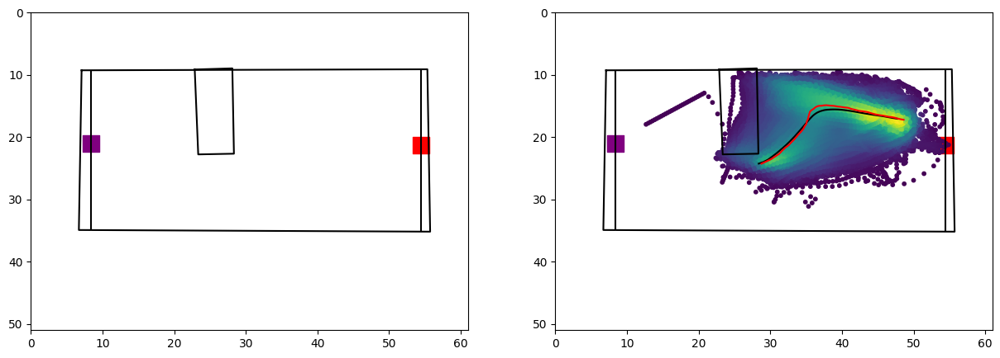

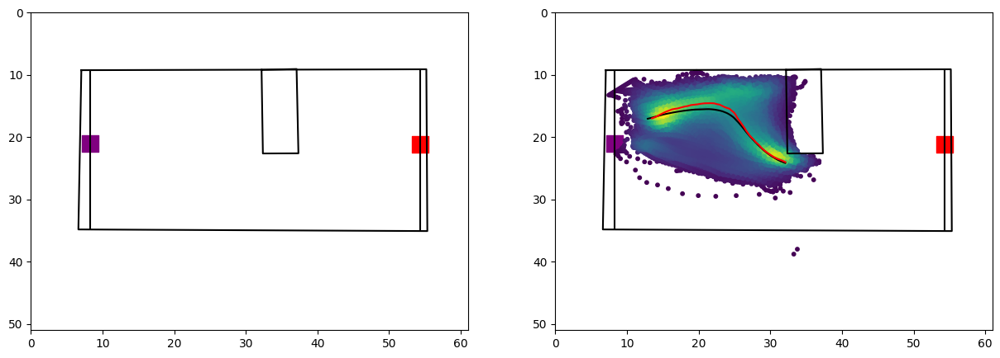

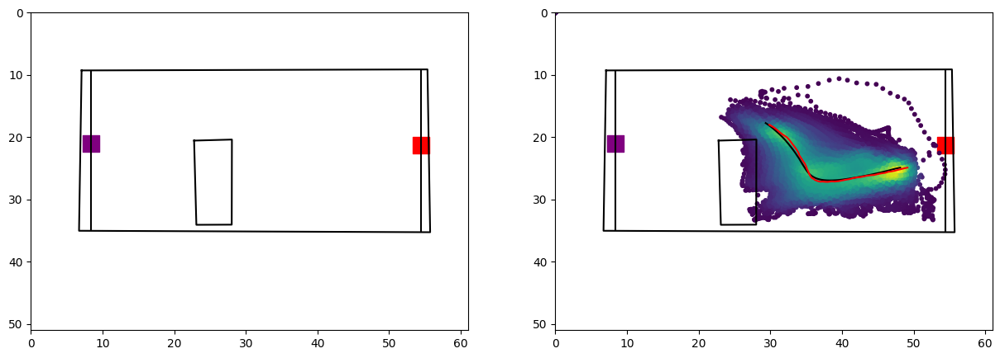

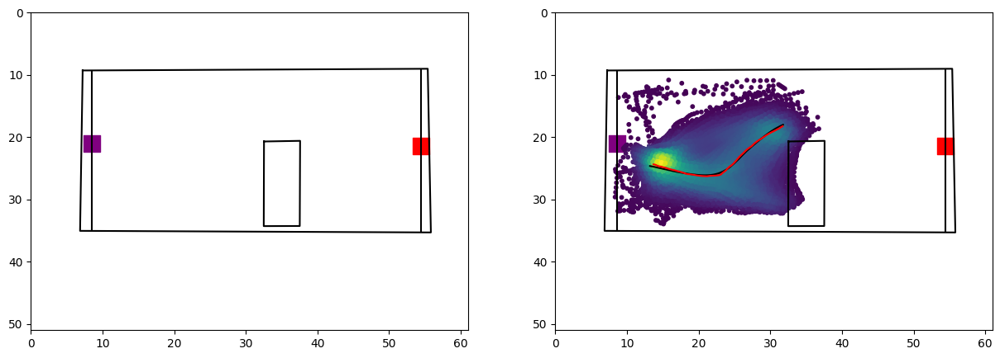

In [89]:
for i in oa_long.obstacle_cluster.unique():
    data = oa_long[(oa_long['obstacle_cluster']==i)]
    fig,ax = plt.subplots(1,2,figsize = (15,5))
    plot_arena(data,ax[0],obstacle=True)
    plot_arena(data,ax[1],obstacle=True)
    mean_interp_x,matx = get_mean_of_df(data,'obstacle_nose_x',50,matx=True)
    mean_interp_y,maty = get_mean_of_df(data,'obstacle_nose_y',50,matx=True)
    median_interp_x,matx = get_median_of_df(data,'obstacle_nose_x',50,matx=True)
    median_interp_x_interp_y,maty = get_median_of_df(data,'obstacle_nose_y',50,matx=True)
    #ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
    #ax[0].plot(interp_x,interp_y)
    x = interpolate_array(matx.flatten())
    y = interpolate_array(maty.flatten())
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)

    ax[1].scatter(x, y, c=z, s=10)
    ax[1].plot(mean_interp_x,mean_interp_y,c = 'black')
    ax[1].plot(median_interp_x,median_interp_x_interp_y,c = 'red')

In [92]:
flatten_list_of_arrays(data.obstacle_nose_x.to_list())

array([12.32728133, 12.58959602, 12.71095169, ..., 30.92095787,
       31.4297554 , 31.66897188])

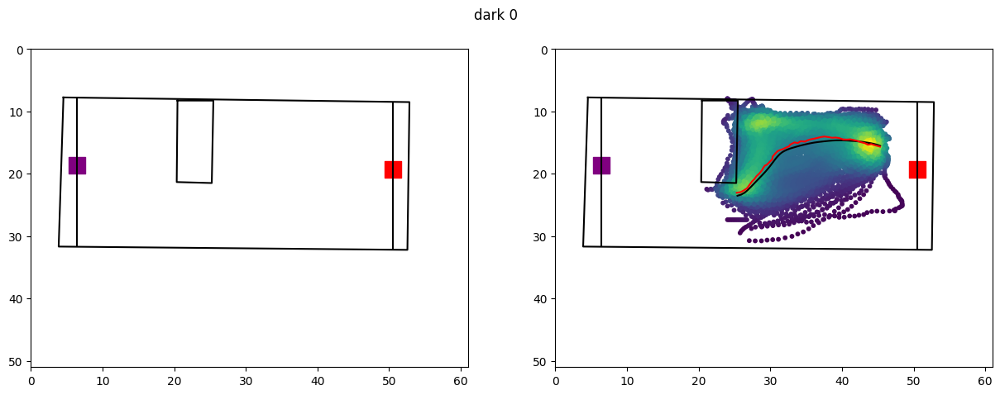

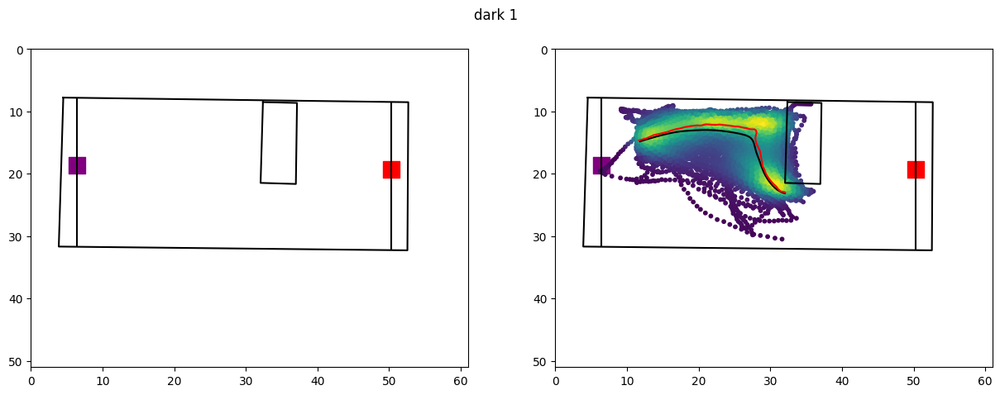

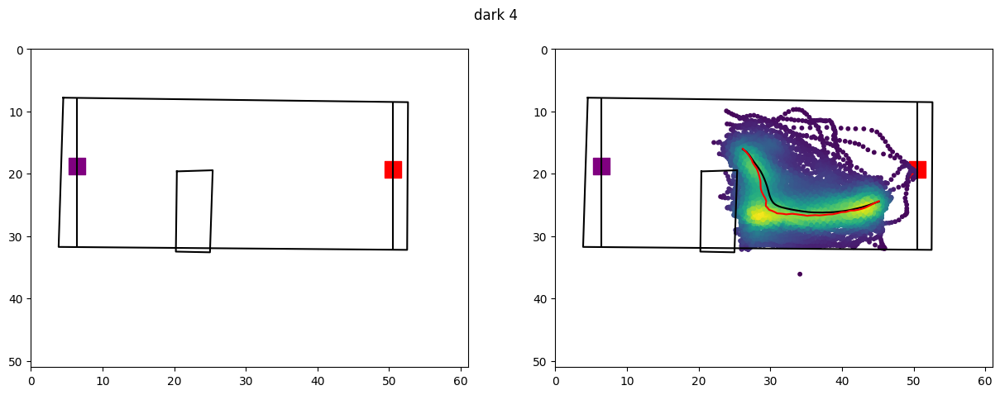

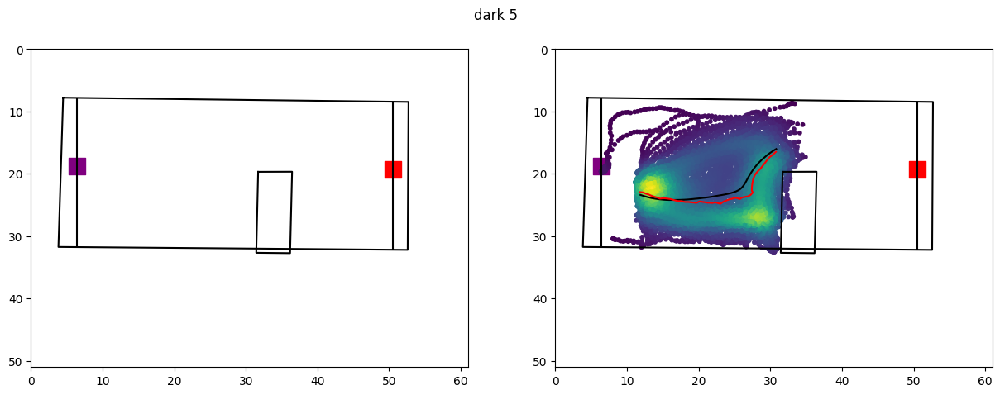

In [93]:
df = dark_long[(dark_long['date']!='071323')]
for i in dark_long.obstacle_cluster.unique():
    data = dark_long[(dark_long['obstacle_cluster']==i)]
    fig,ax = plt.subplots(1,2,figsize = (15,5))
    fig.suptitle('dark' +' ' + str(i))
    plot_arena(data,ax[0],obstacle=True)
    plot_arena(data,ax[1],obstacle=True)
    mean_interp_x,matx = get_mean_of_df(data,'obstacle_nose_x',50,matx=True)
    mean_interp_y,maty = get_mean_of_df(data,'obstacle_nose_y',50,matx=True)
    median_interp_x,matx = get_median_of_df(data,'obstacle_nose_x',50,matx=True)
    median_interp_x_interp_y,maty = get_median_of_df(data,'obstacle_nose_y',50,matx=True)
    #ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
    #ax[0].plot(interp_x,interp_y)
    x = interpolate_array(flatten_list_of_arrays(data.obstacle_nose_x.to_list()))
    y = interpolate_array(flatten_list_of_arrays(data.obstacle_nose_y.to_list()))
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)

    ax[1].scatter(x, y, c=z, s=10)
    ax[1].plot(mean_interp_x,mean_interp_y,c = 'black')
    ax[1].plot(median_interp_x,median_interp_x_interp_y,c = 'red')

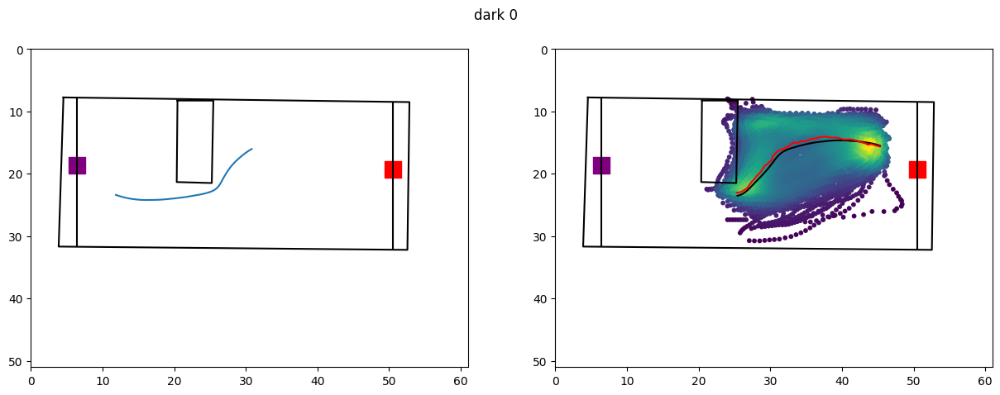

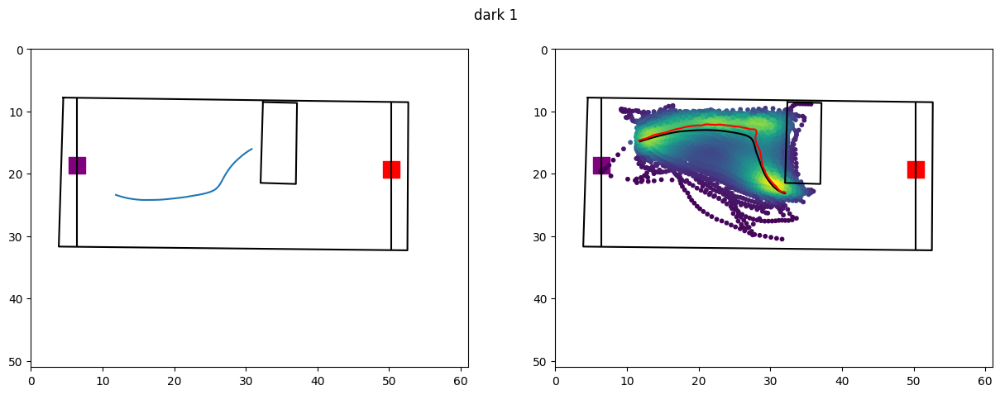

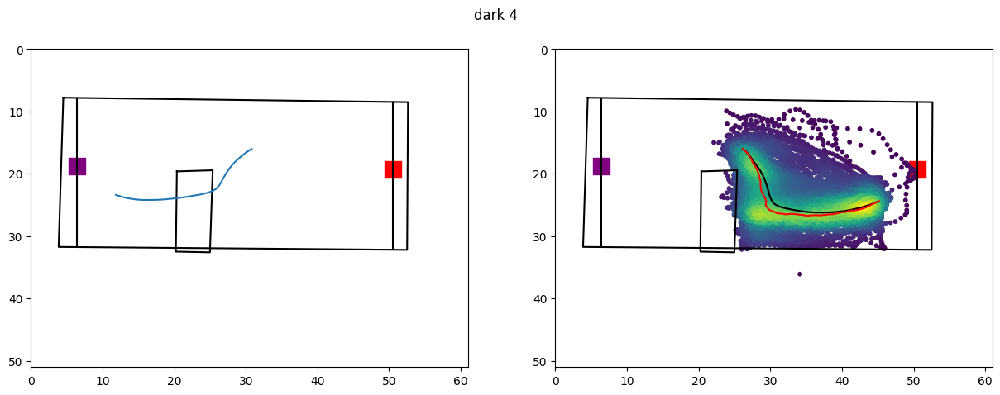

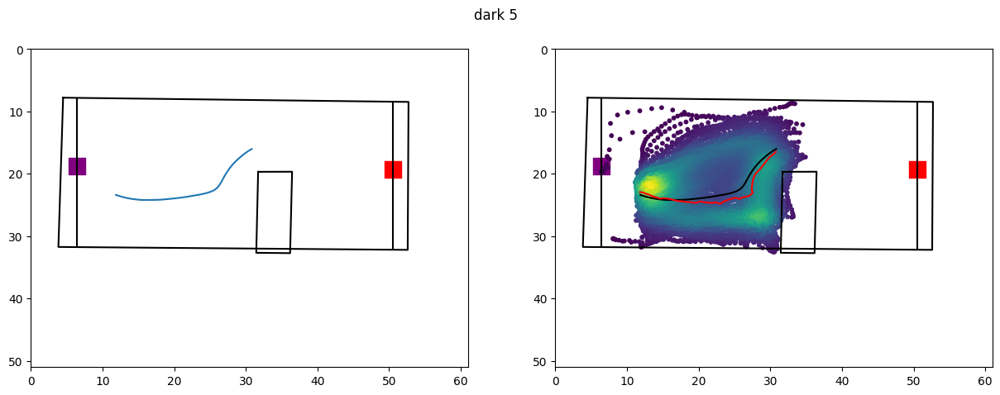

In [88]:
df = dark_long[(dark_long['date']!='071323')]
for i in dark_long.obstacle_cluster.unique():
    data = dark_long[(dark_long['obstacle_cluster']==i)]
    fig,ax = plt.subplots(1,2,figsize = (15,5))
    fig.suptitle('dark' +' ' + str(i))
    plot_arena(data,ax[0],obstacle=True)
    plot_arena(data,ax[1],obstacle=True)
    mean_interp_x,matx = get_mean_of_df(data,'obstacle_nose_x',50,matx=True)
    mean_interp_y,maty = get_mean_of_df(data,'obstacle_nose_y',50,matx=True)
    median_interp_x,matx = get_median_of_df(data,'obstacle_nose_x',50,matx=True)
    median_interp_x_interp_y,maty = get_median_of_df(data,'obstacle_nose_y',50,matx=True)
    #ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
    #ax[0].plot(interp_x,interp_y)
    x = interpolate_array(matx.flatten())
    y = interpolate_array(maty.flatten())
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)

    ax[1].scatter(x, y, c=z, s=10)
    ax[1].plot(mean_interp_x,mean_interp_y,c = 'black')
    ax[1].plot(median_interp_x,median_interp_x_interp_y,c = 'red')

In [101]:
dark_long['obstacle_cluster'].unique

<bound method Series.unique of 49      0
53      0
54      0
102     0
104     0
       ..
3329    5
3357    5
3369    5
3377    5
3400    5
Name: obstacle_cluster, Length: 713, dtype: int32>

In [99]:
dark_long['obstacle_cluster']=='0'

49      False
53      False
54      False
102     False
104     False
        ...  
3329    False
3357    False
3369    False
3377    False
3400    False
Name: obstacle_cluster, Length: 713, dtype: bool

In [ ]:
light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
light_xy = np.vstack([x,y])
light_z = gaussian_kde(xy)(xy)
ax[0].scatter(x, y, c=z, s=10)
ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')

In [ ]:
dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
dark_xy = np.vstack([dark_x,dark_y])
dark_z = gaussian_kde(dark_xy)(dark_xy)
ax[0].scatter(dark_x, dark_y, dark_z=z, s=10)
ax[0].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
ax[0].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')

In [118]:
oa_long[(oa_long['obstacle_cluster']==cluster)]

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,skill,ts_head_body_angle
24,25,30.0,56002.663641,56009.758515,"[56002.668953, 56002.6859, 56002.703321, 56002...","[9776, 9777, 9778, 9779, 9780, 9781, 9782, 978...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[108.58141326904297, 107.59034729003906, 106.9...","[272.70233154296875, 272.791015625, 272.766265...",...,53.149385,21.488681,"[nan, 52.178506995278234, 54.86753276714303, 5...","[nan, 29.677922674406005, 29.67792267440631, 2...",1.595425,0.626792,1.121498,0.891665,naive,"[134.28432092260422, 131.76484803369414, 134.8..."
35,36,42.0,56066.419238,56073.129024,"[56066.42432, 56066.442201, 56066.458035, 5606...","[13600, 13601, 13602, 13603, 13604, 13605, 136...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[109.37622833251953, 108.27796936035156, 107.6...","[274.5598449707031, 274.1292724609375, 273.478...",...,53.011742,21.365039,"[nan, 39.237368126248064, 49.39402559767971, 5...","[nan, 44.63561011743319, 45.19425238392043, 37...",2.494485,0.400884,1.103976,0.905817,naive,"[136.4402952422747, 134.64027164136417, 133.71..."
211,77,90.0,55181.653004,55184.577804,"[55181.655872, 55181.672691, 55181.690252, 551...","[25656, 25657, 25658, 25659, 25660, 25661, 256...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[105.8711929321289, 105.84203338623047, 106.32...","[278.6993713378906, 278.43389892578125, 277.50...",...,52.873827,21.096477,"[nan, 50.521746028386175, 35.511402065528074, ...","[nan, 3.2817613138186643, 3.2817613138188864, ...",1.082375,0.923894,1.014923,0.985297,naive,"[135.30942918469228, 132.91280513078394, 133.6..."
250,116,136.0,55437.342835,55439.649100,"[55437.344601, 55437.36096, 55437.377664, 5543...","[40992, 40993, 40994, 40995, 40996, 40997, 409...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[103.88938903808594, 103.7891845703125, 103.02...","[279.3878479003906, 278.3406982421875, 277.550...",...,53.038387,21.191140,"[nan, 26.946100882224496, 24.53534890493306, 2...","[nan, 25.264292231436187, 25.264292231436304, ...",1.034226,0.966907,1.129419,0.885411,naive,"[117.43051894869409, 119.60604321348379, 121.8..."
252,118,138.0,55443.651174,55445.519155,"[55443.663091, 55443.679795, 55443.696448, 554...","[41371, 41372, 41373, 41374, 41375, 41376, 413...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[109.3085708618164, 108.22730255126953, 107.00...","[273.02984619140625, 272.9349365234375, 272.73...",...,52.911904,21.149053,"[nan, 2.2759322287388137, 10.549443334793086, ...","[nan, 3.46809724080503, 3.4680972408052404, 3....",1.017154,0.983135,1.032230,0.968776,naive,"[103.99704830544897, 101.53250146266593, 108.4..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13410,59,68.0,46886.947558,46888.565529,"[46886.9568, 46886.973644, 46886.990489, 46887...","[10280, 10281, 10282, 10283, 10284, 10285, 102...","[84.4163818359375, 83.87260437011719, 84.12208...","[255.7734375, 254.60806274414062, 254.33262634...","[90.40586853027344, 89.56056213378906, 89.6206...","[258.06988525390625, 257.3135681152344, 256.42...",...,50.698268,20.303716,"[nan, 33.51406090143006, 38.197826598135116, 3...","[nan, 21.189411317029364, 20.69917073322914, 2...",1.149305,0.870091,1.056708,0.946335,late,"[107.39797719093116, 110.70335300929952, 116.3..."
13426,78,88.0,46937.263104,46939.827430,"[46937.274624, 46937.291225, 46937.307904, 469...","[13298, 13299, 13300, 13301, 13302, 13303, 133...","[83.51392364501953, 83.70305633544922, 83.3186...","[256.9064636230469, 256.

In [182]:
df_dark

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_start_y,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,ts_head_body_angle
1782,26,29,54620.214387,54622.573504,"[54620.216115, 54620.231411, 54620.247756, 546...","[[5290, 5291, 5292, 5293, 5294, 5295, 5296, 52...","[671.709716796875, 672.3576049804688, 672.3530...","[257.37982177734375, 257.5794982910156, 257.70...","[660.4035034179688, 661.88232421875, 662.78845...","[249.61483764648438, 248.28985595703125, 247.6...",...,11.797576,6.386719,19.789671,"[nan, 32.72474970801703, 29.023869775446375, 2...","[nan, 20.045422192728886, 19.133088082355428, ...",1.031104,0.969834,1.089450,0.917895,"[143.8231063494945, 148.51339298861436, 155.13..."
2408,33,35,64928.537088,64930.823014,"[64928.552294, 64928.569216, 64928.585907, 649...","[[5669, 5670, 5671, 5672, 5673, 5674, 5675, 56...","[675.5982055664062, 675.0764770507812, 676.074...","[261.2207946777344, 261.6510925292969, 261.713...","[667.7300415039062, 668.14208984375, 669.52624...","[248.04434204101562, 248.4627227783203, 248.61...",...,11.064060,6.201567,19.313157,"[nan, 21.175528622568503, 16.085181757480232, ...","[nan, 22.216902027092498, 21.11067013073009, 2...",1.003684,0.996330,1.262717,0.791943,"[129.7412137337561, 139.8237439012462, 143.895..."
1289,127,142,46108.698508,46110.930892,"[46108.7008, 46108.716723, 46108.733145, 46108...","[[26419, 26420, 26421, 26422, 26423, 26424, 26...","[683.7099609375, 684.6702880859375, 684.948547...","[273.9041442871094, 273.4324951171875, 272.825...","[673.2088012695312, 674.4041748046875, 674.968...","[261.4319763183594, 261.83197021484375, 261.76...",...,26.654347,7.537434,18.947346,"[nan, 1.6454399536147555, 0.059286574435303024...","[nan, 0.3925826203950525, 11.973004144604149, ...",1.014636,0.985575,1.068864,0.935573,"[132.51062754243318, 138.06087691009583, 140.8..."
1239,75,79,45895.459033,45897.712345,"[45895.459584, 45895.47639, 45895.49312, 45895...","[[13629, 13630, 13631, 13632, 13633, 13634, 13...","[684.8521728515625, 684.9381103515625, 686.309...","[274.1296081542969, 273.8379821777344, 272.888...","[676.1690063476562, 676.581787109375, 678.3330...","[259.4634704589844, 259.3642883300781, 259.577...",...,25.479769,7.641820,18.873013,"[nan, 26.943674016893045, 20.852337920076383, ...","[nan, 14.64432140211017, 18.21538211054631, 19...",1.030629,0.970282,1.071800,0.933010,"[159.37982287481574, 164.6560934841761, 158.44..."
2307,84,93,64464.355968,64466.613043,"[64464.358412, 64464.374617, 64464.391129, 644...","[[15029, 15030, 15031, 15032, 15033, 15034, 15...","[675.894287109375, 675.9396362304688, 676.4608...","[264.5186462402344, 264.3828430175781, 264.604...","[664.8136596679688, 664.6744384765625, 665.049...","[254.94796752929688, 255.1028289794922, 255.38...",...,27.543623,6.580696,19.405775,"[nan, 34.62402703413333, 28.678314410500906, 2...","[nan, 34.04445597135133, 26.990390046357955, 2...",1.024188,0.976383,1.111771,0.899466,"[146.54445649653667, 148.83287739407896, 152.0..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1241,77,81,45899.961190,45902.250803,"[45899.961459, 45899.977996, 45899.995916, 459...","[[13899, 13900, 13901, 13902, 13903, 13904, 13...","[684.59326171875, 685.1952514648438, 685.48364...","[275.0183410644531, 274.467529296875, 274.5258...","[671.9765014648438, 673.2647094726562, 674.091...","[265.58880615234375, 266.1756591796875, 266.48...",...,26.408002,7.601844,18.740104,"[nan, 12.12477985582691, 10.910798886891067, 9...","[nan, 22.045576709463457, 24.16128363164882, 2...",1.020174,0.980225,1.136500,0.879895,"[141.7787539353904, 143.22836420210243, 142.08..."
125,134,152,65315.850163,65318.123776,"[65315.8672, 65315.883008, 65315.899558, 65315...","[[24552, 24553, 24554, 24555, 24556, 24557, 24...","[678.6051025390625, 678.8673095703125, 679.007...","[2

In [186]:
df_light.iloc[90]

level_0                                                               0
index                                                               0.0
first_poke                                                 46166.514163
second_poke                                                46167.927347
trial_timestamps      [46166.521753, 46166.538444, 46166.55584, 4616...
                                            ...                        
ob_linearity                                                        NaN
go_tortuosity                                                       NaN
go_linearity                                                        NaN
skill                                                              late
ts_head_body_angle    [149.77283692014151, 151.79474927997344, 138.3...
Name: 13074, Length: 238, dtype: object

In [185]:
df_light.obstacle_nose_x.to_list()[90]

nan

In [183]:
flatten_list_of_arrays(df_light.obstacle_nose_x.to_list())

ValueError: all the input arrays must have same number of dimensions, but the array at index 0 has 1 dimension(s) and the array at index 90 has 0 dimension(s)

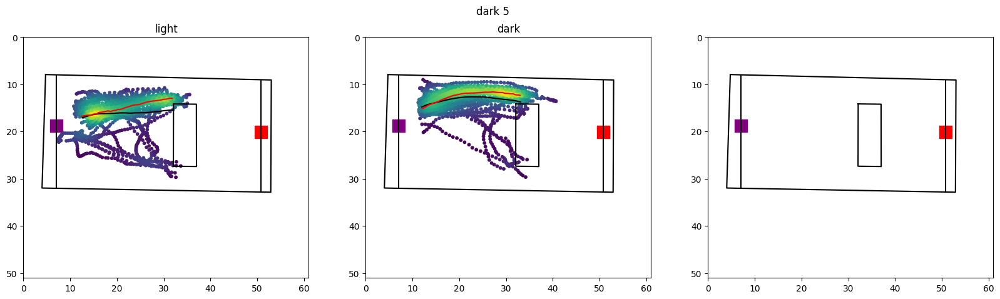

In [220]:
cluster = 3
df_dark = dark[(dark['date']!='071323')&(dark['obstacle_cluster']==cluster)&(dark['odd']=='left')&(dark['start']=='top')].sample(50)
df_light = light[(light['obstacle_cluster']==cluster)&(light['odd']=='left')&(light['start']=='top')].sample(50)
concat_df = pd.concat([df_dark,df_light])

fig,ax = plt.subplots(1,3,figsize = (20,5))
fig.suptitle('dark' +' ' + str(i))
ax[0].set_title('light')
ax[1].set_title('dark')
plot_arena(concat_df,ax[0],obstacle=True)
plot_arena(concat_df,ax[1],obstacle=True)
plot_arena(concat_df,ax[2],obstacle=True)


light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
light_xy = np.vstack([light_x,light_y])
light_z = gaussian_kde(light_xy)(light_xy)
ax[0].scatter(light_x, light_y, c=light_z, s=10)
ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')

dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
dark_xy = np.vstack([dark_x,dark_y])
dark_z = gaussian_kde(dark_xy)(dark_xy)
ax[1].scatter(dark_x, dark_y, c=dark_z, s=10)
ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')


In [ ]:

for i in oa_long.obstacle_cluster.unique():
    cluster = i
    df_dark = dark_long[(dark_long['date']!='071323')&(dark_long['obstacle_cluster']==cluster)].sample(50)
    df_light = oa_long[(oa_long['obstacle_cluster']==cluster)].sample(50)
    concat_df = pd.concat([df_dark,df_light])

    fig,ax = plt.subplots(1,2,figsize = (15,5))
    ax[0].set_title('light')
    ax[1].set_title('dark')
    plot_arena(concat_df,ax[0],obstacle=True)
    plot_arena(concat_df,ax[1],obstacle=True)



    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_z = gaussian_kde(light_xy)(light_xy)
    ax[0].scatter(light_x, light_y, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_z = gaussian_kde(dark_xy)(dark_xy)
    ax[1].scatter(dark_x, dark_y, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')

In [228]:
light_xy.shape

(2, 2497)

In [227]:
gaussian_kde(light_xy)(light_xy).shape

(2497,)

In [238]:
i

0

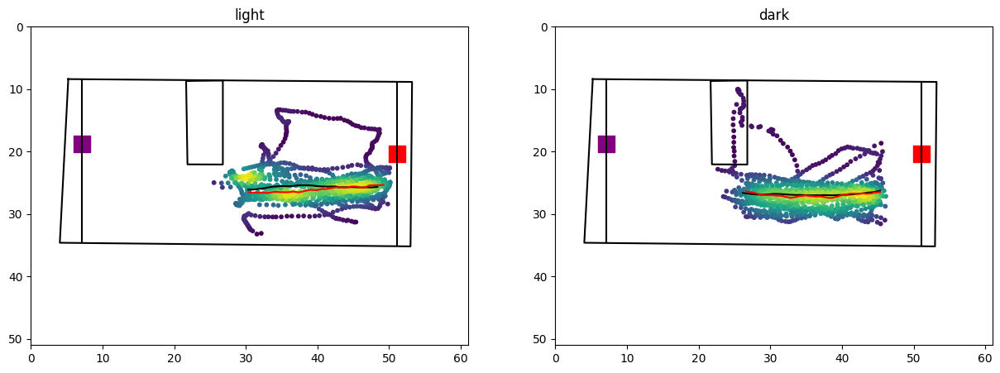

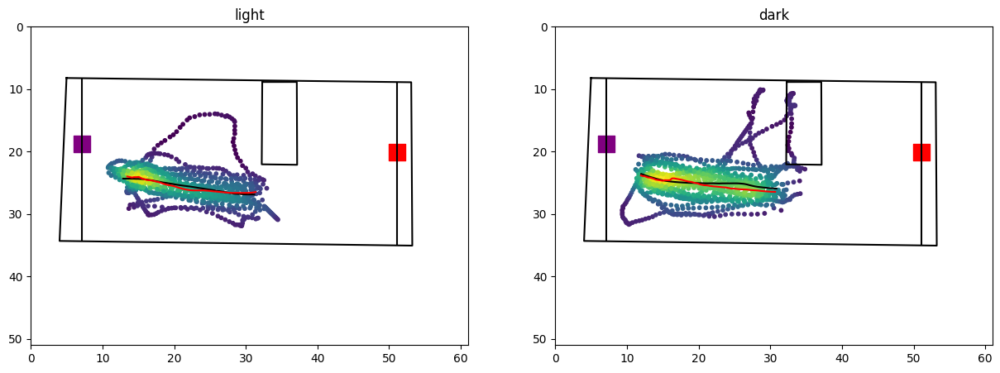

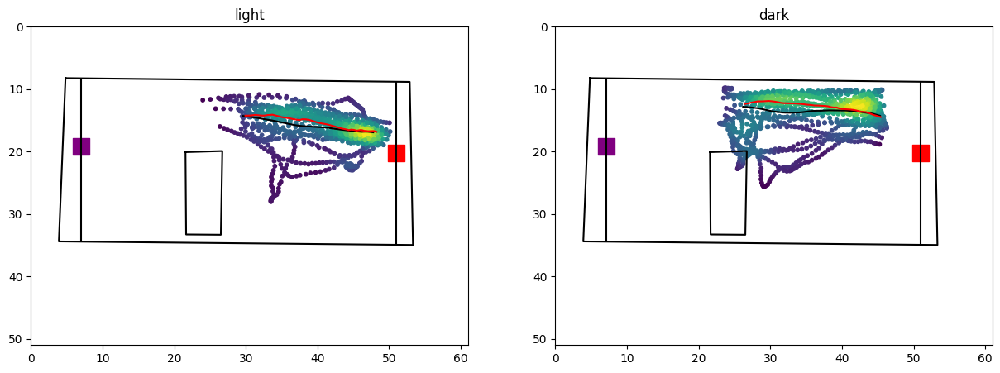

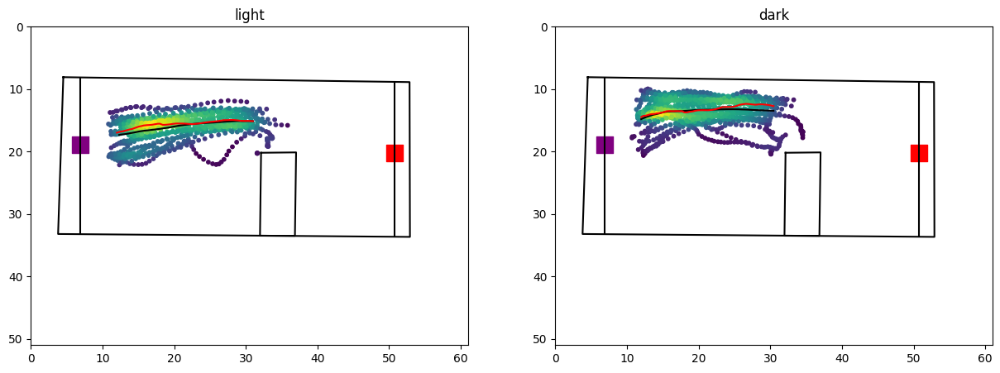

In [250]:
for i in ow_oa_long.obstacle_cluster.unique():
    cluster = i
    df_dark = ow_dark_long[(ow_dark_long['date']!='071323')&(ow_dark_long['obstacle_cluster']==cluster)]
    df_dark = drop_nans_in_columns(df_dark,'obstacle_nose_x').sample(30)
    df_light = ow_oa_long[(ow_oa_long['obstacle_cluster']==cluster)]
    df_light = drop_nans_in_columns(df_light,'obstacle_nose_x').sample(30)
    concat_df = pd.concat([df_dark,df_light])

    fig,ax = plt.subplots(1,2,figsize = (15,5))
    ax[0].set_title('light')
    ax[1].set_title('dark')
    plot_arena(concat_df,ax[0],obstacle=True)
    plot_arena(concat_df,ax[1],obstacle=True)



    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_z = gaussian_kde(light_xy)(light_xy)
    ax[0].scatter(light_x, light_y, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_z = gaussian_kde(dark_xy)(dark_xy)
    ax[1].scatter(dark_x, dark_y, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')

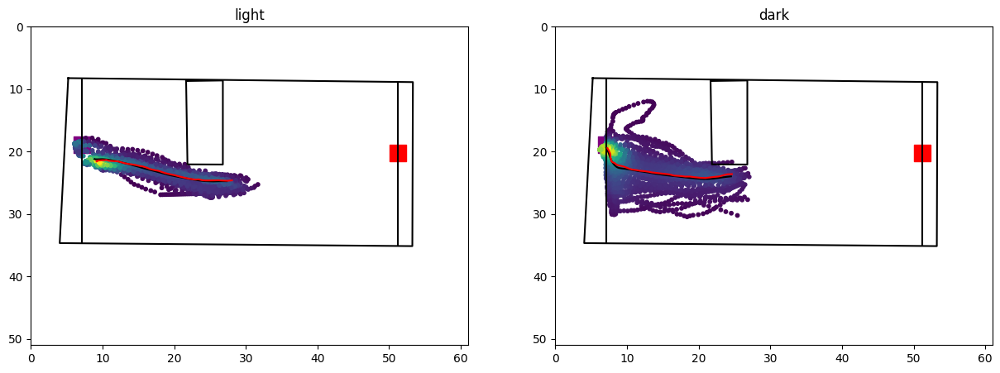

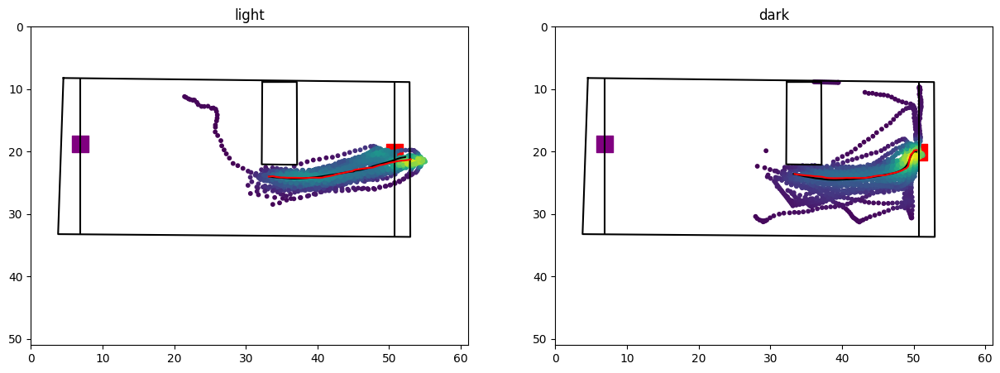

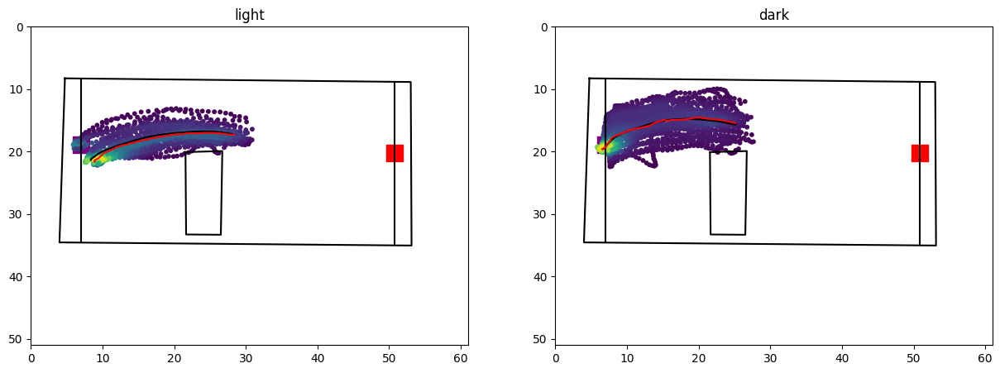

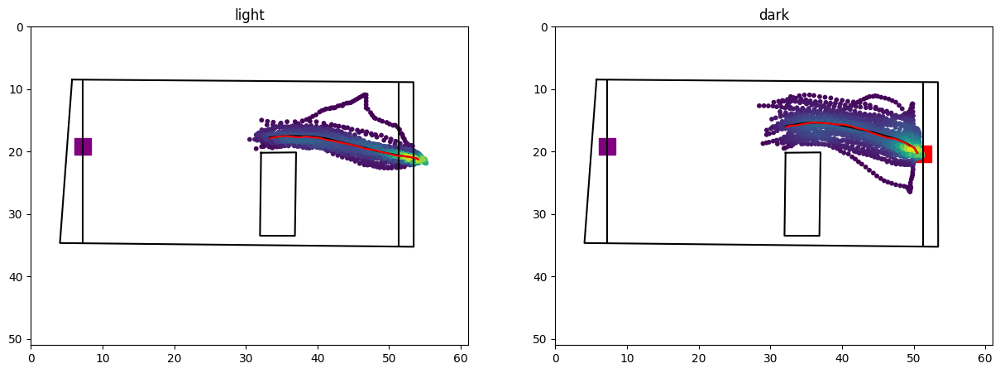

In [263]:
for i in oa_long.obstacle_cluster.unique():
    cluster = i
    df_dark = dark_long[(dark_long['date']!='071323')&(dark_long['obstacle_cluster']==cluster)].sample(50)
    df_light = oa_long[(oa_long['obstacle_cluster']==cluster)].sample(50)
    concat_df = pd.concat([df_dark,df_light])

    fig,ax = plt.subplots(1,2,figsize = (15,5))
    ax[0].set_title('light')
    ax[1].set_title('dark')
    plot_arena(concat_df,ax[0],obstacle=True)
    plot_arena(concat_df,ax[1],obstacle=True)



    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'goal_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'goal_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'goal_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'goal_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.goal_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.goal_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_z = gaussian_kde(light_xy)(light_xy)
    ax[0].scatter(light_x, light_y, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'goal_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'goal_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'goal_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'goal_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.goal_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.goal_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_z = gaussian_kde(dark_xy)(dark_xy)
    ax[1].scatter(dark_x, dark_y, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')

In [1]:
for i in oa_long.obstacle_cluster.unique():
    cluster = i
    df_dark = dark_long[(dark_long['date']!='071323')&(dark_long['obstacle_cluster']==cluster)]
    df_dark = drop_nans_in_columns(df_dark,'obstacle_nose_x')
    df_light = oa_long[(oa_long['obstacle_cluster']==cluster)]
    df_light = drop_nans_in_columns(df_light,'obstacle_nose_x')
    concat_df = pd.concat([df_dark,df_light])

    fig,ax = plt.subplots(1,2,figsize = (15,5))
    ax[0].set_title('light')
    ax[1].set_title('dark')
    plot_arena(concat_df,ax[0],obstacle=True)
    plot_arena(concat_df,ax[1],obstacle=True)



    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_z = gaussian_kde(light_xy)(light_xy)
    ax[0].scatter(light_x, light_y, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_z = gaussian_kde(dark_xy)(dark_xy)
    ax[1].scatter(dark_x, dark_y, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')


NameError: name 'oa_long' is not defined

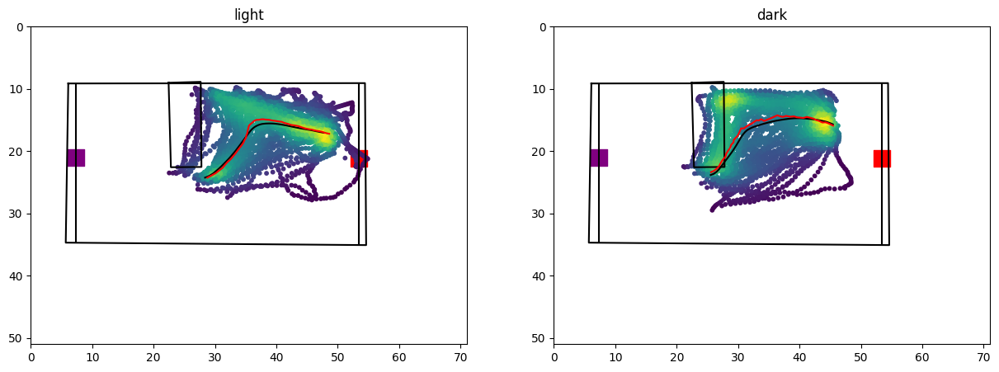

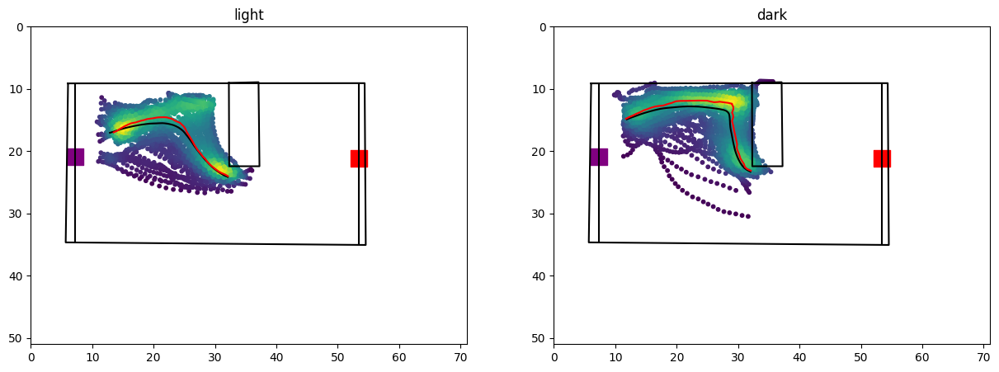

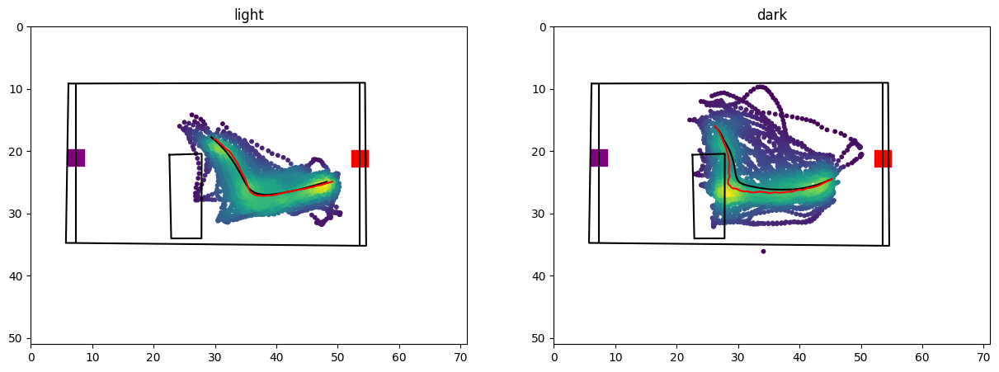

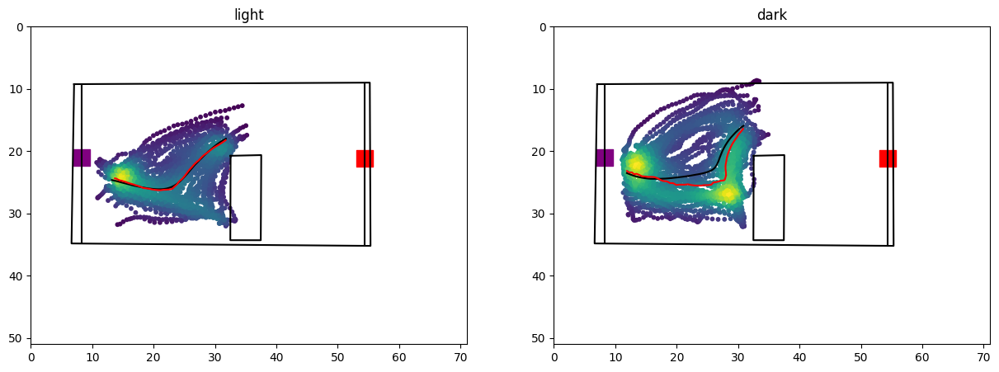

In [286]:
for i in oa_long.obstacle_cluster.unique():
    cluster = i
    df_dark = dark_long[(dark_long['date']!='071323')&(dark_long['obstacle_cluster']==cluster)]
    df_dark = drop_nans_in_columns(df_dark,'obstacle_nose_x')
    df_dark_sample = df_dark.sample(60)
    df_light = oa_long[(oa_long['obstacle_cluster']==cluster)]
    df_light = drop_nans_in_columns(df_light,'obstacle_nose_x')
    df_light_sample = df_light.sample(60)
    concat_df = pd.concat([df_dark,df_light])

    fig,ax = plt.subplots(1,2,figsize = (15,5))
    ax[0].set_title('light')
    ax[1].set_title('dark')
    plot_arena(concat_df,ax[0],obstacle=False)
    plot_orginal_obstacle(concat_df,ax[0],i)
    plot_arena(concat_df,ax[1],obstacle=False)
    plot_orginal_obstacle(concat_df,ax[1],i)



    light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
    light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
    light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
    light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
    light_x_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_x.to_list()))
    light_y_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_y.to_list()))
    light_xy = np.vstack([light_x,light_y])
    light_xy_sample = np.vstack([light_x_sample,light_y_sample])
    light_z = gaussian_kde(light_xy)(light_xy_sample)
    ax[0].scatter(light_x_sample, light_y_sample, c=light_z, s=10)
    ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
    ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')

    dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
    dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
    dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
    dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
    dark_x_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_x.to_list()))
    dark_y_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_y.to_list()))
    dark_xy = np.vstack([dark_x,dark_y])
    dark_xy_sample = np.vstack([dark_x_sample,dark_y_sample])
    dark_z = gaussian_kde(dark_xy)(dark_xy_sample)
    ax[1].scatter(dark_x_sample, dark_y_sample, c=dark_z, s=10)
    ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
    ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')

In [9]:
light.date.unique()

array(['042823', '043023', '050123', '050223', '050323', '050423',
       '050523', '050923', '051023', '051723', '051823', '051923',
       '052223', '052323', '052523', '052623', '061323', '061423',
       '072323', '072623', '072823'], dtype=object)

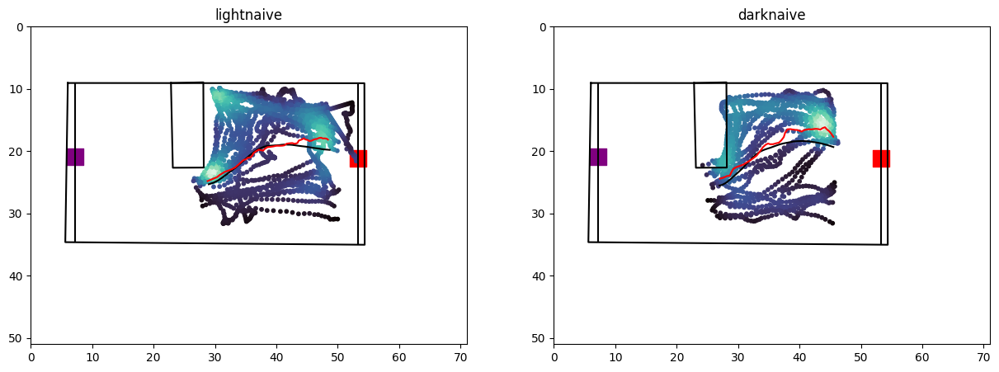

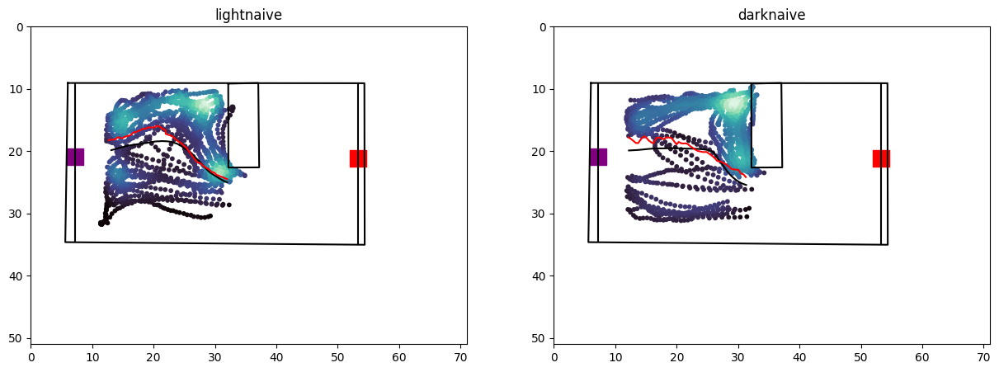

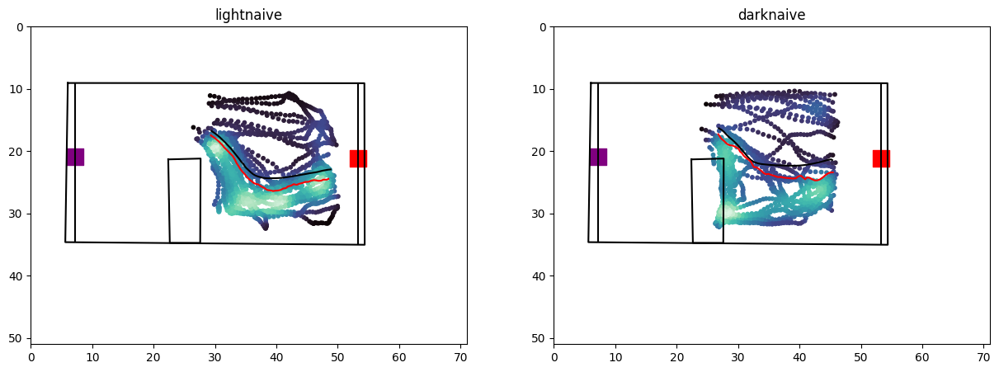

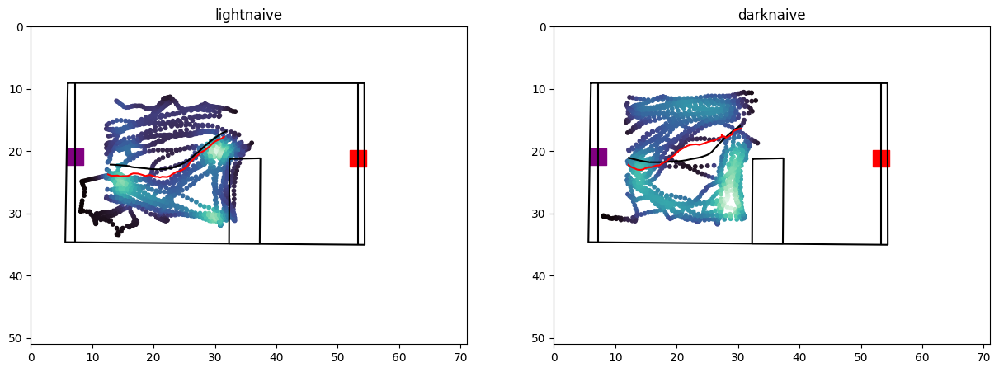

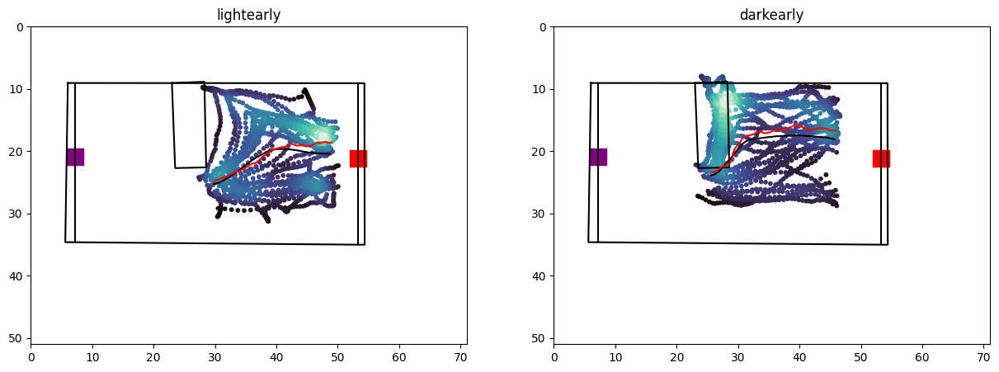

...

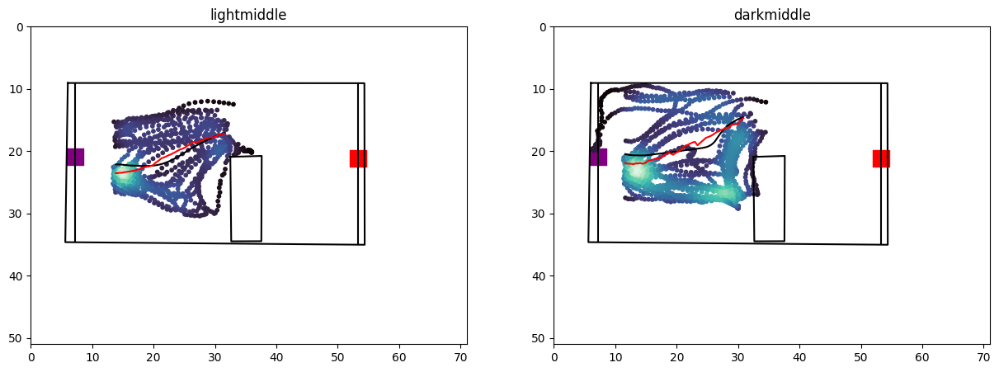

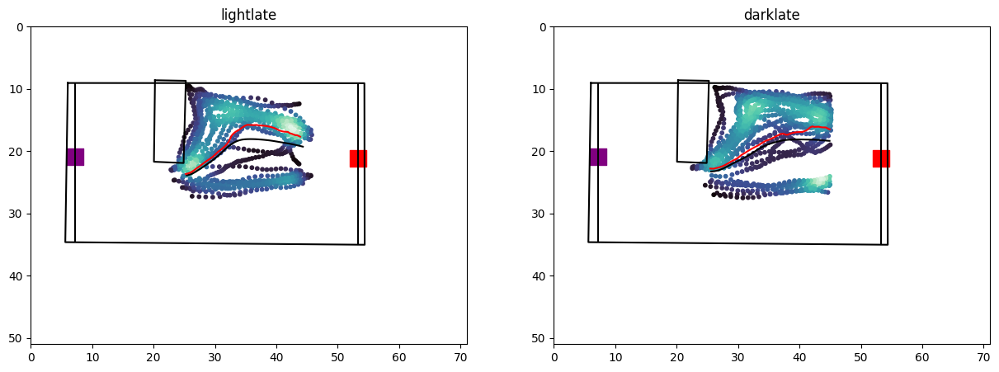

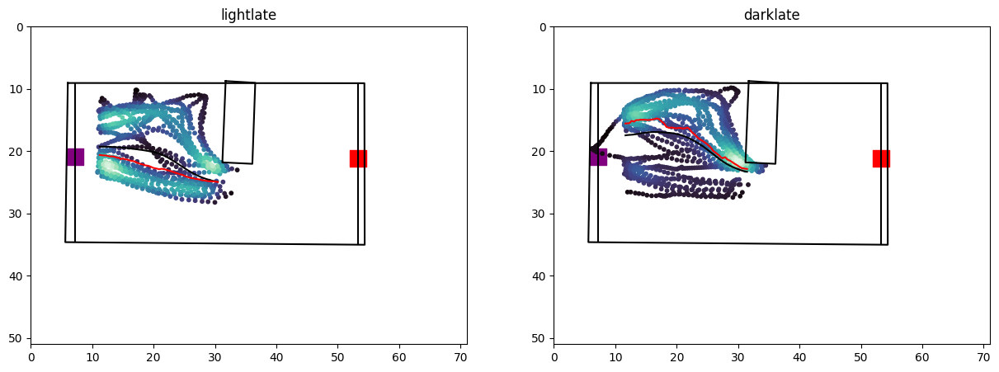

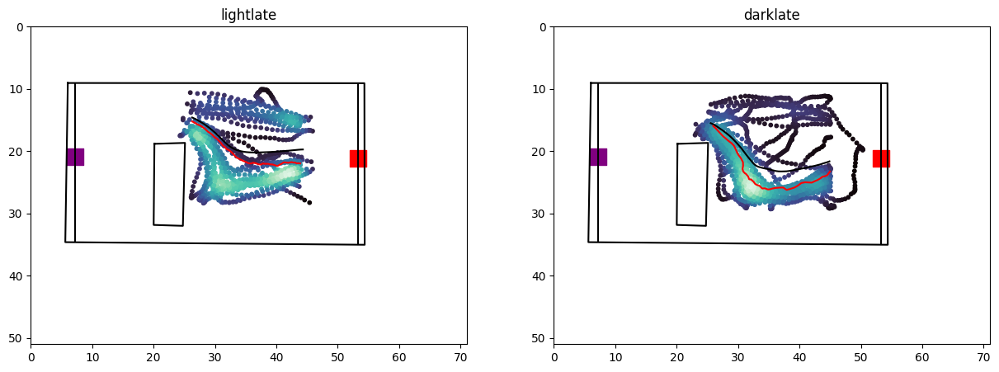

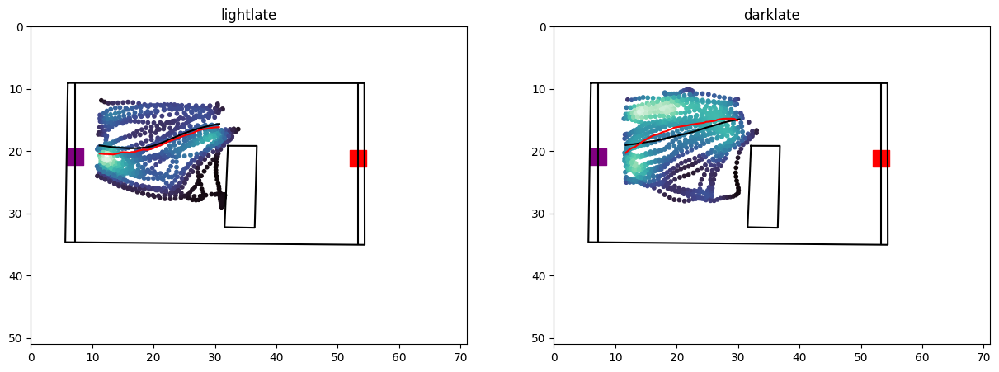

In [15]:
ns_oa_long = drop_nans_in_columns(ns_oa_long,'skill')
for skill in ns_oa_long.skill.unique():
    for i in ns_oa_long.obstacle_cluster.unique():
        cluster = i
        df_dark = ns_dark_long[(ns_dark_long['obstacle_cluster']==cluster)&(ns_dark_long['skill']==skill)]
        df_dark = drop_nans_in_columns(df_dark,'obstacle_nose_x')
        df_dark = drop_nans_in_columns(df_dark,'skill')
        df_dark_sample = df_dark.sample(30)
        df_light = ns_oa_long[(ns_oa_long['obstacle_cluster']==cluster)&(ns_oa_long['skill']==skill)]
        df_light = drop_nans_in_columns(df_light,'obstacle_nose_x')
        df_light = drop_nans_in_columns(df_light,'skill')
        df_light_sample = df_light.sample(30)
        concat_df = pd.concat([ns_oa_long,ns_dark_long])
        df = pd.concat([df_light,df_dark])
    
        fig,ax = plt.subplots(1,2,figsize = (15,5))
        ax[0].set_title('light'  +str(skill))
        ax[1].set_title('dark' +str(skill))
        plot_arena(concat_df,ax[0],obstacle=False)
        plot_orginal_obstacle(df,ax[0],i)
        plot_arena(concat_df,ax[1],obstacle=False)
        plot_orginal_obstacle(df,ax[1],i)
    
    
    
        light_mean_interp_x,light_matx = get_mean_of_df(df_light,'obstacle_nose_x',50,matx=True)
        light_mean_interp_y,light_maty = get_mean_of_df(df_light,'obstacle_nose_y',50,matx=True)
        light_median_interp_x,median_light_matx = get_median_of_df(df_light,'obstacle_nose_x',50,matx=True)
        light_median_interp_x_interp_y,median_light_maty = get_median_of_df(df_light,'obstacle_nose_y',50,matx=True)
        light_x = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_x.to_list()))
        light_y = interpolate_array(flatten_list_of_arrays(df_light.obstacle_nose_y.to_list()))
        light_x_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_x.to_list()))
        light_y_sample = interpolate_array(flatten_list_of_arrays(df_light_sample.obstacle_nose_y.to_list()))
        light_xy = np.vstack([light_x,light_y])
        light_xy_sample = np.vstack([light_x_sample,light_y_sample])
        light_z = gaussian_kde(light_xy)(light_xy_sample)
        ax[0].scatter(light_x_sample, light_y_sample, cmap = 'mako', c=light_z, s=10)
        ax[0].plot(light_mean_interp_x,light_mean_interp_y,c = 'black')
        ax[0].plot(light_median_interp_x,light_median_interp_x_interp_y,c = 'red')
    
        dark_mean_interp_x,dark_matx = get_mean_of_df(df_dark,'obstacle_nose_x',50,matx=True)
        dark_mean_interp_y,dark_maty = get_mean_of_df(df_dark,'obstacle_nose_y',50,matx=True)
        dark_median_interp_x,median_dark_matx = get_median_of_df(df_dark,'obstacle_nose_x',50,matx=True)
        dark_median_interp_x_interp_y,median_dark_maty = get_median_of_df(df_dark,'obstacle_nose_y',50,matx=True)
        dark_x = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_x.to_list()))
        dark_y = interpolate_array(flatten_list_of_arrays(df_dark.obstacle_nose_y.to_list()))
        dark_x_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_x.to_list()))
        dark_y_sample = interpolate_array(flatten_list_of_arrays(df_dark_sample.obstacle_nose_y.to_list()))
        dark_xy = np.vstack([dark_x,dark_y])
        dark_xy_sample = np.vstack([dark_x_sample,dark_y_sample])
        dark_z = gaussian_kde(dark_xy)(dark_xy_sample)
        ax[1].scatter(dark_x_sample, dark_y_sample, cmap = 'mako' ,c=dark_z, s=10)
        ax[1].plot(dark_mean_interp_x,dark_mean_interp_y,c = 'black')
        ax[1].plot(dark_median_interp_x,dark_median_interp_x_interp_y,c = 'red')

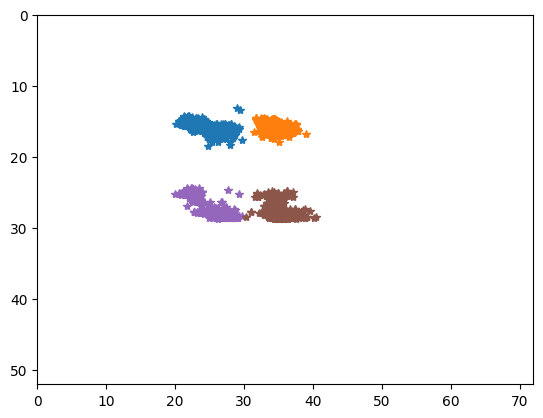

In [350]:
df= pd.concat([oa_long])
gt_label = df['obstacle_cluster'].astype(int).tolist()

obstacle_xpos = np.array(df.loc[:,'gt_obstacle_cen_x_cm'])
obstacle_ypos = np.array(df.loc[:,'gt_obstacle_cen_y_cm'])
obstacle_xypos_ar = np.stack((obstacle_xpos, obstacle_ypos))
plt.figure()

for i in range(len(df['obstacle_cluster'])):
    obstacle_xypos = obstacle_xypos_ar[:,i] 
    plt.plot(obstacle_xypos[0], obstacle_xypos[1], '*', color=list(mcolors.TABLEAU_COLORS)[gt_label[i]])
    plt.ylim([52,0]); plt.xlim([0, 72])


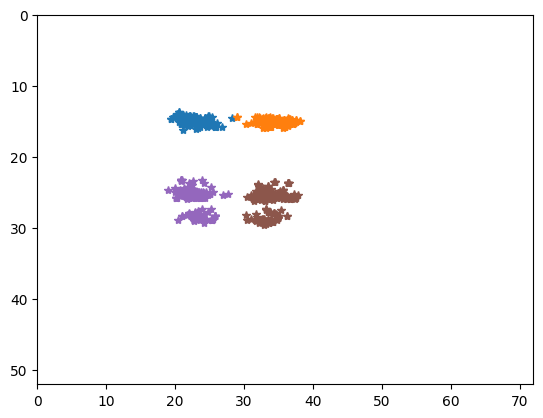

In [351]:
df = pd.concat([dark_long])
gt_label = df['obstacle_cluster'].astype(int).tolist()
#create obstacle_xypos array 
obstacle_xpos = np.array(df.loc[:,'gt_obstacle_cen_x_cm'])
obstacle_ypos = np.array(df.loc[:,'gt_obstacle_cen_y_cm'])
obstacle_xypos_ar = np.stack((obstacle_xpos, obstacle_ypos))
plt.figure()
for i in range(len(df['obstacle_cluster'])):
    obstacle_xypos = obstacle_xypos_ar[:,i] 
    plt.plot(obstacle_xypos[0], obstacle_xypos[1], '*', color=list(mcolors.TABLEAU_COLORS)[gt_label[i]])
    plt.ylim([52,0]); plt.xlim([0, 72])

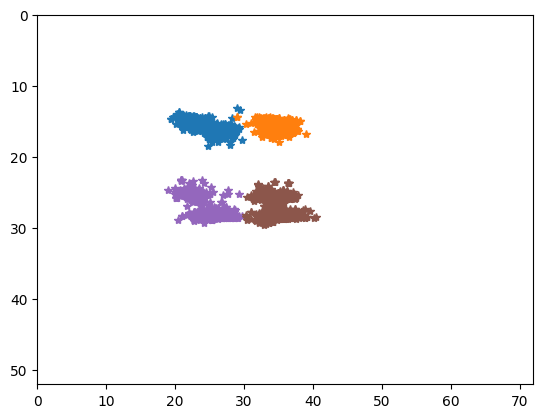

In [352]:
df = pd.concat([oa_long,dark_long])
gt_label = df['obstacle_cluster'].astype(int).tolist()
#create obstacle_xypos array 
obstacle_xpos = np.array(df.loc[:,'gt_obstacle_cen_x_cm'])
obstacle_ypos = np.array(df.loc[:,'gt_obstacle_cen_y_cm'])
obstacle_xypos_ar = np.stack((obstacle_xpos, obstacle_ypos))
plt.figure()
for i in range(len(df['obstacle_cluster'])):
    obstacle_xypos = obstacle_xypos_ar[:,i] 
    plt.plot(obstacle_xypos[0], obstacle_xypos[1], '*', color=list(mcolors.TABLEAU_COLORS)[gt_label[i]])
    plt.ylim([52,0]); plt.xlim([0, 72])

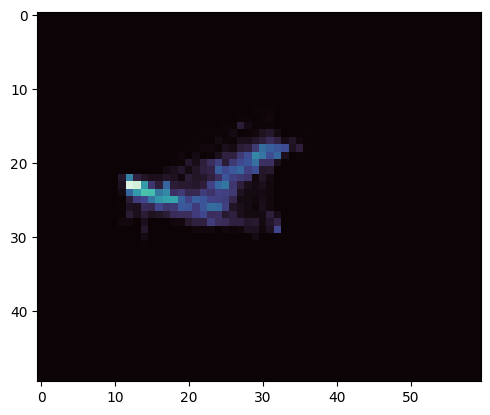

In [337]:
#Setting up for Occupancy Map
XsizeOfVideo = 60
YsizeOfVideo = 50
samplingRate = 60
scaleForRateMap = 1
binXForRateMap = XsizeOfVideo / scaleForRateMap
binYForRateMap = YsizeOfVideo / scaleForRateMap
light_occMat = []
light_occMat = np.zeros(((int(binYForRateMap)), int(binXForRateMap)))
light_occMat[light_occMat < 0.0001] = float("NaN")
for i in range(0,int(binXForRateMap)):
    for j in range(0,int(binYForRateMap)):
        occForBin = (((light_x < (i*scaleForRateMap)) & (light_x > ((i-1)*scaleForRateMap))) & ((light_y < (j*scaleForRateMap)) & (light_y > ((j-1)*scaleForRateMap)))) .sum()
        light_occMat[j][i]= occForBin
        occForBin = []
#light_occMat[light_occMat == 0.]  = np.nan
#visualize occupancy map
plt.imshow(light_occMat, cmap = 'mako')

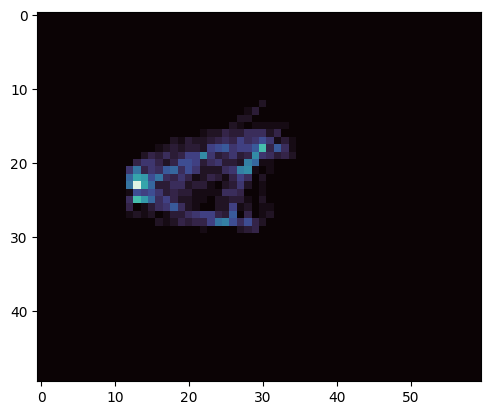

In [340]:
#Setting up for Occupancy Map
XsizeOfVideo = 60
YsizeOfVideo = 50
samplingRate = 60
scaleForRateMap = 1
binXForRateMap = XsizeOfVideo / scaleForRateMap
binYForRateMap = YsizeOfVideo / scaleForRateMap
dark_occMat = []
dark_occMat = np.zeros(((int(binYForRateMap)), int(binXForRateMap)))
dark_occMat[dark_occMat < 0.0001] = float("NaN")
for i in range(0,int(binXForRateMap)):
    for j in range(0,int(binYForRateMap)):
        occForBin = (((dark_x < (i*scaleForRateMap)) & (dark_x > ((i-1)*scaleForRateMap))) & ((dark_y < (j*scaleForRateMap)) & (dark_y > ((j-1)*scaleForRateMap)))) .sum()
        dark_occMat[j][i]= occForBin
        occForBin = []
#dark_occMat[dark_occMat == 0.]  = np.nan
#visualize occupancy map
plt.imshow(dark_occMat, cmap = 'mako')

In [164]:
light_occMat.shape

(50, 60)

In [163]:
normalize(light_occMat).shape()

TypeError: 'tuple' object is not callable

In [162]:
light_norm-dark_norm.shape()

TypeError: 'tuple' object is not callable

In [321]:
from sklearn.preprocessing import normalize
light_norm = normalize(light_occMat)
dark_norm = normalize(dark_occMat)
plt.imshow(light_norm-dark_norm ,cmap = 'mako')

ValueError: Input contains NaN.

In [328]:
plot_arena(concat_df,ax[0],obstacle=False)
plot_orginal_obstacle(concat_df,ax[0],i)

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [ ]:
fig,ax = plt.subplots()
sub = light_occMat-dark_occMat
sub[sub == 0.] = np.nan
ax.imshow(sub, cmap = 'mako')
plot_arena(concat_df,ax,obstacle=False)
plot_orginal_obstacle(concat_df,ax,i)

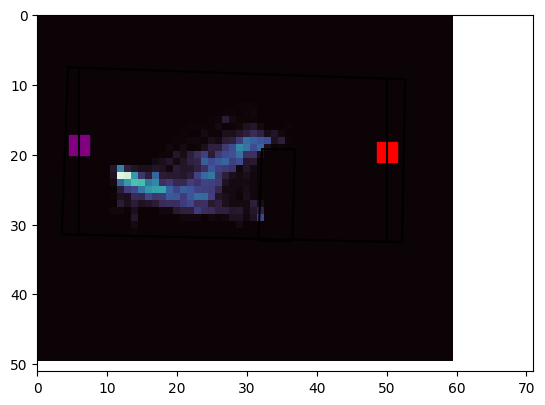

In [338]:
fig,ax = plt.subplots()
sub = light_occMat
#sub[sub == 0.] = np.nan
ax.imshow(sub, cmap = 'mako')
plot_arena(concat_df,ax,obstacle=False)
plot_orginal_obstacle(concat_df,ax,i)

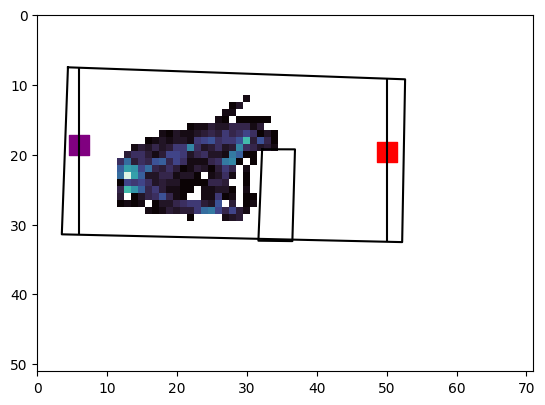

In [345]:
fig,ax = plt.subplots()
sub = dark_occMat
sub[sub == 0.] = np.nan
ax.imshow(sub, cmap = 'mako')
plot_arena(concat_df,ax,obstacle=False)
plot_orginal_obstacle(concat_df,ax,i)

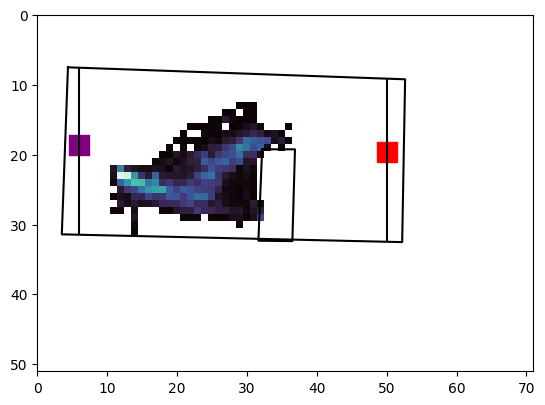

In [335]:
fig,ax = plt.subplots()
sub = light_occMat
sub[sub == 0.] = np.nan
ax.imshow(sub, cmap = 'mako')
plot_arena(concat_df,ax,obstacle=False)
plot_orginal_obstacle(concat_df,ax,i)

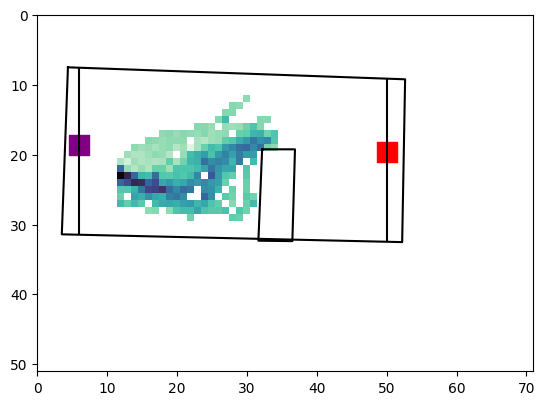

In [343]:
fig,ax = plt.subplots()
sub = dark_occMat - light_occMat
sub[sub == 0.] = np.nan
ax.imshow(sub, cmap = 'mako')
plot_arena(concat_df,ax,obstacle=False)
plot_orginal_obstacle(concat_df,ax,i)

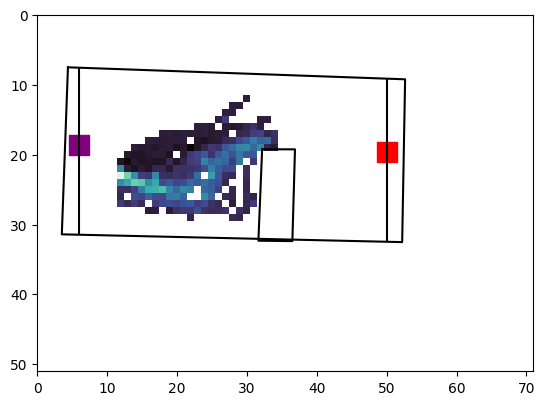

In [342]:
fig,ax = plt.subplots()
sub = light_occMat - dark_occMat
sub[sub == 0.] = np.nan
ax.imshow(sub, cmap = 'mako')
plot_arena(concat_df,ax,obstacle=False)
plot_orginal_obstacle(concat_df,ax,i)

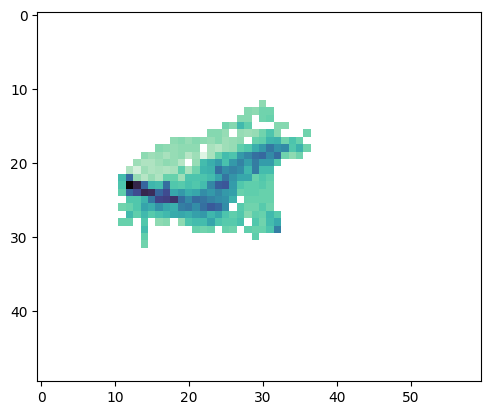

In [330]:
sub = dark_occMat-light_occMat
sub[sub == 0.] = np.nan
plt.imshow(sub, cmap = 'mako')

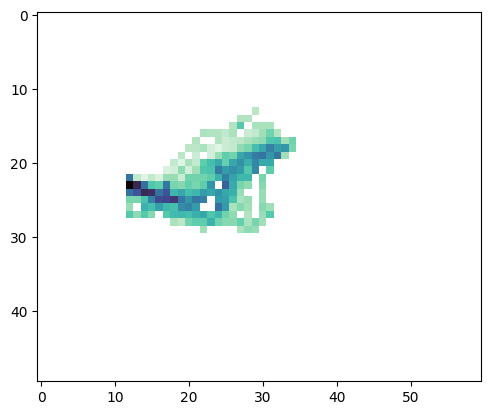

In [323]:
plt.imshow(dark_occMat-light_occMat, cmap = 'mako')

In [150]:
light_occMat-dark_occMat

array([[   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.],
       [   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.],
       [   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.],
       [   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.],
       [   0.,    0.,    0.,

(array([185., 586., 792., 587., 932., 740., 400., 387., 260., 191.]),
 array([0.00017411, 0.00083595, 0.00149779, 0.00215963, 0.00282147,
        0.00348331, 0.00414515, 0.00480699, 0.00546883, 0.00613067,
        0.00679251]),
 <BarContainer object of 10 artists>)

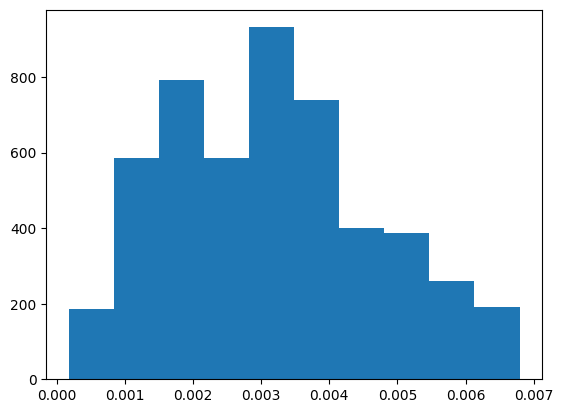

In [134]:
plt.hist(dark_z)

In [129]:
light_matx[0]

array([13.69796815, 14.38128832, 15.36523842, 16.6732154 , 18.02336952,
       19.86646521, 21.62216339, 22.89961208, 23.73016693, 23.45733639,
       23.14529843, 22.48079124, 21.76071561, 21.21476332, 20.69096079,
       20.10222082, 19.56066253, 19.13254156, 18.19284419, 16.93456436,
       14.9970392 , 13.12261688, 11.6306898 , 10.91996974, 10.43049079,
       10.65574584, 10.89501882, 10.11997465,  9.67990995,  9.49304614,
        9.57539218,  9.65773822,  9.74008426,  9.8224303 ,  9.90477634,
        9.98712238, 11.54695236, 13.52401362, 14.8952089 , 16.10626447,
       17.69278297, 18.87334728, 19.74330861, 20.50820781, 22.32884922,
       24.51307196, 27.14610913, 29.62540318, 31.91109512, 34.06287098])

In [121]:
light_z.shape

(4592,)

In [ ]:
mean_interp_x,matx = get_mean_of_df(data,'obstacle_nose_x',50,matx=True)
mean_interp_y,maty = get_mean_of_df(data,'obstacle_nose_y',50,matx=True)
median_interp_x,matx = get_median_of_df(data,'obstacle_nose_x',50,matx=True)
median_interp_x_interp_y,maty = get_median_of_df(data,'obstacle_nose_y',50,matx=True)
#ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
#ax[0].plot(interp_x,interp_y)
x = interpolate_array(flatten_list_of_arrays(data.obstacle_nose_x.to_list()))
y = interpolate_array(flatten_list_of_arrays(data.obstacle_nose_y.to_list()))
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
ax[1].scatter(x, y, c=z, s=10)
ax[1].plot(mean_interp_x,mean_interp_y,c = 'black')
ax[1].plot(median_interp_x,median_interp_x_interp_y,c = 'red')

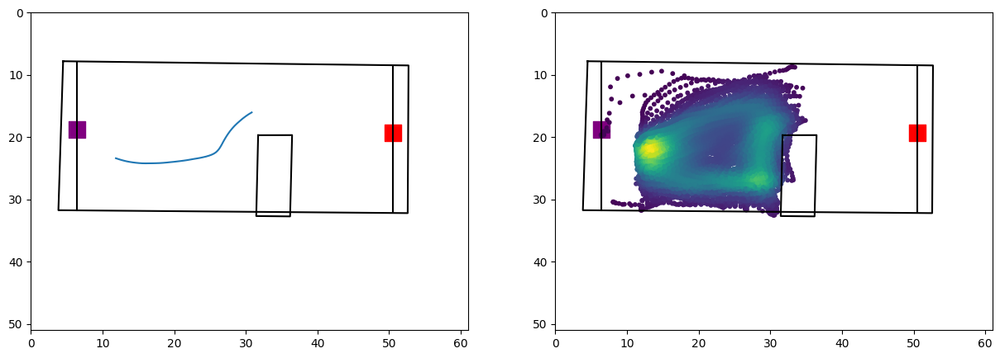

In [46]:

data = dark_long[(dark_long['obstacle_cluster']==5)]
fig,ax = plt.subplots(1,2,figsize = (15,5))
plot_arena(data,ax[0],obstacle=True)
plot_arena(data,ax[1],obstacle=True)
interp_x,matx = get_mean_of_df(data,'obstacle_nose_x',50,matx=True)
interp_y,maty = get_mean_of_df(data,'obstacle_nose_y',50,matx=True)
#ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
ax[0].plot(interp_x,interp_y)
x = matx.flatten()
y = maty.flatten()
xy = np.vstack([matx.flatten(),maty.flatten()])
z = gaussian_kde(xy)(xy)
#idx = z.argsort()
#x, y, z = x[idx], y[idx], z[idx]
ax[1].scatter(x, y, c=z, s=10)

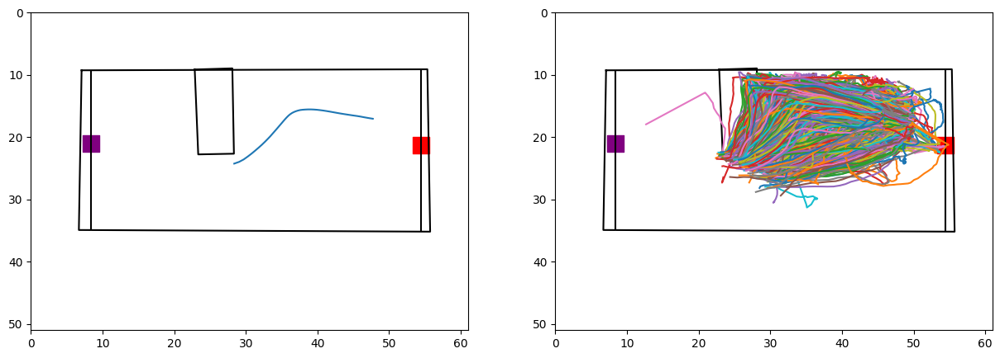

In [306]:
data = oa_long[oa_long['obstacle_cluster']==0]
fig,ax = plt.subplots(1,2,figsize = (15,5))
plot_arena(data,ax[0],obstacle=True)
plot_arena(data,ax[1],obstacle=True)
interp_x = get_mean_of_df(data,'obstacle_nose_x',50)
interp_y = get_mean_of_df(data,'obstacle_nose_y',50)
#ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
ax[0].plot(interp_x,interp_y)
for ind,row in data.iterrows():
    ax[1].plot(row.obstacle_nose_x,row.obstacle_nose_y)

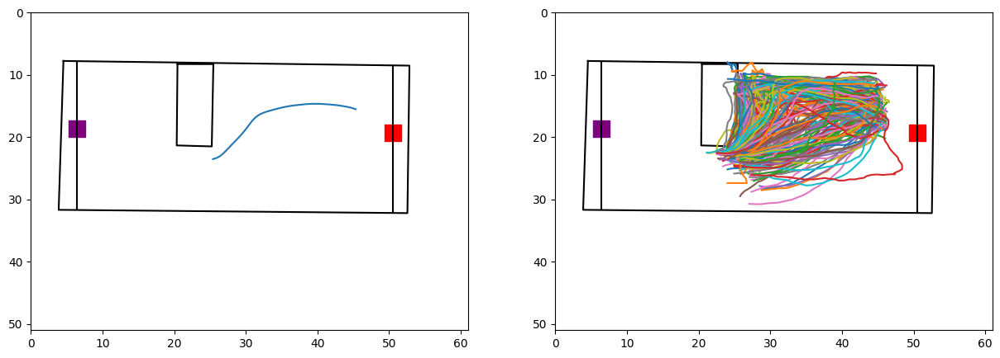

In [307]:
data = dark_long[dark_long['obstacle_cluster']==0]
fig,ax = plt.subplots(1,2,figsize = (15,5))
plot_arena(data,ax[0],obstacle=True)
plot_arena(data,ax[1],obstacle=True)
interp_x = get_mean_of_df(data,'obstacle_nose_x',50)
interp_y = get_mean_of_df(data,'obstacle_nose_y',50)
#ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
ax[0].plot(interp_x,interp_y)
for ind,row in data.iterrows():
    ax[1].plot(row.obstacle_nose_x,row.obstacle_nose_y)

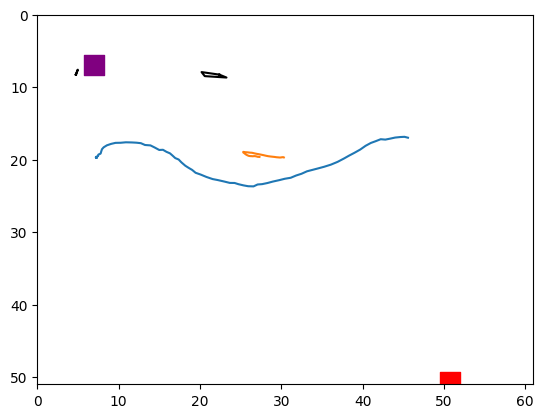

In [294]:
data = dark_long[(dark_long['linearity']>.8)]
fig,ax = plt.subplots()
plot_arena_single(data,ax,obstacle=True)
interp_x = get_mean_of_df(data,'ts_nose_x_cm',50)
interp_y = get_mean_of_df(data,'ts_nose_y_cm',50)
ax.plot(data.ts_nose_x_cm.to_numpy()[0],data.ts_nose_y_cm.to_numpy()[0],)
ax.plot(interp_x,interp_y)

In [191]:
dark_long[dark_long['linearity']<.5].sample(1).ts_nose_x_cm.to_numpy()[0]

array([44.810180284701026, 44.22996966964373, 43.613945482369594,
       42.916193466362806, 42.16706993065805, 41.248350751239975,
       40.35799396779667, 39.41165841429699, 38.54995791424091,
       37.669256462633115, 36.80394340807619, 36.08100071947679,
       35.2451758757516, 34.3853133023596, 33.67667614872978,
       33.035553976431586, 32.37132773216925, 31.886178391680662,
       31.492733227241544, 31.13176262187923, 30.81159037138354,
       30.59225767412001, 30.367657610156236, 30.12711980574753,
       29.98508175863332, 29.990039413214276, 30.01015713693335,
       30.036747165743748, 30.03630633462506, 30.097143289676634,
       30.336003675161916, 30.40780263069824, 30.572128647038916,
       30.59018011618116, 30.75930327936214, 30.880210821520492,
       31.125351354942797, 31.33386899542781, 31.54847688736795,
       31.751351889533737, 32.04546084788905, 32.206493064537774,
       32.48324231950633, 32.67390516934821, 32.76379628613004,
       32.81501408010457

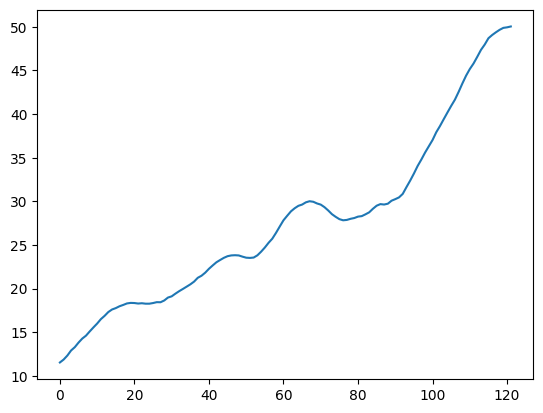

In [213]:
plt.plot(dark_long[dark_long['linearity']<.5].sample(1).ts_nose_x_cm.to_numpy()[0])

In [ ]:
['resampled_ob_ts_angle_to_corner',
 'resampled_ob_ts_head_body_angle',
 'resampled_ob_ts_speed','resampled_ob_ts_speed']

In [90]:
feature_list =['resampled_ob_ts_angle_to_corner',
 'resampled_ob_ts_head_body_angle',
 'resampled_ob_ts_speed',]
create_logistic_model_accuracy_score(test,feature_list,chunking = True)

([0.34908136482939633,
  0.3237095363079615,
  0.32983377077865267,
  0.4916885389326334,
  0.5293088363954506],
 [[0, 15], [15, 30], [30, 45], [45, 60], [0, 60]])

In [78]:
test = create_obstacle_trajectories_df(ns_oa_long,60)

In [836]:

dark_obstacle_trajectories = drop_nans_in_columns(ns_dark_long,'obstacle_ind')
print(len(dark_obstacle_trajectories))
dark_obstacle_trajectories = drop_nans_in_columns(dark_obstacle_trajectories,'ts_speed')
print(len(dark_obstacle_trajectories))
dark_obstacle_trajectories = drop_nans_in_columns(dark_obstacle_trajectories,'ts_angle_to_corner')
print(len(dark_obstacle_trajectories))
dark_obstacle_trajectories = drop_nans_in_columns(dark_obstacle_trajectories,'ts_head_body_angle')
print(len(dark_obstacle_trajectories))

var_list =  ['ts_speed','ts_angle_to_corner','ts_head_body_angle','ts_distance_from_edge']
for ind,row in dark_obstacle_trajectories.iterrows():
    for i in var_list:
        obstacle_vector = create_obstacle_vector(row,i)
        resampled_obstacle_vector = create_obstacle_vector_resampled(row,i,60)
        
        dark_obstacle_trajectories.at[ind,'ob_' + i] = obstacle_vector
        dark_obstacle_trajectories.at[ind,'resampled_ob_' + i] = resampled_obstacle_vector.astype(object)
var_list =  ['obstacle_nose_x','obstacle_nose_y']
for ind,row in dark_obstacle_trajectories.iterrows():
    for i in var_list:
        resample_vec = resample(row[i],60)
        dark_obstacle_trajectories.at[ind,'resampled_' + i] = resample_vec.astype(object)

1100
1100
1100
1100


In [903]:

obstacle_trajectories = drop_nans_in_columns(ns_oa_long,'obstacle_ind')
print(len(obstacle_trajectories))
obstacle_trajectories = drop_nans_in_columns(obstacle_trajectories,'ts_speed')
print(len(obstacle_trajectories))
obstacle_trajectories = drop_nans_in_columns(obstacle_trajectories,'ts_angle_to_corner')
print(len(obstacle_trajectories))
obstacle_trajectories = drop_nans_in_columns(obstacle_trajectories,'ts_head_body_angle')
print(len(obstacle_trajectories))

var_list =  ['ts_speed','ts_angle_to_corner','ts_head_body_angle','ts_distance_from_edge']
for ind,row in obstacle_trajectories.iterrows():
    for i in var_list:
        obstacle_vector = create_obstacle_vector(row,i)
        resampled_obstacle_vector = create_obstacle_vector_resampled(row,i,60)
        
        obstacle_trajectories.at[ind,'ob_' + i] = obstacle_vector
        obstacle_trajectories.at[ind,'resampled_ob_' + i] = resampled_obstacle_vector.astype(object)
var_list =  ['obstacle_nose_x','obstacle_nose_y']
for ind,row in obstacle_trajectories.iterrows():
    for i in var_list:
        resample_vec = resample(row[i],60)
        obstacle_trajectories.at[ind,'resampled_' + i] = resample_vec.astype(object)






4570
4570
4570
4570


In [325]:

goal_trajectories = drop_nans_in_columns(oa_long,'obstacle_ind')
print(len(goal_trajectories))
goal_trajectories = drop_nans_in_columns(goal_trajectories,'ts_speed')
print(len(goal_trajectories))
goal_trajectories = drop_nans_in_columns(goal_trajectories,'ts_angle_to_corner')
print(len(goal_trajectories))
goal_trajectories = drop_nans_in_columns(goal_trajectories,'ts_head_body_angle')
print(len(goal_trajectories))

var_list =  ['ts_speed','ts_angle_to_corner','ts_head_body_angle','ts_distance_from_edge']
for ind,row in goal_trajectories.iterrows():
    for i in var_list:
        #obstacle_vector = create_obstacle_vector(row,i)
        resampled_goal_vector = create_goal_vector_resampled(row,i,50)
        
        #goal_trajectories.at[ind,'ob_' + i] = obstacle_vector
        goal_trajectories.at[ind,'resampled_go_' + i] = resampled_goal_vector.astype(object)
var_list =  ['goal_nose_x','goal_nose_y']
for ind,row in goal_trajectories.iterrows():
    for i in var_list:
        resample_vec = resample(row[i],60)
        goal_trajectories.at[ind,'resampled_' + i] = resample_vec.astype(object)

2749
2749
2749
2749


In [198]:
def create_feature_matrix(df,feature_list):
     feature_mat = []
     for ind, row in df.iterrows():
          feature_vector = create_feature_vector(row,feature_list)
          feature_mat.append(feature_vector)
     return np.vstack(feature_mat)


In [188]:
def create_feature_vector(row,feature_list):
    feature_array_list = []
    for i in feature_list:
        feature_array_list.append(row[i])
    return flatten_list_of_arrays(feature_array_list)
    
    

In [546]:
from itertools import combinations

def generate_combinations(input_list):
    """
    Generate unique combinations of strings from the input list.

    Parameters:
    input_list (list): The list of strings.

    Returns:
    list of lists: A list where each element is a list containing one or more strings.
    """
    input_list.sort()  # Sort the input list to ensure combinations with the same strings in different orders are not duplicated
    result = set()  # Use a set to store unique combinations
    for r in range(1, len(input_list) + 1):  # Generate combinations of all lengths from 1 to len(input_list)
        result.update(combinations(input_list, r))  # Update the set with unique combinations
    return [list(comb) for comb in result]  # Convert tuples to lists and return

# Example usage:
input_list = ["banana", "apple", "orange"]
combinations_list = generate_combinations(input_list)
for comb in combinations_list:
    print(comb)


['orange']
['banana']
['banana', 'orange']
['apple', 'orange']
['apple', 'banana', 'orange']
['apple', 'banana']
['apple']


In [92]:
def create_color_dict_from_list(key_list,color_pallete):
    color_labels = []
    for i in key_list:
        label = " ".join(str(x) for x in i)
        label = label.replace('resampled_ob_ts_', '')
        color_labels.append( label)


    rgb_values = sns.color_palette(color_pallete, len(color_labels))
    color_map = dict(zip(color_labels, rgb_values))
    color_map = {k: v for k, v in color_map.items()}
    return color_map

In [921]:
dark_obstacle_trajectories.groupby(['obstacle ']).start.count()

obstacle_cluster
0    238
1    272
4    282
5    308
Name: start, dtype: int64

In [919]:
obstacle_trajectories.groupby(['start']).start.count()

start
bottom    2147
top       2423
Name: start, dtype: int64

In [926]:

light_0 = obstacle_trajectories[(obstacle_trajectories['obstacle_cluster']==0)&(obstacle_trajectories['start']=='top')].sample(200)
light_1 = obstacle_trajectories[(obstacle_trajectories['obstacle_cluster']==1)&(obstacle_trajectories['start']=='top')].sample(200)
light_4 = obstacle_trajectories[(obstacle_trajectories['obstacle_cluster']==4)&(obstacle_trajectories['start']=='top')].sample(200)
light_5 = obstacle_trajectories[(obstacle_trajectories['obstacle_cluster']==5)&(obstacle_trajectories['start']=='top')].sample(200)


light_0_bottom = obstacle_trajectories[(obstacle_trajectories['obstacle_cluster']==0)&(obstacle_trajectories['start']=='bottom')].sample(200)
light_1_bottom = obstacle_trajectories[(obstacle_trajectories['obstacle_cluster']==1)&(obstacle_trajectories['start']=='bottom')].sample(200)
light_4_bottom = obstacle_trajectories[(obstacle_trajectories['obstacle_cluster']==4)&(obstacle_trajectories['start']=='bottom')].sample(200)
light_5_bottom = obstacle_trajectories[(obstacle_trajectories['obstacle_cluster']==5)&(obstacle_trajectories['start']=='bottom')].sample(200)

light_log = pd.concat([light_0,light_1,light_4,light_5,light_0_bottom,light_1_bottom,light_4_bottom,light_5_bottom])

[15.0, 11.0, 7.0, 3.0] [0.28171478565179353, 0.2677165354330709, 0.3219597550306212, 0.37270341207349084, 0.3989501312335958] angle_to_corner
[15.0, 11.0, 7.0, 3.0] [0.336832895888014, 0.31496062992125984, 0.28608923884514437, 0.3333333333333333, 0.44706911636045493] head_body_angle
[15.0, 11.0, 7.0, 3.0] [0.2659667541557305, 0.289588801399825, 0.2563429571303587, 0.326334208223972, 0.32983377077865267] speed
[15.0, 11.0, 7.0, 3.0] [0.3657042869641295, 0.3237095363079615, 0.3237095363079615, 0.4881889763779528, 0.5293088363954506] angle_to_corner head_body_angle
[15.0, 11.0, 7.0, 3.0] [0.289588801399825, 0.30358705161854765, 0.3009623797025372, 0.410323709536308, 0.42082239720035] angle_to_corner speed
[15.0, 11.0, 7.0, 3.0] [0.33770778652668415, 0.3132108486439195, 0.3219597550306212, 0.3867016622922135, 0.4575678040244969] head_body_angle speed
[15.0, 11.0, 7.0, 3.0] [0.34908136482939633, 0.3237095363079615, 0.32983377077865267, 0.4916885389326334, 0.5293088363954506] angle_to_corner

(0.0, 1.0)

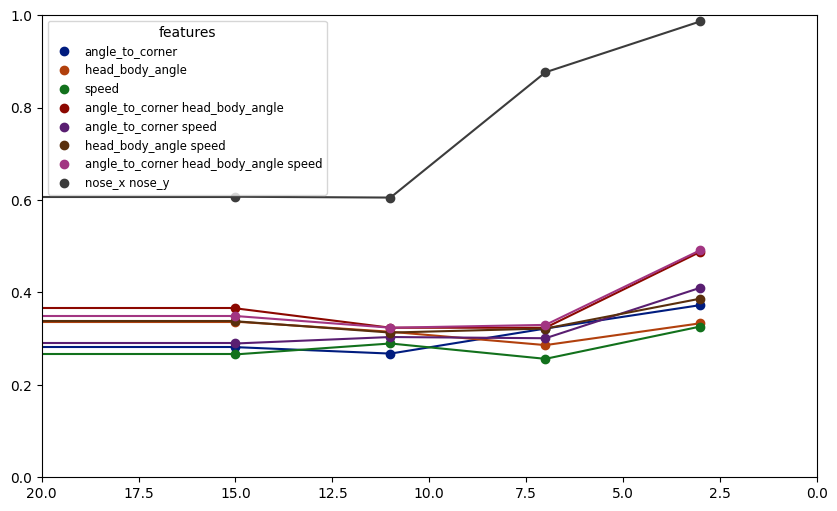

In [93]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
dictionary_list = []
feature_list = ['resampled_ob_ts_angle_to_corner',
 'resampled_ob_ts_head_body_angle',
 'resampled_ob_ts_speed']
feature_list_all_comb = generate_combinations(feature_list)
#feature_list =[
# 'resampled_ob_ts_head_body_angle',
# ]
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
for feature_list_comb in feature_list_all_comb:
    accuracy_list = []
    for lis in chunk_list:
        feature_mat = create_feature_matrix(test,feature_list_comb,chunking=True,chunk=lis)

        X, y = feature_mat, test.obstacle_cluster.to_numpy()
        no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
        no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)

        # Standardize the features (optional but recommended)
        #scaler = StandardScaler()
        #X_train_scaled = scaler.fit_transform(X_train)
        #X_test_scaled = scaler.transform(X_test)

        # Create and train a multinomial logistic regression model
        model = LogisticRegression()
        model.fit(X_train, y_train)

        # Make predictions on the testing set
        y_pred = model.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_list.append(accuracy)
    label = " ".join(str(x) for x in feature_list_comb)
    label = label.replace('resampled_ob_ts_', '')
    model_dict = {'type':'non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
    dictionary_list.append(model_dict)

postition_features = ['resampled_obstacle_nose_x',
 'resampled_obstacle_nose_y']
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
accuracy_list = []
for lis in chunk_list:
    feature_mat = create_feature_matrix(test,postition_features,chunking=True,chunk=lis)
    X, y = feature_mat, test.obstacle_cluster.to_numpy()
    no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)
    # Standardize the features (optional but recommended)
    #scaler = StandardScaler()
    #X_train_scaled = scaler.fit_transform(X_train)
    #X_test_scaled = scaler.transform(X_test)
    # Create and train a multinomial logistic regression model
    model = LogisticRegression()
    model.fit(X_train, y_train)
    # Make predictions on the testing set
    y_pred = model.predict(X_test)
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_list.append(accuracy)
label = " ".join(str(x) for x in postition_features)
label = label.replace('resampled_obstacle_', '')
full_model_dict = {'type':'full_non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
dictionary_list.append(full_model_dict)



mean,mat=get_mean_of_df(test,'resampled_ob_ts_distance_from_edge',60,matx=True)
x_vector = [np.round(mean[15]),np.round(mean[29]),np.round(mean[44]),np.round(mean[59])]
nose = ['nose_x nose_y']
feature_list_all_comb.append(nose)
model_color_dict = create_color_dict_from_list(feature_list_all_comb,'dark')
fig,ax = plt.subplots(figsize=(10,6))
ax.set_xlim(20,0)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in model_color_dict.values()]
ax.legend(markers, model_color_dict.keys(), numpoints=1,title = 'features',loc='upper left', fontsize='small')
for model_dict in dictionary_list:
    ax.plot([np.round(mean[0]),np.round(mean[15])],[model_dict.get('accuracy')[0],model_dict.get('accuracy')[0]],color = model_color_dict.get(model_dict.get('model_features')))
    ax.plot(x_vector,model_dict.get('accuracy')[:4],color = model_color_dict.get(model_dict.get('model_features')),marker='o')
    print(x_vector,model_dict.get('accuracy'),model_dict.get('model_features'),)
#ax.plot(x_vector,full_model_dict.get('accuracy'),color = 'black',marker='o')
ax.set_ylim(0,1)


In [53]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
dictionary_list = []
feature_list = ['resampled_ob_ts_angle_to_corner',
 'resampled_ob_ts_head_body_angle',
 'resampled_ob_ts_speed']
feature_list_all_comb = generate_combinations(feature_list)
#feature_list =[
# 'resampled_ob_ts_head_body_angle',
# ]
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
for feature_list_comb in feature_list_all_comb:
    accuracy_list = []
    for lis in chunk_list:
        feature_mat = create_feature_matrix(obstacle_trajectories,feature_list_comb,chunking=True,chunk=lis)

        X, y = feature_mat, obstacle_trajectories.obstacle_cluster.to_numpy()
        no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
        no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)

        # Standardize the features (optional but recommended)
        #scaler = StandardScaler()
        #X_train_scaled = scaler.fit_transform(X_train)
        #X_test_scaled = scaler.transform(X_test)

        # Create and train a multinomial logistic regression model
        model = LogisticRegression()
        model.fit(X_train, y_train)

        # Make predictions on the testing set
        y_pred = model.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_list.append(accuracy)
    label = " ".join(str(x) for x in feature_list_comb)
    label = label.replace('resampled_ob_ts_', '')
    model_dict = {'type':'non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
    dictionary_list.append(model_dict)

postition_features = ['resampled_obstacle_nose_x',
 'resampled_obstacle_nose_y']
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
accuracy_list = []
for lis in chunk_list:
    feature_mat = create_feature_matrix(obstacle_trajectories,postition_features,chunking=True,chunk=lis)
    X, y = feature_mat, obstacle_trajectories.obstacle_cluster.to_numpy()
    no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)
    # Standardize the features (optional but recommended)
    #scaler = StandardScaler()
    #X_train_scaled = scaler.fit_transform(X_train)
    #X_test_scaled = scaler.transform(X_test)
    # Create and train a multinomial logistic regression model
    model = LogisticRegression()
    model.fit(X_train, y_train)
    # Make predictions on the testing set
    y_pred = model.predict(X_test)
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_list.append(accuracy)
label = " ".join(str(x) for x in postition_features)
label = label.replace('resampled_obstacle_', '')
full_model_dict = {'type':'full_non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
dictionary_list.append(full_model_dict)



mean,mat=get_mean_of_df(obstacle_trajectories,'resampled_ob_ts_distance_from_edge',60,matx=True)
x_vector = [np.round(mean[15]),np.round(mean[29]),np.round(mean[44]),np.round(mean[59])]
nose = ['nose_x nose_y']
feature_list_all_comb.append(nose)
model_color_dict = create_color_dict_from_list(feature_list_all_comb,'dark')
fig,ax = plt.subplots(figsize=(10,6))
ax.set_xlim(20,0)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in model_color_dict.values()]
ax.legend(markers, model_color_dict.keys(), numpoints=1,title = 'features',loc='upper left', fontsize='small')
for model_dict in dictionary_list:
    ax.plot([np.round(mean[0]),np.round(mean[15])],[model_dict.get('accuracy')[0],model_dict.get('accuracy')[0]],color = model_color_dict.get(model_dict.get('model_features')))
    ax.plot(x_vector,model_dict.get('accuracy')[:4],color = model_color_dict.get(model_dict.get('model_features')),marker='o')
    print(x_vector,model_dict.get('accuracy'),model_dict.get('model_features'),)
#ax.plot(x_vector,full_model_dict.get('accuracy'),color = 'black',marker='o')
ax.set_ylim(0,1)


NameError: name 'obstacle_trajectories' is not defined

In [797]:

light_0 = obstacle_trajectories[obstacle_trajectories['obstacle_cluster']==0].sample(200)
light_1 = obstacle_trajectories[obstacle_trajectories['obstacle_cluster']==1].sample(200)
light_4 = obstacle_trajectories[obstacle_trajectories['obstacle_cluster']==4].sample(200)
light_5 = obstacle_trajectories[obstacle_trajectories['obstacle_cluster']==5].sample(200)


light_log = pd.concat([light_0,light_1,light_4,light_5])

[15.0, 11.0, 7.0, 3.0] [0.225, 0.21, 0.27, 0.22, 0.25] angle_to_corner speed
[15.0, 11.0, 7.0, 3.0] [0.215, 0.265, 0.25, 0.28, 0.26] head_body_angle
[15.0, 11.0, 7.0, 3.0] [0.225, 0.215, 0.245, 0.33, 0.19] angle_to_corner head_body_angle
[15.0, 11.0, 7.0, 3.0] [0.25, 0.31, 0.25, 0.24, 0.25] angle_to_corner
[15.0, 11.0, 7.0, 3.0] [0.25, 0.28, 0.21, 0.23, 0.175] angle_to_corner head_body_angle speed
[15.0, 11.0, 7.0, 3.0] [0.22, 0.265, 0.245, 0.25, 0.31] speed
[15.0, 11.0, 7.0, 3.0] [0.195, 0.265, 0.255, 0.24, 0.275] head_body_angle speed
[15.0, 11.0, 7.0, 3.0] [0.165, 0.19, 0.15, 0.09, 0.175] nose_x nose_y


(0.0, 1.0)

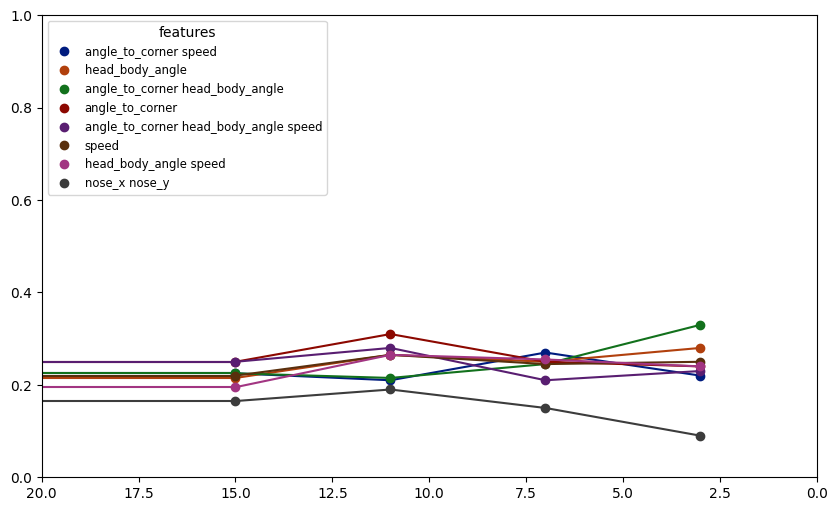

In [804]:
import numpy as np
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
dictionary_list = []
feature_list = ['resampled_ob_ts_angle_to_corner',
 'resampled_ob_ts_head_body_angle',
 'resampled_ob_ts_speed']
feature_list_all_comb = generate_combinations(feature_list)
#feature_list =[
# 'resampled_ob_ts_head_body_angle',
# ]
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
for feature_list_comb in feature_list_all_comb:
    accuracy_list = []
    for lis in chunk_list:
        feature_mat = create_feature_matrix(light_log,feature_list_comb,chunking=True,chunk=lis)

        X, y = feature_mat, light_log.obstacle_cluster.to_numpy()
        no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
        no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)
        np.random.shuffle(y_train)

        # Standardize the features (optional but recommended)
        #scaler = StandardScaler()
        #X_train_scaled = scaler.fit_transform(X_train)
        #X_test_scaled = scaler.transform(X_test)

        # Create and train a multinomial logistic regression model
        model = LogisticRegression()
        model.fit(X_train, y_train)
        

        # Make predictions on the testing set
        y_pred = model.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_list.append(accuracy)
    label = " ".join(str(x) for x in feature_list_comb)
    label = label.replace('resampled_ob_ts_', '')
    model_dict = {'type':'non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
    dictionary_list.append(model_dict)

postition_features = ['resampled_obstacle_nose_x',
 'resampled_obstacle_nose_y']
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
accuracy_list = []
for lis in chunk_list:
    feature_mat = create_feature_matrix(light_log,postition_features,chunking=True,chunk=lis)
    X, y = feature_mat, light_log.obstacle_cluster.to_numpy()
    no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)
    np.random.shuffle(y_train)
    # Standardize the features (optional but recommended)
    #scaler = StandardScaler()
    #X_train_scaled = scaler.fit_transform(X_train)
    #X_test_scaled = scaler.transform(X_test)
    # Create and train a multinomial logistic regression model
    model = LogisticRegression()
    model.fit(X_train, y_train)
    # Make predictions on the testing set
    y_pred = model.predict(X_test)
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_list.append(accuracy)
label = " ".join(str(x) for x in postition_features)
label = label.replace('resampled_obstacle_', '')
full_model_dict = {'type':'full_non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
dictionary_list.append(full_model_dict)



mean,mat=get_mean_of_df(light_log,'resampled_ob_ts_distance_from_edge',60,matx=True)
x_vector = [np.round(mean[15]),np.round(mean[29]),np.round(mean[44]),np.round(mean[59])]
nose = ['nose_x nose_y']
feature_list_all_comb.append(nose)
model_color_dict = create_color_dict_from_list(feature_list_all_comb,'dark')
fig,ax = plt.subplots(figsize=(10,6))
ax.set_xlim(20,0)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in model_color_dict.values()]
ax.legend(markers, model_color_dict.keys(), numpoints=1,title = 'features',loc='upper left', fontsize='small')
for model_dict in dictionary_list:
    ax.plot([np.round(mean[0]),np.round(mean[15])],[model_dict.get('accuracy')[0],model_dict.get('accuracy')[0]],color = model_color_dict.get(model_dict.get('model_features')))
    ax.plot(x_vector,model_dict.get('accuracy')[:4],color = model_color_dict.get(model_dict.get('model_features')),marker='o')
    print(x_vector,model_dict.get('accuracy'),model_dict.get('model_features'),)
#ax.plot(x_vector,full_model_dict.get('accuracy'),color = 'black',marker='o')
ax.set_ylim(0,1)


In [ ]:
oa_long

In [810]:
dark_obstacle_trajectories.animal

9       G8CK1RT
47      G8CK1RT
49      G8CK1RT
51      G8CK1RT
53      G8CK1RT
         ...   
3429     G8CKLN
3447     G8CKLN
3465     G8CKLN
3473     G8CKLN
3475     G8CKLN
Name: animal, Length: 1100, dtype: object

In [811]:

df = find_consective_trials(dark_obstacle_trajectories)

In [831]:
#irst_dark = dark_obstacle_trajectories[dark_obstacle_trajectories['consecutive']==1.0]
dark_0 = first_dark[first_dark['obstacle_cluster']==0].sample(50)
dark_1 = first_dark[first_dark['obstacle_cluster']==1].sample(50)
dark_4 = first_dark[first_dark['obstacle_cluster']==4].sample(50)
dark_5 = first_dark[first_dark['obstacle_cluster']==5].sample(50)


dark_log = pd.concat([dark_0,dark_1,dark_4,dark_5])

In [884]:

dark_0 = dark_obstacle_trajectories[dark_obstacle_trajectories['obstacle_cluster']==0].sample(200)
dark_1 = dark_obstacle_trajectories[dark_obstacle_trajectories['obstacle_cluster']==1].sample(200)
dark_4 = dark_obstacle_trajectories[dark_obstacle_trajectories['obstacle_cluster']==4].sample(200)
dark_5 = dark_obstacle_trajectories[dark_obstacle_trajectories['obstacle_cluster']==5].sample(200)


dark_log = pd.concat([dark_0,dark_1,dark_4,dark_5])

[15.0, 10.0, 6.0, 3.0] [0.2581818181818182, 0.27636363636363637, 0.26545454545454544, 0.4109090909090909, 0.4218181818181818] angle_to_corner speed
[15.0, 10.0, 6.0, 3.0] [0.3490909090909091, 0.3054545454545455, 0.26545454545454544, 0.36363636363636365, 0.4581818181818182] head_body_angle
[15.0, 10.0, 6.0, 3.0] [0.31272727272727274, 0.26545454545454544, 0.2690909090909091, 0.4509090909090909, 0.5018181818181818] angle_to_corner head_body_angle
[15.0, 10.0, 6.0, 3.0] [0.26181818181818184, 0.3090909090909091, 0.2909090909090909, 0.36363636363636365, 0.38545454545454544] angle_to_corner
[15.0, 10.0, 6.0, 3.0] [0.31636363636363635, 0.31636363636363635, 0.3054545454545455, 0.48727272727272725, 0.5272727272727272] angle_to_corner head_body_angle speed
[15.0, 10.0, 6.0, 3.0] [0.24, 0.28363636363636363, 0.27636363636363637, 0.31272727272727274, 0.3054545454545455] speed
[15.0, 10.0, 6.0, 3.0] [0.3418181818181818, 0.33090909090909093, 0.27636363636363637, 0.37454545454545457, 0.4472727272727272

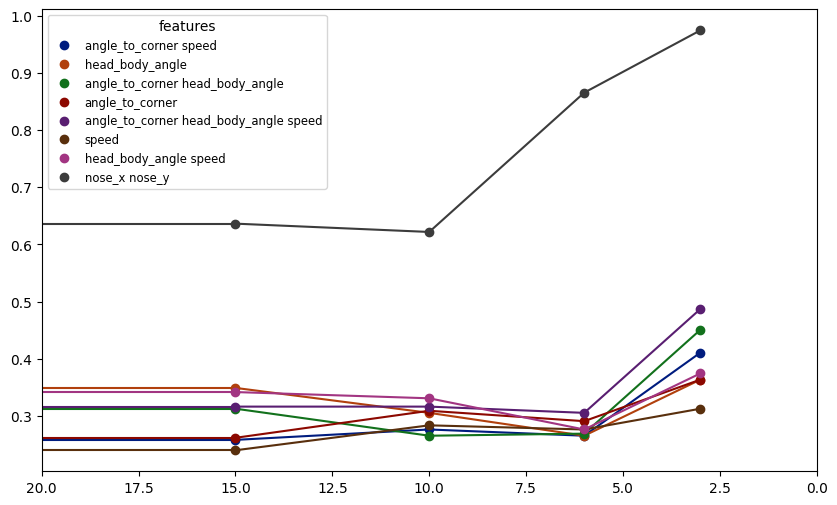

In [931]:
dark_dictionary_list = []
feature_list = ['resampled_ob_ts_angle_to_corner',
 'resampled_ob_ts_head_body_angle',
 'resampled_ob_ts_speed']
feature_list_all_comb = generate_combinations(feature_list)
#feature_list =[
# 'resampled_ob_ts_head_body_angle',
# ]
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
for feature_list_comb in feature_list_all_comb:
    accuracy_list = []
    for lis in chunk_list:
        feature_mat = create_feature_matrix(dark_obstacle_trajectories,feature_list_comb,chunking=True,chunk=lis)

        X, y = feature_mat, dark_obstacle_trajectories.obstacle_cluster.to_numpy()
        no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
        no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
        
        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)

        # Standardize the features (optional but recommended)
        #scaler = StandardScaler()
        #X_train_scaled = scaler.fit_transform(X_train)
        #X_test_scaled = scaler.transform(X_test)

        # Create and train a multinomial logistic regression model
        model = LogisticRegression()
        model.fit(X_train, y_train)

        # Make predictions on the testing set
        y_pred = model.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_list.append(accuracy)
    label = " ".join(str(x) for x in feature_list_comb)
    label = label.replace('resampled_ob_ts_', '')
    model_dict = {'type':'non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
    dark_dictionary_list.append(model_dict)

postition_features = ['resampled_obstacle_nose_x',
 'resampled_obstacle_nose_y']
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
accuracy_list = []
for lis in chunk_list:
    feature_mat = create_feature_matrix(dark_obstacle_trajectories,postition_features,chunking=True,chunk=lis)
    X, y = feature_mat, dark_obstacle_trajectories.obstacle_cluster.to_numpy()
    no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)
    # Standardize the features (optional but recommended)
    #scaler = StandardScaler()
    #X_train_scaled = scaler.fit_transform(X_train)
    #X_test_scaled = scaler.transform(X_test)
    # Create and train a multinomial logistic regression model
    model = LogisticRegression()
    model.fit(X_train, y_train)
    # Make predictions on the testing set
    y_pred = model.predict(X_test)
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_list.append(accuracy)
label = " ".join(str(x) for x in postition_features)
label = label.replace('resampled_obstacle_', '')
full_model_dict = {'type':'full_non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
dark_dictionary_list.append(full_model_dict)

mean,mat=get_mean_of_df(dark_obstacle_trajectories,'resampled_ob_ts_distance_from_edge',60,matx=True)
x_vector = [np.round(mean[15]),np.round(mean[29]),np.round(mean[44]),np.round(mean[59])]
nose = ['nose_x nose_y']
feature_list_all_comb.append(nose)
model_color_dict = create_color_dict_from_list(feature_list_all_comb,'dark')
fig,ax = plt.subplots(figsize=(10,6))
ax.set_xlim(20,0)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in model_color_dict.values()]
ax.legend(markers, model_color_dict.keys(), numpoints=1,title = 'features',loc='upper left', fontsize='small')
for model_dict in dark_dictionary_list:
    ax.plot([np.round(mean[0]),np.round(mean[15])],[model_dict.get('accuracy')[0],model_dict.get('accuracy')[0]],color = model_color_dict.get(model_dict.get('model_features')))
    ax.plot(x_vector,model_dict.get('accuracy')[:4],color = model_color_dict.get(model_dict.get('model_features')),marker='o')
    print(x_vector,model_dict.get('accuracy'),model_dict.get('model_features'),)
#ax.plot(x_vector,full_model_dict.get('accuracy'),color = 'black',marker='o')


[15.0, 10.0, 6.0, 3.0] [0.26181818181818184, 0.21818181818181817, 0.24, 0.21818181818181817, 0.23636363636363636] angle_to_corner speed
[15.0, 10.0, 6.0, 3.0] [0.21818181818181817, 0.26545454545454544, 0.2727272727272727, 0.2109090909090909, 0.2509090909090909] head_body_angle
[15.0, 10.0, 6.0, 3.0] [0.2109090909090909, 0.2690909090909091, 0.2581818181818182, 0.20363636363636364, 0.24] angle_to_corner head_body_angle
[15.0, 10.0, 6.0, 3.0] [0.24363636363636362, 0.22181818181818183, 0.2581818181818182, 0.23636363636363636, 0.2109090909090909] angle_to_corner
[15.0, 10.0, 6.0, 3.0] [0.2509090909090909, 0.23636363636363636, 0.2690909090909091, 0.2727272727272727, 0.24] angle_to_corner head_body_angle speed
[15.0, 10.0, 6.0, 3.0] [0.22545454545454546, 0.2581818181818182, 0.19272727272727272, 0.23272727272727273, 0.2545454545454545] speed
[15.0, 10.0, 6.0, 3.0] [0.2690909090909091, 0.2581818181818182, 0.2290909090909091, 0.3236363636363636, 0.2909090909090909] head_body_angle speed
[15.0, 1

(0.0, 1.0)

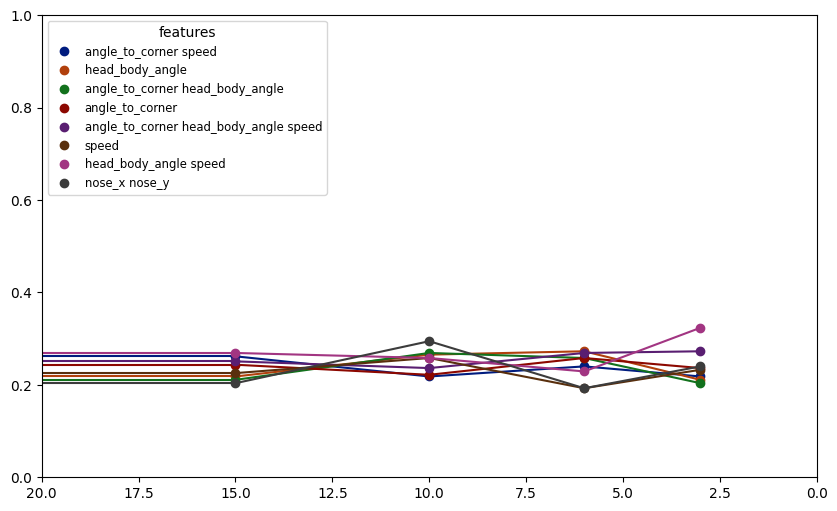

In [878]:
dark_dictionary_list = []
feature_list = ['resampled_ob_ts_angle_to_corner',
 'resampled_ob_ts_head_body_angle',
 'resampled_ob_ts_speed']
feature_list_all_comb = generate_combinations(feature_list)
#feature_list =[
# 'resampled_ob_ts_head_body_angle',
# ]
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
for feature_list_comb in feature_list_all_comb:
    accuracy_list = []
    for lis in chunk_list:
        feature_mat = create_feature_matrix(dark_obstacle_trajectories,feature_list_comb,chunking=True,chunk=lis)

        X, y = feature_mat, dark_obstacle_trajectories.obstacle_cluster.to_numpy()
        no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
        no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)
        np.random.shuffle(y_train)

        # Standardize the features (optional but recommended)
        #scaler = StandardScaler()
        #X_train_scaled = scaler.fit_transform(X_train)
        #X_test_scaled = scaler.transform(X_test)

        # Create and train a multinomial logistic regression model
        model = LogisticRegression()
        model.fit(X_train, y_train)

        # Make predictions on the testing set
        y_pred = model.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_list.append(accuracy)
    label = " ".join(str(x) for x in feature_list_comb)
    label = label.replace('resampled_ob_ts_', '')
    model_dict = {'type':'non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
    dark_dictionary_list.append(model_dict)

postition_features = ['resampled_obstacle_nose_x',
 'resampled_obstacle_nose_y']
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
accuracy_list = []
for lis in chunk_list:
    feature_mat = create_feature_matrix(dark_obstacle_trajectories,postition_features,chunking=True,chunk=lis)
    X, y = feature_mat, dark_obstacle_trajectories.obstacle_cluster.to_numpy()
    no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)
    np.random.shuffle(y_train)
    # Standardize the features (optional but recommended)
    #scaler = StandardScaler()
    #X_train_scaled = scaler.fit_transform(X_train)
    #X_test_scaled = scaler.transform(X_test)
    # Create and train a multinomial logistic regression model
    model = LogisticRegression()
    model.fit(X_train, y_train)
    # Make predictions on the testing set
    y_pred = model.predict(X_test)
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_list.append(accuracy)
label = " ".join(str(x) for x in postition_features)
label = label.replace('resampled_obstacle_', '')
full_model_dict = {'type':'full_non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
dark_dictionary_list.append(full_model_dict)

mean,mat=get_mean_of_df(dark_obstacle_trajectories,'resampled_ob_ts_distance_from_edge',60,matx=True)
x_vector = [np.round(mean[15]),np.round(mean[29]),np.round(mean[44]),np.round(mean[59])]
nose = ['nose_x nose_y']
feature_list_all_comb.append(nose)
model_color_dict = create_color_dict_from_list(feature_list_all_comb,'dark')
fig,ax = plt.subplots(figsize=(10,6))
ax.set_xlim(20,0)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in model_color_dict.values()]
ax.legend(markers, model_color_dict.keys(), numpoints=1,title = 'features',loc='upper left', fontsize='small')
for model_dict in dark_dictionary_list:
    ax.plot([np.round(mean[0]),np.round(mean[15])],[model_dict.get('accuracy')[0],model_dict.get('accuracy')[0]],color = model_color_dict.get(model_dict.get('model_features')))
    ax.plot(x_vector,model_dict.get('accuracy')[:4],color = model_color_dict.get(model_dict.get('model_features')),marker='o')
    print(x_vector,model_dict.get('accuracy'),model_dict.get('model_features'),)
#ax.plot(x_vector,full_model_dict.get('accuracy'),color = 'black',marker='o')
ax.set_ylim(0,1)

In [756]:
ns_oa_long.groupby(['obstacle_cluster'])['obstacle_cluster'].count()

obstacle_cluster
0    1170
1    1175
4     989
5    1238
Name: obstacle_cluster, dtype: int64

In [779]:
resampled_ob_vector.shape

(60,)

In [780]:
light_dark_trajectories

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,ts_head_body_angle,skill,resampled_go_ts_speed,resampled_go_ts_angle_to_corner,resampled_go_ts_head_body_angle,resampled_go_ts_distance_from_edge
2970,110,119.0,44494.177689,44496.426534,"[44494.1819, 44494.198208, 44494.214656, 44494...","[[16507, 16508, 16509, 16510, 16511, 16512, 16...","[672.1832885742188, 672.48193359375, 672.41821...","[259.21246337890625, 259.9964294433594, 260.76...","[661.6688232421875, 662.4036254882812, 662.653...","[247.52462768554688, 248.75450134277344, 249.4...",...,1.032894,0.968153,1.182905,0.845376,"[140.06015824431225, 142.88887735041084, 147.5...",NaN,"[34.03806728057028, 34.09698935166116, 34.1559...","[71.37160180498051, 69.34379345015897, 67.3159...","[140.06015824431225, 141.30671242666077, 142.5...","[18.919128175867037, 18.675440593089647, 18.43..."
2457,97,103.0,65088.499340,65090.834368,"[65088.507404, 65088.524467, 65088.540761, 650...","[[15263, 15264, 15265, 15266, 15267, 15268, 15...","[675.6631469726562, 677.099609375, 677.2597656...","[264.00238037109375, 264.7333984375, 264.73620...","[660.4969482421875, 662.7481079101562, 664.325...","[259.0888366699219, 258.5141906738281, 258.647...",...,1.023790,0.976762,1.158173,0.863429,"[123.16830687742124, 123.79794378402246, 126.6...",NaN,NaN,NaN,NaN,NaN
191,49,53.0,64494.984345,64497.232998,"[64494.989363, 64495.005542, 64495.02231, 6449...","[[10840, 10841, 10842, 10843, 10844, 10845, 10...","[678.941650390625, 679.8837280273438, 680.3151...","[276.7287292480469, 277.58697509765625, 278.07...","[663.9141845703125, 666.22607421875, 667.94769...","[272.2152404785156, 271.7706298828125, 271.233...",...,1.021882,0.978586,1.101471,0.907877,"[134.8994022134468, 142.69017953416318, 145.27...",NaN,NaN,NaN,NaN,NaN
279,19,23.0,65617.263270,65620.482956,"[65617.271001, 65617.287846, 65617.304652, 656...","[[5536, 5537, 5538, 5539, 5540, 5541, 5542, 55...","[680.0969848632812, 681.1248779296875, 681.399...","[280.849853515625, 281.00958251953125, 281.522...","[669.9534912109375, 670.1199340820312, 670.601...","[270.92535400390625, 271.2862243652344, 271.96...",...,1.108744,0.901922,1.655307,0.604117,"[171.18245931579773, 172.5648121034677, 170.85...",NaN,NaN,NaN,NaN,NaN
965,32,37.0,45189.872409,45192.199296,"[45189.883417, 45189.900531, 45189.917811, 451...","[[6922, 6923, 6924, 6925, 6926, 6927, 6928, 69...","[684.7473754882812, 685.6484375, 686.997924804...","[274.3197021484375, 275.30621337890625, 275.37...","[673.4404296875, 674.8185424804688, 675.630310...","[266.646484375, 267.2105712890625, 267.1451110...",...,1.276067,0.783658,1.254817,0.796929,"[153.55770424636052, 157.21984210202822, 155.4...",NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8465,29,30.0,43909.606681,43912.060467,"[43909.612121, 43909.630412, 43909.645376, 439...","[5042, 5043, 5044, 5045, 5046, 5047, 5048, 504...","[114.96570587158203, 114.8096694946289, 114.99...","[278.19329833984375, 278.1583557128906, 278.94...","[132.63021850585938, 133.19097900390625, 133.3...","[273.2281494140625, 272.9744567871094, 273.747...",...,1.313158,0.761523,1.031963,0.969027,"[148.4885567352137, 152.42436779112703, 147.87...",middle,NaN,NaN,NaN,NaN
6525,101,110.0,53407.917196,53411.198323,"[53407.925721, 53407.942617, 53407.960345, 534...","[18240, 18241, 18242, 18243, 18244, 18245, 182...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[121.90214538574219, 121.43171691894531, 120.8...","[276.9621276855469, 276.0755615234375, 275.189...",...,1.151080,0.868749,1.030978,0.969953,"[167.72176259203448, 167.2465456326863, 157.20...",early,NaN,NaN,NaN,NaN
2536,46,50.0,54009.433164,54011.464960,"[54009.435366, 54009.453209, 54009.468646, 540...","[9942, 9943, 9944, 9945, 9946, 9947, 9948, 994...","[110.55894470214844

In [895]:
dark_0 = dark_obstacle_trajectories[dark_obstacle_trajectories['obstacle_cluster']==0].sample(200)
dark_1 = dark_obstacle_trajectories[dark_obstacle_trajectories['obstacle_cluster']==1].sample(200)
dark_4 = dark_obstacle_trajectories[dark_obstacle_trajectories['obstacle_cluster']==4].sample(200)
dark_5 = dark_obstacle_trajectories[dark_obstacle_trajectories['obstacle_cluster']==5].sample(200)

light_0 = obstacle_trajectories[obstacle_trajectories['obstacle_cluster']==0].sample(200)
light_1 = obstacle_trajectories[obstacle_trajectories['obstacle_cluster']==1].sample(200)
light_4 = obstacle_trajectories[obstacle_trajectories['obstacle_cluster']==4].sample(200)
light_5 = obstacle_trajectories[obstacle_trajectories['obstacle_cluster']==5].sample(200)

light_dark = pd.concat([dark_0,dark_1,dark_4,dark_5,light_0,light_1,light_4,light_5])


#light_dark_trajectories = drop_nans_in_columns(light_dark,'obstacle_ind')
#print(len(light_dark_trajectories))
#light_dark_trajectories = drop_nans_in_columns(light_dark_trajectories,'ts_speed')
#print(len(light_dark_trajectories))
#light_dark_trajectories = drop_nans_in_columns(light_dark_trajectories,'ts_angle_to_corner')
#print(len(light_dark_trajectories))
#light_dark_trajectories = drop_nans_in_columns(light_dark_trajectories,'ts_head_body_angle')
#print(len(light_dark_trajectories))
#
#var_list =  ['ts_speed','ts_angle_to_corner','ts_head_body_angle','ts_distance_from_edge']
#for ind,row in light_dark_trajectories.iterrows():
#    for i in var_list:
#        #obstacle_vector = create_obstacle_vector(row,i)
#        resampled_ob_vector = create_obstacle_vector_resampled(row,i,60)
#        
#        #light_dark_trajectories.at[ind,'ob_' + i] = obstacle_vector
#        light_dark_trajectories.at[ind,'resampled_go_' + i] = resampled_ob_vector.astype(object)
#var_list =  ['goal_nose_x','goal_nose_y']
#for ind,row in light_dark_trajectories.iterrows():
#    for i in var_list:
#        resample_vec = resample(row[i],60)
#        light_dark_trajectories.at[ind,'resampled_' + i] = resample_vec.astype(object)

[15.0, 10.0, 7.0, 3.0] [0.6075, 0.5825, 0.6025, 0.71, 0.7475] angle_to_corner speed
[15.0, 10.0, 7.0, 3.0] [0.585, 0.62, 0.5725, 0.5625, 0.6375] head_body_angle
[15.0, 10.0, 7.0, 3.0] [0.6025, 0.615, 0.64, 0.6875, 0.745] angle_to_corner head_body_angle
[15.0, 10.0, 7.0, 3.0] [0.61, 0.625, 0.6275, 0.6925, 0.62] angle_to_corner
[15.0, 10.0, 7.0, 3.0] [0.615, 0.615, 0.6275, 0.72, 0.79] angle_to_corner head_body_angle speed
[15.0, 10.0, 7.0, 3.0] [0.6325, 0.5575, 0.5875, 0.615, 0.69] speed
[15.0, 10.0, 7.0, 3.0] [0.585, 0.5725, 0.585, 0.63, 0.7375] head_body_angle speed
[15.0, 10.0, 7.0, 3.0] [0.6475, 0.65, 0.705, 0.7775, 0.8] nose_x nose_y resampled_ob_ts_angle_to_corner resampled_ob_ts_head_body_angle resampled_ob_ts_speed


(0.5, 1.0)

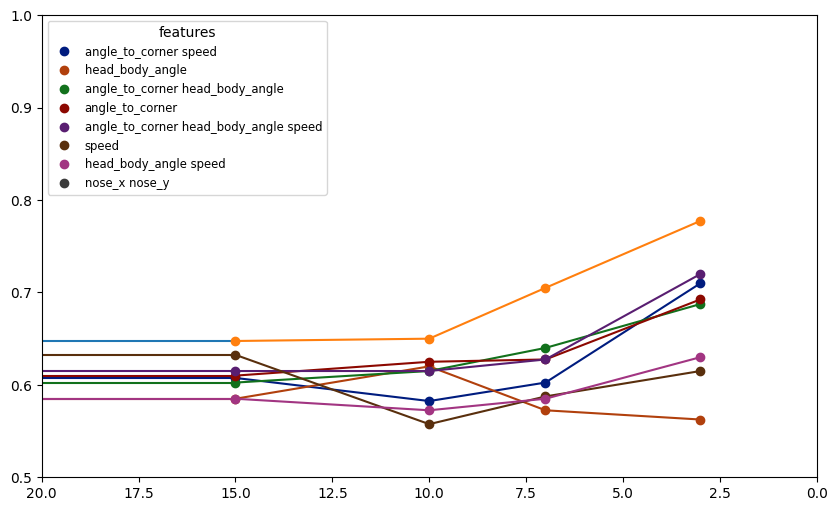

In [896]:
light_dark_dictionary_list = []
feature_list = ['resampled_ob_ts_angle_to_corner',
 'resampled_ob_ts_head_body_angle',
 'resampled_ob_ts_speed']
feature_list_all_comb = generate_combinations(feature_list)
#feature_list =[
# 'resampled_ob_ts_head_body_angle',
# ]
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
for feature_list_comb in feature_list_all_comb:
    accuracy_list = []
    for lis in chunk_list:
        feature_mat = create_feature_matrix(light_dark,feature_list_comb,chunking=True,chunk=lis)

        X, y = feature_mat, light_dark.task.to_numpy()
        no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
        no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)

        # Standardize the features (optional but recommended)
        #scaler = StandardScaler()
        #X_train_scaled = scaler.fit_transform(X_train)
        #X_test_scaled = scaler.transform(X_test)

        # Create and train a multinomial logistic regression model
        model = LogisticRegression(penalty="l2")
        model.fit(X_train, y_train)

        # Make predictions on the testing set
        y_pred = model.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_list.append(accuracy)
    label = " ".join(str(x) for x in feature_list_comb)
    label = label.replace('resampled_ob_ts_', '')
    model_dict = {'type':'non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
    light_dark_dictionary_list.append(model_dict)


postition_features = ['resampled_obstacle_nose_x',
 'resampled_obstacle_nose_y','resampled_ob_ts_angle_to_corner',
 'resampled_ob_ts_head_body_angle',
 'resampled_ob_ts_speed']
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
accuracy_list = []
for lis in chunk_list:
    feature_mat = create_feature_matrix(light_dark,postition_features,chunking=True,chunk=lis)
    X, y = feature_mat, light_dark.task.to_numpy()
    no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)
    # Standardize the features (optional but recommended)
    #scaler = StandardScaler()
    #X_train_scaled = scaler.fit_transform(X_train)
    #X_test_scaled = scaler.transform(X_test)
    # Create and train a multinomial logistic regression model
    model = LogisticRegression()
    model.fit(X_train, y_train)
    # Make predictions on the testing set
    y_pred = model.predict(X_test)
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_list.append(accuracy)
label = " ".join(str(x) for x in postition_features)
label = label.replace('resampled_obstacle_', '')
full_model_dict = {'type':'full_non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
light_dark_dictionary_list.append(full_model_dict)

mean,mat=get_mean_of_df(light_dark,'resampled_ob_ts_distance_from_edge',60,matx=True)
x_vector = [np.round(mean[15]),np.round(mean[29]),np.round(mean[44]),np.round(mean[59])]
nose = ['nose_x nose_y']
feature_list_all_comb.append(nose)
model_color_dict = create_color_dict_from_list(feature_list_all_comb,'dark')
fig,ax = plt.subplots(figsize=(10,6))
ax.set_xlim(20,0)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in model_color_dict.values()]
ax.legend(markers, model_color_dict.keys(), numpoints=1,title = 'features',loc='upper left', fontsize='small')
for model_dict in light_dark_dictionary_list:
    ax.plot([np.round(mean[0]),np.round(mean[15])],[model_dict.get('accuracy')[0],model_dict.get('accuracy')[0]],color = model_color_dict.get(model_dict.get('model_features')))
    ax.plot(x_vector,model_dict.get('accuracy')[:4],color = model_color_dict.get(model_dict.get('model_features')),marker='o')
    print(x_vector,model_dict.get('accuracy'),model_dict.get('model_features'),)
#ax.plot(x_vector,full_model_dict.get('accuracy'),color = 'black',marker='o')
ax.set_ylim(.50,1)

[15.0, 10.0, 7.0, 3.0] [0.5625, 0.55, 0.555, 0.5875, 0.55] angle_to_corner speed
[15.0, 10.0, 7.0, 3.0] [0.5775, 0.58, 0.5825, 0.58, 0.5725] head_body_angle
[15.0, 10.0, 7.0, 3.0] [0.585, 0.555, 0.58, 0.57, 0.5725] angle_to_corner head_body_angle
[15.0, 10.0, 7.0, 3.0] [0.5825, 0.57, 0.58, 0.575, 0.555] angle_to_corner
[15.0, 10.0, 7.0, 3.0] [0.5775, 0.5825, 0.58, 0.57, 0.57] angle_to_corner head_body_angle speed
[15.0, 10.0, 7.0, 3.0] [0.565, 0.5575, 0.5925, 0.58, 0.5625] speed
[15.0, 10.0, 7.0, 3.0] [0.565, 0.5875, 0.585, 0.57, 0.5925] head_body_angle speed
[15.0, 10.0, 7.0, 3.0] [0.57, 0.56, 0.5675, 0.585, 0.565] nose_x nose_y resampled_ob_ts_angle_to_corner resampled_ob_ts_head_body_angle resampled_ob_ts_speed


(0.5, 1.0)

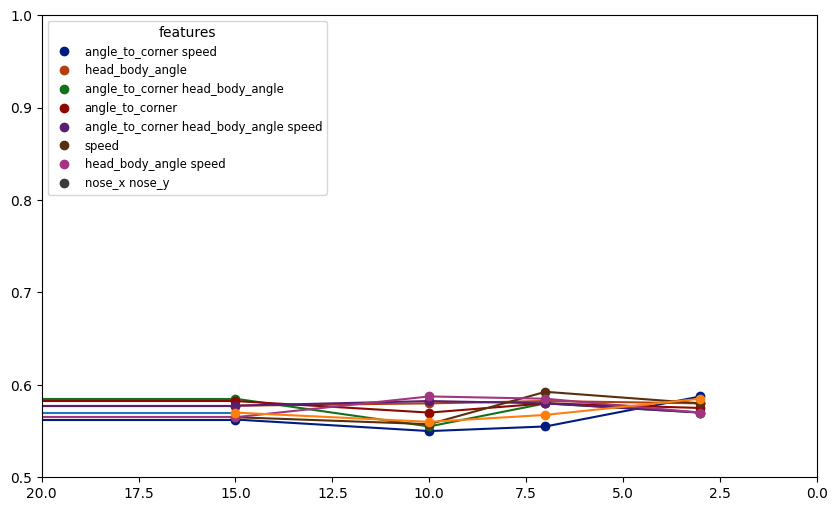

In [847]:
light_dark_dictionary_list = []
feature_list = ['resampled_ob_ts_angle_to_corner',
 'resampled_ob_ts_head_body_angle',
 'resampled_ob_ts_speed']
feature_list_all_comb = generate_combinations(feature_list)
#feature_list =[
# 'resampled_ob_ts_head_body_angle',
# ]
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
for feature_list_comb in feature_list_all_comb:
    accuracy_list = []
    for lis in chunk_list:
        feature_mat = create_feature_matrix(light_dark,feature_list_comb,chunking=True,chunk=lis)

        X, y = feature_mat, light_dark.task.to_numpy()
        no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
        no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)
        np.random.shuffle(y_train)

        # Standardize the features (optional but recommended)
        #scaler = StandardScaler()
        #X_train_scaled = scaler.fit_transform(X_train)
        #X_test_scaled = scaler.transform(X_test)

        # Create and train a multinomial logistic regression model
        model = LogisticRegression()
        model.fit(X_train, y_train)

        # Make predictions on the testing set
        y_pred = model.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_list.append(accuracy)
    label = " ".join(str(x) for x in feature_list_comb)
    label = label.replace('resampled_ob_ts_', '')
    model_dict = {'type':'non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
    light_dark_dictionary_list.append(model_dict)

postition_features = ['resampled_obstacle_nose_x',
 'resampled_obstacle_nose_y','resampled_ob_ts_angle_to_corner',
 'resampled_ob_ts_head_body_angle',
 'resampled_ob_ts_speed']
chunk_list = [[0,15],[15,30],[30,45],[45,60],[0,60]]
accuracy_list = []
for lis in chunk_list:
    feature_mat = create_feature_matrix(light_dark,postition_features,chunking=True,chunk=lis)
    X, y = feature_mat, light_dark.task.to_numpy()
    no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)
    np.random.shuffle(y_train)
    # Standardize the features (optional but recommended)
    #scaler = StandardScaler()
    #X_train_scaled = scaler.fit_transform(X_train)
    #X_test_scaled = scaler.transform(X_test)
    # Create and train a multinomial logistic regression model
    model = LogisticRegression()
    model.fit(X_train, y_train)
    # Make predictions on the testing set
    y_pred = model.predict(X_test)
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_list.append(accuracy)
label = " ".join(str(x) for x in postition_features)
label = label.replace('resampled_obstacle_', '')
full_model_dict = {'type':'full_non_shuffled','model_features':label,'chunk':chunk_list,'accuracy':accuracy_list}
light_dark_dictionary_list.append(full_model_dict)

mean,mat=get_mean_of_df(light_dark,'resampled_ob_ts_distance_from_edge',60,matx=True)
x_vector = [np.round(mean[15]),np.round(mean[29]),np.round(mean[44]),np.round(mean[59])]
nose = ['nose_x nose_y']
feature_list_all_comb.append(nose)
model_color_dict = create_color_dict_from_list(feature_list_all_comb,'dark')
fig,ax = plt.subplots(figsize=(10,6))
ax.set_xlim(20,0)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in model_color_dict.values()]
ax.legend(markers, model_color_dict.keys(), numpoints=1,title = 'features',loc='upper left', fontsize='small')
for model_dict in light_dark_dictionary_list:
    ax.plot([np.round(mean[0]),np.round(mean[15])],[model_dict.get('accuracy')[0],model_dict.get('accuracy')[0]],color = model_color_dict.get(model_dict.get('model_features')))
    ax.plot(x_vector,model_dict.get('accuracy')[:4],color = model_color_dict.get(model_dict.get('model_features')),marker='o')
    print(x_vector,model_dict.get('accuracy'),model_dict.get('model_features'),)
#ax.plot(x_vector,full_model_dict.get('accuracy'),color = 'black',marker='o')
ax.set_ylim(0.5,1)

In [856]:
y_train_shuffled

array(['oa', 'oa', 'oa', ..., 'oa', 'oa', 'oa'], dtype=object)

In [877]:
import numpy as np
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Generate toy dataset
X, y = make_classification(n_samples=800, n_features=10, n_classes=2, random_state=42)

# Split dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
np.random.shuffle(y_train)

# Initialize logistic regression model
model = LogisticRegression()

# Train the model on the training data
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report:")
print(accuracy_score(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Classification Report:
0.45
Confusion Matrix:
[[39 40]
 [48 33]]


In [665]:

obstacle_trajectories = drop_nans_in_columns(ns_oa_long,'obstacle_ind')
print(len(obstacle_trajectories))
obstacle_trajectories = drop_nans_in_columns(obstacle_trajectories,'ts_speed')
print(len(obstacle_trajectories))
obstacle_trajectories = drop_nans_in_columns(obstacle_trajectories,'ts_angle_to_corner')
print(len(obstacle_trajectories))
obstacle_trajectories = drop_nans_in_columns(obstacle_trajectories,'ts_head_body_angle')
print(len(obstacle_trajectories))

var_list =  ['ts_speed','ts_angle_to_corner','ts_head_body_angle','ts_distance_from_edge']
for ind,row in obstacle_trajectories.iterrows():
    for i in var_list:
        obstacle_vector = create_obstacle_vector(row,i)
        resampled_obstacle_vector = create_obstacle_vector_resampled(row,i,60)
        
        obstacle_trajectories.at[ind,'ob_' + i] = obstacle_vector
        obstacle_trajectories.at[ind,'resampled_ob_' + i] = resampled_obstacle_vector.astype(object)
var_list =  ['obstacle_nose_x','obstacle_nose_y']
for ind,row in obstacle_trajectories.iterrows():
    for i in var_list:
        resample_vec = resample(row[i],60)
        obstacle_trajectories.at[ind,'resampled_' + i] = resample_vec.astype(object)

{'type': 'non_shuffled',
 'model_features': 'angle_to_corner head_body_angle speed',
 'chunk': [[0, 15], [15, 30], [30, 45], [45, 60], [0, 60]],
 'accuracy': [0.3901018922852984,
  0.36773255813953487,
  0.35755813953488375,
  0.5625,
  0.6812227074235808]}

In [489]:
import numpy as np
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
#feature_list = feature_list = list_columns(obstacle_trajectories,['resampled']).tolist()
feature_list =['resampled_ob_ts_speed',
 'resampled_ob_ts_angle_to_corner',
 'resampled_ob_ts_head_body_angle']
feature_mat = create_feature_matrix(obstacle_trajectories,feature_list)

X, y = feature_mat, obstacle_trajectories.obstacle_cluster.to_numpy()
no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)

# Standardize the features (optional but recommended)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train a multinomial logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.997093023255814


In [435]:
import numpy as np
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
feature_list = feature_list = list_columns(obstacle_trajectories,['resampled']).tolist()
#feature_list =['resampled_ob_ts_speed',
# 'resampled_ob_ts_angle_to_corner',
# 'resampled_ob_ts_head_body_angle']
feature_mat = create_feature_matrix(obstacle_trajectories,feature_list)

X, y = feature_mat, obstacle_trajectories.obstacle_cluster.to_numpy()
no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)


# Create and train a multinomial logistic regression model
model = LogisticRegression()
np.random.shuffle(y_train)

model.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.20232896652110627


In [420]:
import numpy as np
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
feature_list = ['resampled_go_ts_speed',
 ]
feature_mat = create_feature_matrix(goal_trajectories,feature_list)

X, y = feature_mat, goal_trajectories.obstacle_cluster.to_numpy()
no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)

# Standardize the features (optional but recommended)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train a multinomial logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = model.predict(X_test_scaled)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy) 

Accuracy: 0.4606413994169096


In [447]:
goal_trajectories

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,ob_ts_speed,ob_lateral_error,ob_ts_angle_to_corner,ob_ts_head_body_angle,resampled_go_ts_speed,resampled_go_ts_angle_to_corner,resampled_go_ts_head_body_angle,resampled_go_ts_distance_from_edge,resampled_goal_nose_x,resampled_goal_nose_y
18,19,23.0,55968.446784,55972.150118,"[55968.457036, 55968.474214, 55968.490777, 559...","[[7724, 7725, 7726, 7727, 7728, 7729, 7730, 77...","[684.8956909179688, 685.5166625976562, 686.734...","[276.1261901855469, 276.2704162597656, 276.096...","[669.5835571289062, 670.5010375976562, 671.231...","[272.48040771484375, 271.9192810058594, 271.15...",...,"[28.036854645480883, 35.38345628450323, 22.429...","[-9.372508435619421, -9.633112774553133, -9.83...","[68.40833890168726, 68.27690218486802, 64.2709...","[157.03191035768336, 160.6752657827071, 155.26...","[39.83797478888009, 29.55665980039028, 27.9850...","[47.95740843106668, 58.17941952690129, 66.3244...","[155.19275401408945, 154.03746850521236, 154.6...","[1.910558870470103, -1.4209792070549256, -2.38...","[28.654475229791945, 28.30175874601672, 27.941...","[25.445464799357076, 25.489194534968366, 25.51..."
29,30,35.0,56025.418905,56030.842496,"[56025.427046, 56025.443699, 56025.460428, 560...","[[11141, 11142, 11143, 11144, 11145, 11146, 11...","[681.3780517578125, nan, nan, nan, nan, nan, n...","[275.2206115722656, nan, nan, nan, nan, nan, n...","[669.8692626953125, 671.6943969726562, 674.338...","[268.4548034667969, 268.9363708496094, 268.745...",...,"[27.95962387889264, 18.7122494334595, 25.53639...","[-7.777065691544198, -8.025524757797799, -8.13...","[52.461418002213186, 58.301064134708994, 54.28...","[100.49752401897445, 111.18866325786432, 132.7...","[40.41736793639182, 27.670571029984668, 31.053...","[79.28351774845868, 84.28808874477856, 95.0042...","[177.14675599368633, 177.5475478909878, 178.36...","[4.15235169604119, -4.215884423902508, -4.4584...","[28.98287696409105, 28.529982205152017, 27.971...","[27.454632130269882, 27.657183380351515, 27.77..."
40,41,47.0,56089.383270,56096.416729,"[56089.399347, 56089.415577, 56089.432332, 560...","[[14978, 14979, 14980, 14981, 14982, 14983, 14...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[675.2911376953125, 677.028076171875, 678.3170...","[264.6787414550781, 265.697021484375, 266.2087...",...,"[6.761479038291383, 7.273841412726246, 9.16867...","[-1.3205064247509277, -1.326334640585337, -1.3...","[48.96766770468103, 46.80120138757102, 46.8276...","[133.78762360590784, 131.58603159981288, 136.6...","[21.16386678629616, 25.56082023862669, 29.3979...","[69.0310976042425, 79.90412858312389, 93.27480...","[171.18768886116837, 167.87872719449723, 170.9...","[-1.78069128493716, -2.054326843216561, -2.462...","[27.301867538788905, 26.92657020916906, 26.441...","[24.435673142497055, 24.636526432783967, 24.57..."
42,43,49.0,56101.012761,56104.130214,"[56101.019648, 56101.036364, 56101.053452, 561...","[[15675, 15676, 15677, 15678, 15679, 15680, 15...","[686.4649658203125, 685.9793090820312, nan, na...","[275.90142822265625, 277.9461975097656, nan, n...","[670.5230712890625, 671.7032470703125, 672.822...","[271.092041015625, 270.7273864746094, 270.5169...",...,"[18.143115966947125, 21.377393461554803, 13.02...","[-8.863174238162259, -9.01803978072083, -9.187...","[71.49271069685956, 70.39686772559646, 69.6178...","[154.00533502169654, 152.60534413942756, 155.6...","[32.67889066919931, 36.13495379030175, 25.2398...","[99.51843361660866, 107.62833760753989, 117.06...","[169.86083487729132, 164.91026792661336, 158.6...","[-1.8428938900264764, -2.2254502797300635, -2....","[26.929777858419925, 26.41542039469833, 26.083...","[24.32442334430936, 24.35278390113339, 24.3521..."
55,56,63.0,56172.563955,56176.160588,"[56172.578176, 56172.594867, 56172.612428, 561...","[[19967, 19968, 19969, 19970, 19971, 19972, 19...","[683.0909423828125,

In [445]:
row

level_0                                                                  0
index                                                                  0.0
first_poke                                                    59910.622438
second_poke                                                    59912.32654
trial_timestamps         [59910.636249, 59910.653606, 59910.669388, 599...
                                               ...                        
ts_head_body_angle       [132.61475125727986, 130.27282421127404, 129.4...
ob_ts_speed                                                            NaN
ob_lateral_error                                                       NaN
ob_ts_angle_to_corner                                                  NaN
ob_ts_head_body_angle                                                  NaN
Name: 11806, Length: 242, dtype: object

In [444]:
row.obstacle_nose_x

nan

(array([1620.,  768.,  212.,   71.,   37.,   19.,   10.,    5.,    3.,
           4.]),
 array([ 18. ,  47.5,  77. , 106.5, 136. , 165.5, 195. , 224.5, 254. ,
        283.5, 313. ]),
 <BarContainer object of 10 artists>)

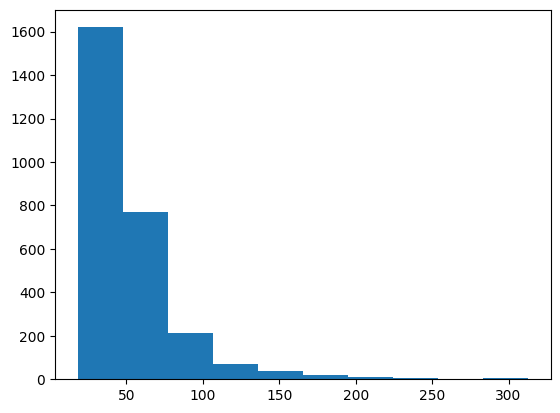

In [448]:
trial_length = []
for ind,row in goal_trajectories.iterrows():
    trial_length.append(len(row.obstacle_nose_x))
plt.hist(trial_length)

In [408]:
X_test.shape

(687, 150)

In [329]:
feature_list

['resampled_go_ts_speed',
 'resampled_go_ts_angle_to_corner',
 'resampled_go_ts_head_body_angle',
 'resampled_go_ts_distance_from_edge',
 'resampled_goal_nose_x',
 'resampled_goal_nose_y']

In [326]:
feature_list = list_columns(goal_trajectories,['resampled']).tolist()

In [328]:
feature_list = list_columns(goal_trajectories,['resampled']).tolist()
feature_mat = create_feature_matrix(goal_trajectories,feature_list)

X, y = feature_mat, goal_trajectories.obstacle_cluster.to_numpy()
no_nan_X = np.delete(X, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)
no_nan_y=np.delete(y, np.unique(np.argwhere(np.isnan(feature_mat))[:,0]), axis=0)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(no_nan_X, no_nan_y, test_size=0.25, random_state=42)

# Standardize the features (optional but recommended)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train a multinomial logistic regression model
model =LogisticRegression()
model.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = model.predict(X_test_scaled)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9912536443148688


In [2]:
model.classes_

NameError: name 'model' is not defined

In [279]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_pred)

array([[190,   0,   0,   0],
       [  2, 178,   0,   2],
       [  2,   0, 162,   1],
       [  0,   0,   0, 149]], dtype=int64)

In [ ]:
for date,date_df in by_date:
    color = color_map.get(str(date))
    rows = date_df.shape[0]
    angle_array = np.empty([rows,50])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle = np.nanmean(angle_array,axis = 0)
    ax[1,0].plot(xnew,date_angle,c = color,alpha = .7)

In [82]:
def create_obstacle_vector(row,key):
    obstacle_vector = row[key][:int(row.obstacle_ind)]
    return obstacle_vector
    

In [1]:
def flatten_list_of_arrays(array_list):
    flatten_array_list = np.concatenate(array_list).ravel().tolist()
    return np.asarray(flatten_array_list)
        

In [117]:
dark_long.date.unique()


array(['071023', '071123', '071223', '071323'], dtype=object)

In [287]:
for ind,row in dark_long.iterrows():
    if row.date == '071023':
        dark_long.at[ind,'skill'] = 'naive'
    elif row.date == '071123':
        dark_long.at[ind,'skill'] = 'early'
    elif row.date == '071223':
        dark_long.at[ind,'skill'] = 'middle'
    elif row.date == '071323':
        dark_long.at[ind,'skill'] = 'late'

<AxesSubplot: xlabel='task', ylabel='tortuosity'>

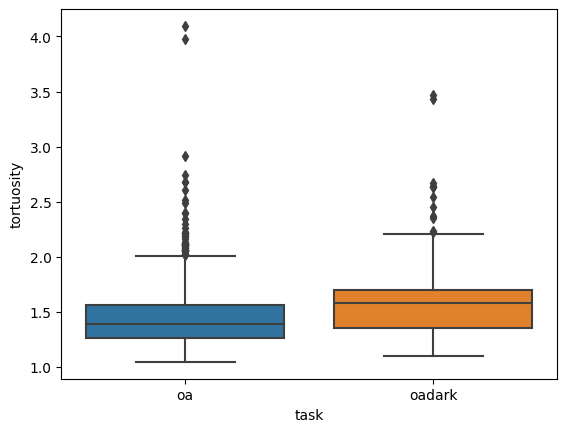

In [99]:
data= pd.concat([oa_long,dark_long])
sns.boxplot(data=data, x="task", y="tortuosity")

<AxesSubplot: xlabel='task', ylabel='ob_linearity'>

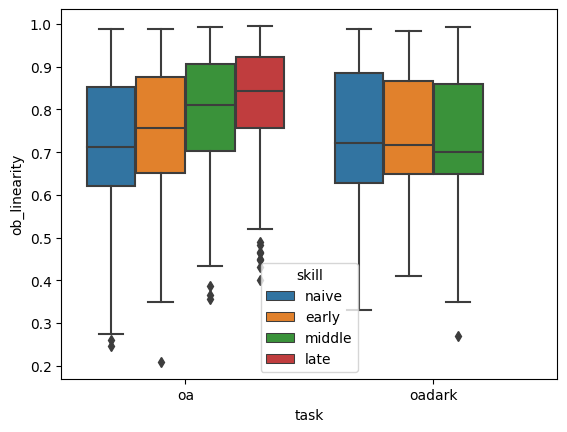

In [123]:
data= pd.concat([oa_long,dark_long])
sns.boxplot(data=data, x="task", y="ob_linearity",hue='skill')

<AxesSubplot: xlabel='task', ylabel='go_linearity'>

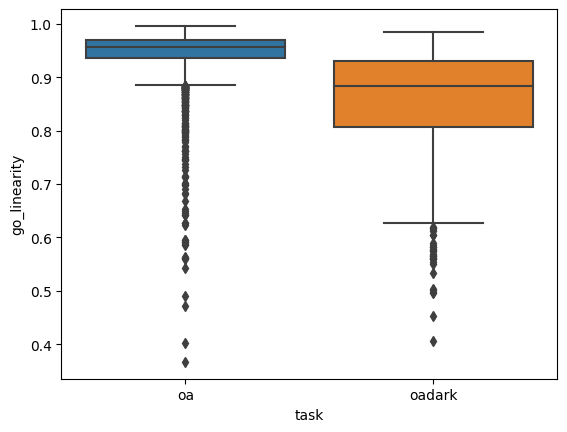

In [111]:
data= pd.concat([oa_long,dark_long])
sns.boxplot(data=data, x="task", y="go_linearity")

<AxesSubplot: xlabel='task', ylabel='linearity'>

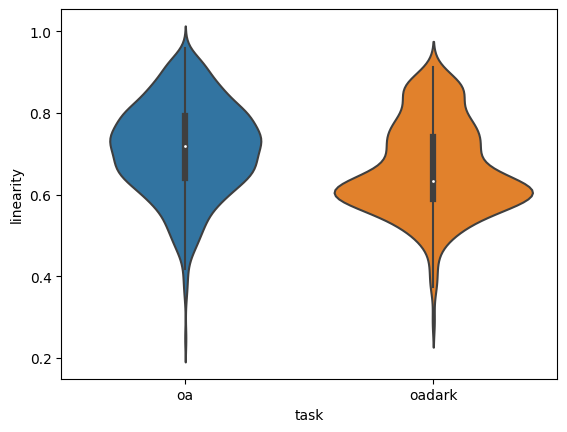

In [24]:
data= pd.concat([oa_long,dark_long])
sns.violinplot(data=data, x="task", y="linearity")

In [ ]:
data = oa_long[oa_long.ob_linearity==]

In [27]:
dark_long.date.unique

<bound method Series.unique of 49      071023
53      071023
54      071023
102     071023
104     071023
         ...  
3329    071323
3357    071323
3369    071323
3377    071323
3400    071323
Name: date, Length: 713, dtype: object>

In [32]:
dark_long.ob_linearity.mean()

0.7589725599327779

<AxesSubplot: xlabel='task', ylabel='go_linearity'>

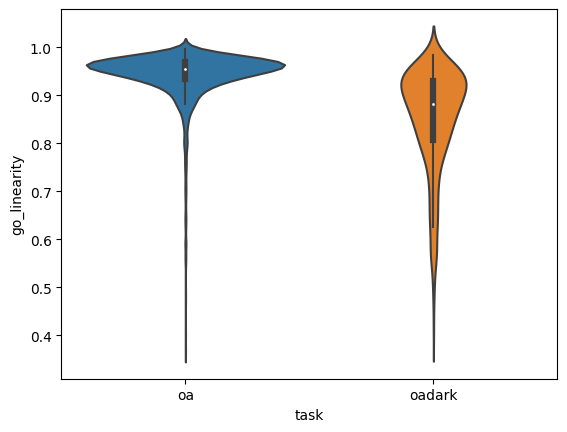

In [128]:

data= pd.concat([oa_long,dark_long])
sns.violinplot(data=data, x="task", y="go_linearity",common_norm=True)

<AxesSubplot: xlabel='task', ylabel='linearity'>

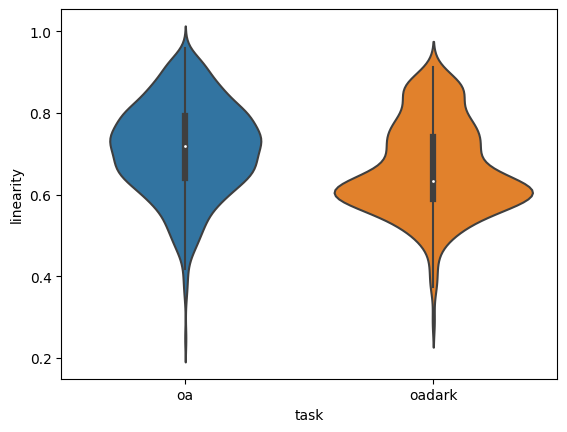

In [129]:

data= pd.concat([oa_long,dark_long])
sns.violinplot(data=data, x="task", y="linearity",common_norm=True)

<AxesSubplot: xlabel='task', ylabel='ob_linearity'>

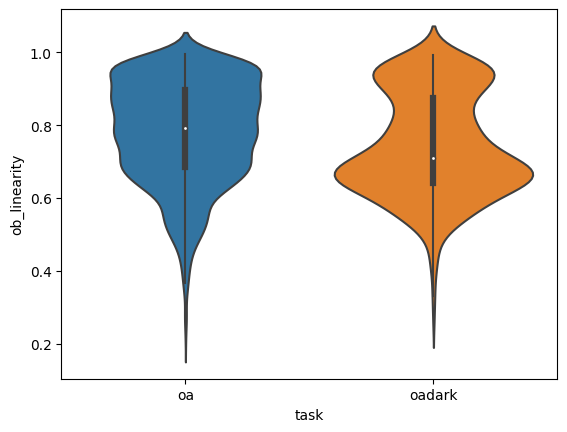

In [127]:

data= pd.concat([oa_long,dark_long])
sns.violinplot(data=data, x="task", y="ob_linearity",common_norm=True)

In [38]:
dat.obstacle_nose_x.to_numpy()[0]

array([11.294656673326825, 11.92462175336123, 12.527243140703915,
       13.182297264009938, 13.8374642891397, 14.5607957903528,
       15.449143468126808, 16.3544659351002, 17.152100384553414,
       17.959203909963744, 18.828599887604668, 19.665835780753103,
       20.636786948848624, 21.54640758825182, 22.507543071791343,
       23.4685046865223, 24.25230075943964, 25.166882304977992,
       25.566019606374905, 25.836268185789635, 26.017638191519357,
       26.133247400993174, 26.148538824000592, 26.00590091792329,
       25.898427413868216, 25.932688601300516, 25.856102778184372,
       25.848786740005984, 25.826895076382698, 25.843570675749174,
       25.914170444170594, 25.9840815114672, 25.90822051805947,
       25.832741132815983, 25.77540732868407, 25.695055100727945,
       25.584731954641658, 25.50437069453963, 25.49997655555965,
       25.486986071720064, 25.49609499085945, 25.562223847060746,
       25.564700913073615, 25.734019778137274, 25.83813332391783,
       26.28498

In [122]:
len(oa_long[oa_long.ob_linearity>=oa_long.ob_linearity.mean()])/len(oa_long)

0.5319934372436423

In [121]:
len(dark_long[dark_long.ob_linearity>=dark_long.ob_linearity.mean()])/len(dark_long)

0.4642356241234222

2361    0.758831
Name: ob_linearity, dtype: float64 2361    early
Name: skill, dtype: object
2361    0.758831
Name: ob_linearity, dtype: float64 0.7785412992567782


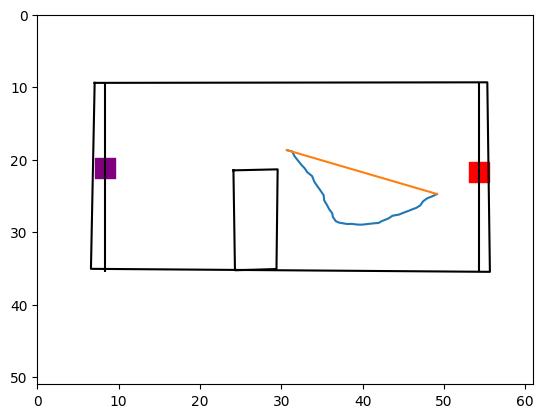

In [201]:
dat = oa_long[oa_long.ob_linearity>=.70].sample(1)
fig,ax = plt.subplots()
plot_arena_single(dat,ax,obstacle=True)
ax.plot(dat.obstacle_nose_x.to_numpy()[0],dat.obstacle_nose_y.to_numpy()[0])
ax.plot([dat.obstacle_nose_x.to_numpy()[0][0],dat.obstacle_nose_x.to_numpy()[0][-1]],[dat.obstacle_nose_y.to_numpy()[0][0],dat.obstacle_nose_y.to_numpy()[0][-1]])
print(dat.ob_linearity,dat.skill)
print(dat.ob_linearity,oa_long.ob_linearity.mean())

2667    0.636438
Name: ob_linearity, dtype: float64 0.7589725599327779


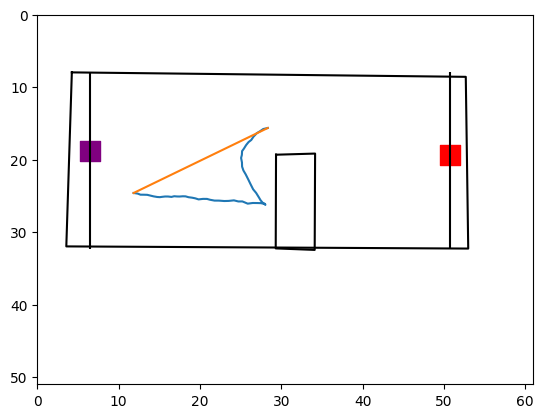

In [152]:
dat = dark_long[dark_long.ob_linearity<=dark_long.ob_linearity.mean()].sample(1)
fig,ax = plt.subplots()
plot_arena_single(dat,ax,obstacle=True)
ax.plot(dat.obstacle_nose_x.to_numpy()[0],dat.obstacle_nose_y.to_numpy()[0])
ax.plot([dat.obstacle_nose_x.to_numpy()[0][0],dat.obstacle_nose_x.to_numpy()[0][-1]],[dat.obstacle_nose_y.to_numpy()[0][0],dat.obstacle_nose_y.to_numpy()[0][-1]])
print(dat.ob_linearity,dark_long.ob_linearity.mean())

<AxesSubplot: xlabel='task', ylabel='mean_ob_angle_to_corner'>

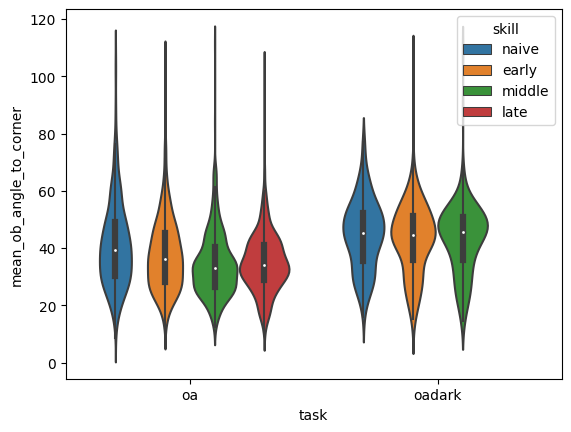

In [18]:
data = pd.concat([oa_long,dark_long])
data = drop_nans_in_columns(data,'obstacle_ind')
for ind,row in data.iterrows():
    ob_distance = np.nanmean(row.ts_angle_to_corner[:int(row.obstacle_ind)])
    data.at[ind,'mean_ob_angle_to_corner'] = ob_distance

sns.violinplot(data=data, x="task", y="mean_ob_angle_to_corner",hue='skill')

<AxesSubplot: xlabel='task', ylabel='go_linearity'>

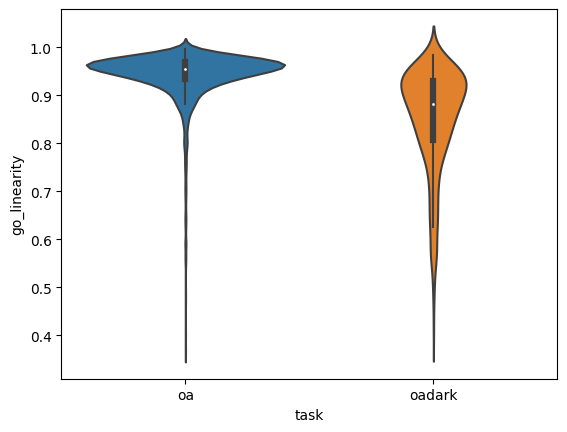

In [192]:

data= pd.concat([oa_long,dark_long])
sns.violinplot(data=data, x="task", y="go_linearity",density_norm='area')

<AxesSubplot: xlabel='task', ylabel='linearity'>

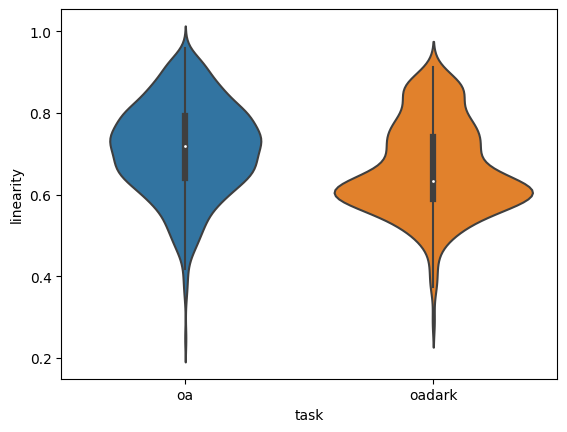

In [193]:

data= pd.concat([oa_long,dark_long])
sns.violinplot(data=data, x="task", y="linearity",density_norm='area')

<AxesSubplot: xlabel='task', ylabel='ob_linearity'>

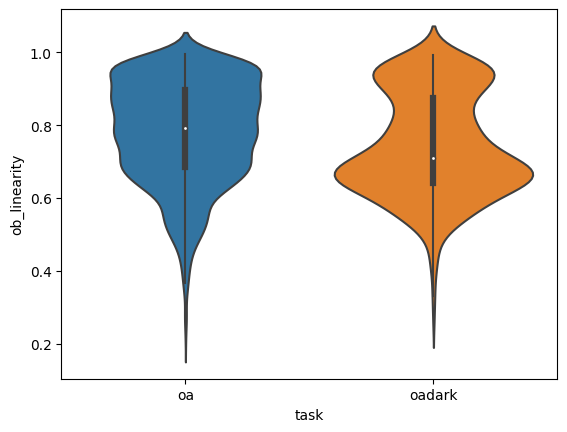

In [191]:

data= pd.concat([oa_long,dark_long])
sns.violinplot(data=data, x="task", y="ob_linearity",density_norm='area')

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_linearity'>

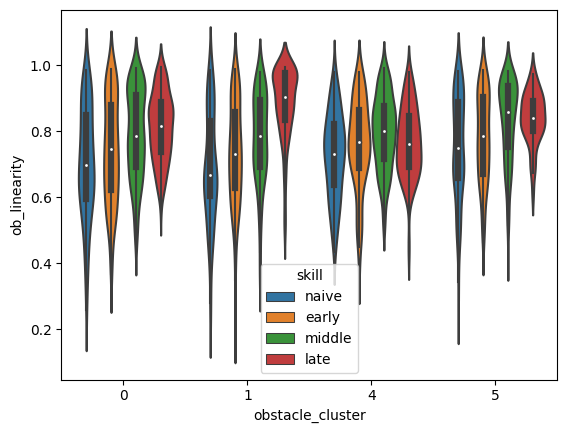

In [20]:
sns.violinplot(data=oa_long, x="obstacle_cluster", y="ob_linearity", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_linearity'>

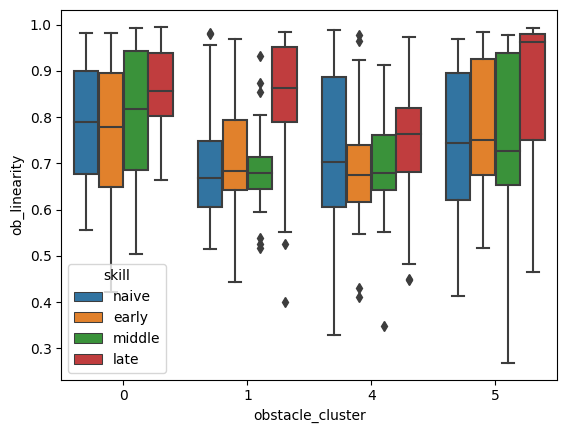

In [132]:
#sns.boxplot(data=oa_long, x="obstacle_cluster", y="ob_linearity", hue="skill")
sns.boxplot(data=dark_long, x="obstacle_cluster", y="ob_linearity", hue="skill")

<AxesSubplot: xlabel='obstacle_cluster', ylabel='ob_linearity'>

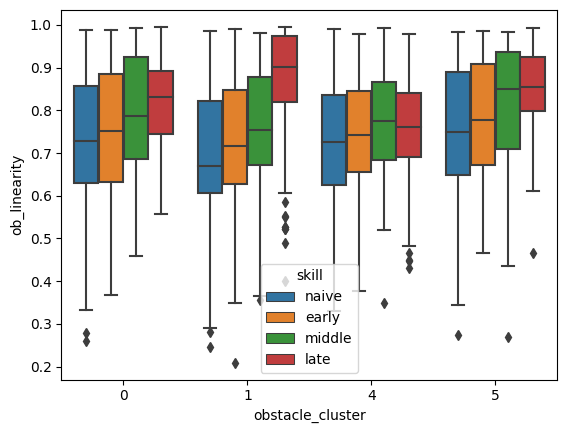

In [130]:

data= pd.concat([oa_long,dark_long])
sns.boxplot(data=data, x="obstacle_cluster", y="ob_linearity", hue="skill")

<AxesSubplot: xlabel='task', ylabel='total_distance'>

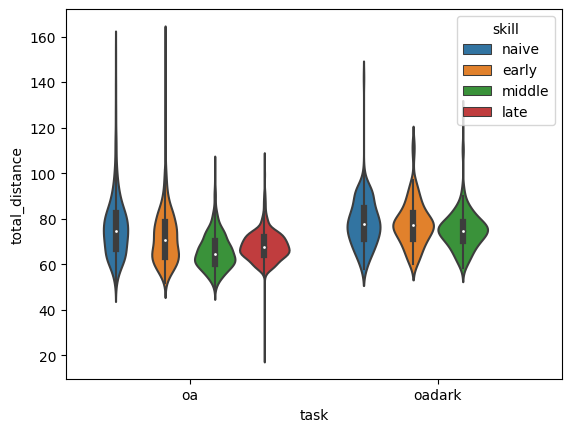

In [21]:

data= pd.concat([oa_long,dark_long])
sns.violinplot(data=data, x="task", y="total_distance",hue='skill')

<AxesSubplot: xlabel='task', ylabel='total_ob_distance'>

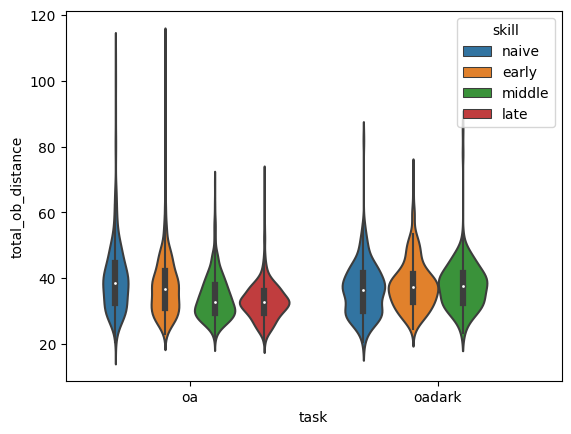

In [22]:
data = pd.concat([oa_long,dark_long])
data = drop_nans_in_columns(data,'obstacle_ind')
for ind,row in data.iterrows():
    ob_distance = sum(row.ts_distance[:int(row.obstacle_ind)])
    data.at[ind,'total_ob_distance'] = ob_distance
sns.violinplot(data=data, x="task", y="total_ob_distance",hue = 'skill')

<AxesSubplot: xlabel='task', ylabel='mean_ob_speed'>

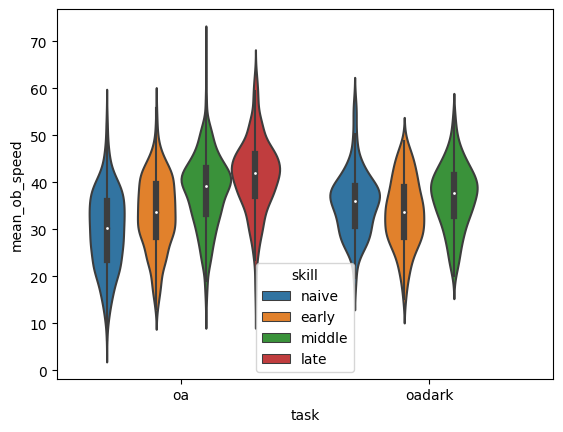

In [23]:
data = pd.concat([oa_long,dark_long])
data = drop_nans_in_columns(data,'obstacle_ind')
for ind,row in data.iterrows():
    ob_distance = np.nanmean(row.ts_speed[:int(row.obstacle_ind)])
    data.at[ind,'mean_ob_speed'] = ob_distance
sns.violinplot(data=data, x="task", y="mean_ob_speed",hue='skill')

<AxesSubplot: xlabel='task', ylabel='mean_ob_head_body_angle'>

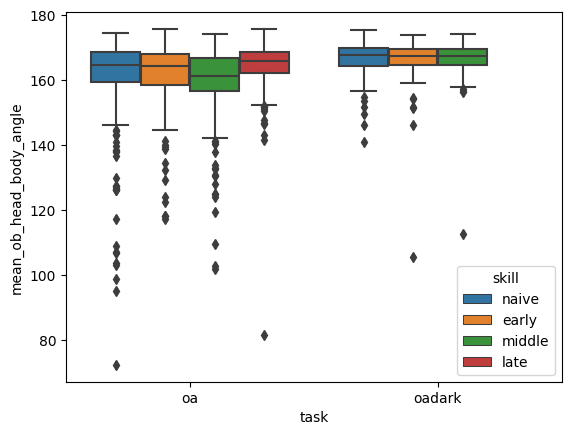

In [129]:
data = pd.concat([oa_long,dark_long])
data = drop_nans_in_columns(data,'obstacle_ind')
for ind,row in data.iterrows():
    ob_distance = np.nanmean(row.ts_head_body_angle[:int(row.obstacle_ind)])
    data.at[ind,'mean_ob_head_body_angle'] = ob_distance
sns.boxplot(data=data, x="task", y="mean_ob_head_body_angle",hue = 'skill')

In [ ]:
data = pd.concat([oa_long,dark_long])
data = drop_nans_in_columns(data,'obstacle_ind')
for ind,row in data.iterrows():
    ob_distance = np.nanmean(row.ts_angle_to_corner[:int(row.obstacle_ind)])
    data.at[ind,'mean_ob_angle_to_corner'] = ob_distance
sns.boxplot(data=data, x="task", y="mean_ob_angle_to_corner")

In [140]:
find_consective_trials(oa_long)

In [142]:
oa_long.consecutive

18       1.0
29       1.0
40       1.0
42       2.0
55       2.0
        ... 
13307    1.0
13310    1.0
13324    1.0
13363    1.0
13384    1.0
Name: consecutive, Length: 2751, dtype: float64

In [145]:
con_light = create_consective_df_new(light)

In [150]:
test

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,skill,ts_head_body_angle,consective_inds
4420,1,2.0,51733.436979,51736.800371,"[51733.450265, 51733.466969, 51733.483609, 517...","[627, 628, 629, 630, 631, 632, 633, 634, 635, ...","[115.17922973632812, 114.62762451171875, 114.1...","[277.7922668457031, 277.6312561035156, 276.780...","[135.65768432617188, 135.46556091308594, 136.2...","[263.0269470214844, 263.662109375, 264.2120361...",...,21.407368,"[nan, 55.20147483803088, 49.62879483133819, 53...","[nan, 19.04624242112778, 167.9383332292366, 1....",1.420485,0.703985,1.288644,0.776010,naive,"[151.20350227678867, 146.45233853924842, 140.6...","[4420, 4421, 4422]"
4421,2,3.0,51736.800371,51739.737318,"[51736.801395, 51736.818009, 51736.83616, 5173...","[[828, 829, 830, 831, 832, 833, 834, 835, 836,...","[690.3485717773438, 691.3297119140625, 691.859...","[272.8236999511719, 272.7662353515625, 272.574...","[674.8673706054688, 676.4848022460938, 677.831...","[268.2221984863281, 266.8993835449219, 266.997...",...,21.758821,"[nan, 44.90092163421724, 43.993945660367714, 5...","[nan, 77.41616542108095, 72.05836951701917, 74...",1.328958,0.752469,1.150185,0.869425,naive,"[151.81478187797134, 154.7304624447638, 155.82...","[4420, 4421, 4422]"
4422,3,4.0,51739.737318,51743.403571,"[51739.752409, 51739.769945, 51739.785907, 517...","[1005, 1006, 1007, 1008, 1009, 1010, 1011, 101...","[113.86015319824219, 113.49015808105469, 113.8...","[277.7652282714844, 277.37164306640625, 276.92...","[134.6192169189453, 133.83827209472656, 134.42...","[264.1770935058594, 264.1122741699219, 263.946...",...,21.449824,"[nan, 50.20111914432239, 59.13143060512273, 60...","[nan, 25.02675241152418, 25.026752411524207, 2...",1.194001,0.837520,1.081818,0.924370,naive,"[133.92797328303618, 133.89136600376264, 131.8...","[4420, 4421, 4422]"


In [151]:
test = con_light.loc[[4420, 4421, 4422]]
test.iloc[2].ob_linearity - test.iloc[0].ob_linearity

0.13353551692947363

In [ ]:
con_light.

In [159]:
con_light.consective_inds.unique()[0].strip('][').split(', ')

['4420', '4421', '4422']

In [161]:
import ast
ast.literal_eval(con_light.consective_inds.unique()[0])

[4420, 4421, 4422]

In [171]:
con_light

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,skill,ts_head_body_angle,consective_inds
4420,1,2.0,51733.436979,51736.800371,"[51733.450265, 51733.466969, 51733.483609, 517...","[627, 628, 629, 630, 631, 632, 633, 634, 635, ...","[115.17922973632812, 114.62762451171875, 114.1...","[277.7922668457031, 277.6312561035156, 276.780...","[135.65768432617188, 135.46556091308594, 136.2...","[263.0269470214844, 263.662109375, 264.2120361...",...,21.407368,"[nan, 55.20147483803088, 49.62879483133819, 53...","[nan, 19.04624242112778, 167.9383332292366, 1....",1.420485,0.703985,1.288644,0.776010,naive,"[151.20350227678867, 146.45233853924842, 140.6...","[4420, 4421, 4422]"
4421,2,3.0,51736.800371,51739.737318,"[51736.801395, 51736.818009, 51736.83616, 5173...","[[828, 829, 830, 831, 832, 833, 834, 835, 836,...","[690.3485717773438, 691.3297119140625, 691.859...","[272.8236999511719, 272.7662353515625, 272.574...","[674.8673706054688, 676.4848022460938, 677.831...","[268.2221984863281, 266.8993835449219, 266.997...",...,21.758821,"[nan, 44.90092163421724, 43.993945660367714, 5...","[nan, 77.41616542108095, 72.05836951701917, 74...",1.328958,0.752469,1.150185,0.869425,naive,"[151.81478187797134, 154.7304624447638, 155.82...","[4420, 4421, 4422]"
4422,3,4.0,51739.737318,51743.403571,"[51739.752409, 51739.769945, 51739.785907, 517...","[1005, 1006, 1007, 1008, 1009, 1010, 1011, 101...","[113.86015319824219, 113.49015808105469, 113.8...","[277.7652282714844, 277.37164306640625, 276.92...","[134.6192169189453, 133.83827209472656, 134.42...","[264.1770935058594, 264.1122741699219, 263.946...",...,21.449824,"[nan, 50.20111914432239, 59.13143060512273, 60...","[nan, 25.02675241152418, 25.026752411524207, 2...",1.194001,0.837520,1.081818,0.924370,naive,"[133.92797328303618, 133.89136600376264, 131.8...","[4420, 4421, 4422]"
4423,4,5.0,51743.403571,51748.085696,"[51743.40471, 51743.420364, 51743.437158, 5174...","[[1224, 1225, 1226, 1227, 1228, 1229, 1230, 12...","[689.9378051757812, 691.3955688476562, 691.495...","[272.37847900390625, 272.63372802734375, 273.2...","[673.7486572265625, 675.6795043945312, 677.072...","[268.76220703125, 268.4595642089844, 267.65228...",...,21.449800,"[nan, 49.91706773665957, 47.758201429862, 44.2...","[nan, 32.83107534513433, 48.11808991760365, 48...",2.816403,0.355063,1.244472,0.803554,naive,"[138.5741271304023, 142.92188876583032, 144.05...","[4423, 4424, 4425]"
4424,5,6.0,51748.085696,51750.449280,"[51748.088588, 51748.106636, 51748.122291, 517...","[1505, 1506, 1507, 1508, 1509, 1510, 1511, 151...","[112.85887908935547, 111.88679504394531, 111.8...","[272.9649353027344, 274.082763671875, 274.5699...","[135.9404296875, 135.2183380126953, 134.646545...","[267.20086669921875, 267.6318054199219, 268.02...",...,21.440680,"[nan, 9.500450068084382, 10.86117795981315, 8....","[nan, 21.82109552856958, 23.6015077134929, 22....",1.019429,0.980941,1.093029,0.914889,naive,"[147.3579215068241, 146.1250938636251, 144.945...","[4423, 4424, 4425]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11854,126,135.0,46482.887616,46485.124172,"[46482.898176, 46482.915686, 46482.931622, 464...","[[19050, 19051, 19052, 19053, 19054, 19055, 19...","[662.4528198242188, 662.913818359375, 662.9567...","[267.9638671875, 267.5152282714844, 268.622009...","[646.6304321289062, 647.0481567382812, 647.111...","[260.6338806152344, 260.12469482421875, 260.92...",...,19.323205,"[nan, 56.45825619063787, 56.867145831195806, 5...","[nan, 23.618726912833647, 28.220233914749546, ...",1.208865,0.827222,1.060102,0.943305,late,"[154.5470606324638, 154.41885867758583, 163.05...","[11853, 11854, 11855]"
11855,127,136.0,46485.124172,46487.258496,"[46485.132057, 46485.149696, 46485.165836, 464...","[19184, 19185, 19186, 19187, 19188, 19189, 191...","[84.4212112

(array([0.01854444, 0.10817593, 0.29980185, 0.64287408, 3.18964447,
        1.06321482, 0.61814815, 0.21944259, 0.08654074, 0.0154537 ]),
 array([-0.73362946, -0.57393201, -0.41423456, -0.25453711, -0.09483966,
         0.06485778,  0.22455523,  0.38425268,  0.54395013,  0.70364758,
         0.86334503]),
 <BarContainer object of 10 artists>)

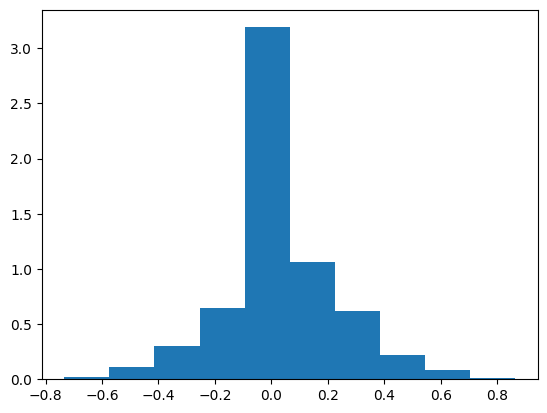

In [172]:
diffs = []
for i in con_light.consective_inds.unique():
    inds = ast.literal_eval(i)
    trial = con_light.loc[inds]
    diff = trial.iloc[2].ob_linearity - trial.iloc[0].ob_linearity
    diffs.append(diff)
plt.hist(diffs,density=True)

In [170]:
diffs = []
for i in con_light.consective_inds.unique():
    inds = ast.literal_eval(i)
    trial = con_light.loc[inds]
    diff = trial.iloc[2].ob_linearity - trial.iloc[0].ob_linearity
    diffs.append(diff)
plt.hist(diffs)

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,goal_basis_start_y,goal_basis_end_x,goal_basis_end_y,obstacle_devations,goal_devations,ob_tortuosity,ob_linearity,go_tortuosity,go_linearity,ts_head_body_angle
0,0,0,64915.523148,64918.775347,"[64915.528115, 64915.544896, 64915.561536, 649...","[540, 541, 542, 543, 544, 545, 546, 547, 548, ...","[93.8053970336914, 92.92668151855469, 92.60152...","[262.5429382324219, 263.65594482421875, 263.42...","[112.91676330566406, 111.78739166259766, 111.2...","[257.9234619140625, 258.3965759277344, 257.921...",...,18.348766,50.459529,20.894197,"[nan, 81.837440445118, 84.12695592302141, 89.3...","[nan, 70.40388409835329, 60.52740183153384, 54...",2.556700,0.391129,1.300080,0.769183,"[158.28134335101294, 161.1826985207039, 163.54..."
1,1,1,64918.775347,64921.798566,"[64918.778969, 64918.796723, 64918.812556, 649...","[[735, 736, 737, 738, 739, 740, 741, 742, 743,...","[676.229248046875, 678.3688354492188, 678.5172...","[280.1986389160156, 279.34014892578125, 279.42...","[667.1575927734375, 669.3810424804688, 668.289...","[275.3477783203125, 272.519775390625, 273.3495...",...,20.218940,7.111541,19.574711,"[nan, 65.25216128708313, 55.65088499471557, 40...","[nan, 52.77582897687816, 53.32785823869204, 46...",1.128818,0.885882,1.653857,0.604647,"[165.30015241242495, 166.96596970574845, 164.3..."
2,2,2,64921.798566,64925.165734,"[64921.813696, 64921.83118, 64921.847052, 6492...","[917, 918, 919, 920, 921, 922, 923, 924, 925, ...","[95.15409851074219, 94.2234115600586, 94.51425...","[262.2293701171875, 263.2197265625, 264.313385...","[113.92466735839844, 112.84644317626953, 112.7...","[257.9330749511719, 258.80914306640625, 258.93...",...,18.061779,50.882333,20.842746,"[nan, 127.8483341718382, 113.6262448223143, 11...","[nan, 54.754417034883474, 43.569119349519696, ...",1.875956,0.533061,1.470947,0.679834,"[164.061422104384, 166.64225968800466, 163.622..."
3,3,4,64929.479206,64932.383590,"[64929.48288, 64929.49966, 64929.517132, 64929...","[1377, 1378, 1379, 1380, 1381, 1382, 1383, 138...","[94.98332214355469, 93.73847198486328, 93.1007...","[262.4388427734375, 262.70660400390625, 262.69...","[113.64474487304688, 113.05989074707031, 112.1...","[256.3793029785156, 257.34747314453125, 257.83...",...,12.152082,50.466894,20.541485,"[nan, 1.1548800484944999, 10.17397936948142, 7...","[nan, 9.080044028942213, 7.934229108220891, 8....",1.012354,0.987797,1.461965,0.684011,"[117.80659528380257, 121.52282349242702, 127.7..."
4,4,6,64935.836697,64938.609971,"[64935.851635, 64935.869478, 64935.885107, 649...","[1759, 1760, 1761, 1762, 1763, 1764, 1765, 176...","[94.91559600830078, 95.0887680053711, 93.86167...","[263.7718505859375, 262.8562316894531, 264.323...","[115.93388366699219, 114.1135025024414, 113.45...","[256.3660888671875, 257.00177001953125, 257.76...",...,11.311715,50.636549,20.719006,"[nan, 0.11346564954900971, 1.6451903149424119,...","[nan, 66.12953650179767, 51.65020638430119, 47...",1.391605,0.718595,1.072992,0.931973,"[114.84258473894035, 108.25492009027488, 113.3..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3491,103,118,57373.622361,57375.891724,"[57373.638553, 57373.655552, 57373.671974, 573...","[[23592, 23593, 23594, 23595, 23596, 23597, 23...","[674.3579711914062, 674.6685180664062, 674.885...","[265.2582092285156, 265.7662353515625, 265.428...","[661.851318359375, 662.6461791992188, 662.7941...","[254.9436798095703, 255.2102508544922, 255.170...",...,11.642672,6.419999,19.174648,"[nan, 17.327813992479534, 11.688698240243342, ...","[nan, 2.570282469463491, 7.167502165054785, 8....",1.012641,0.987517,1.088174,0.918970,"[146.366246010431, 146.3670401223566, 147.5068..."
3492,104,119,57375.891724,57379.136204,"[57375.906022, 57375.923891, 57375.939724, 573...","[23728, 23729, 23730, 23731, 23732, 23733, 237...","[86.62127685546875, 88.42916870117188, 89.5463...","[258.9886169433594, 26

(array([0.05840642, 0.11681283, 0.42831373, 0.58406417, 3.27075936,
        1.6937861 , 0.50618895, 0.29203209, 0.27256328, 0.09734403]),
 array([-0.63972483, -0.50311787, -0.3665109 , -0.22990394, -0.09329697,
         0.04330999,  0.17991696,  0.31652392,  0.45313089,  0.58973785,
         0.72634482]),
 <BarContainer object of 10 artists>)

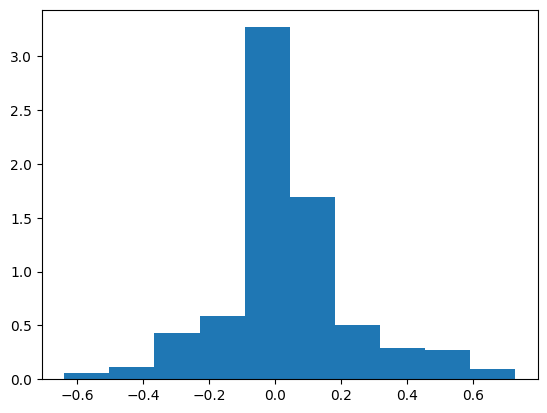

In [173]:
con_dark = create_consective_df_new(dark)

diffs = []
for i in con_dark.consective_inds.unique():
    inds = ast.literal_eval(i)
    trial = con_dark.loc[inds]
    diff = trial.iloc[2].ob_linearity - trial.iloc[0].ob_linearity
    diffs.append(diff)
plt.hist(diffs,density=True)

(array([0.00016498, 0.00032995, 0.        , 0.00065991, 0.00082488,
        0.00659907, 0.03794463, 0.01418799, 0.00098986, 0.00032995]),
 array([-109.9356201 ,  -93.81470647,  -77.69379285,  -61.57287922,
         -45.4519656 ,  -29.33105197,  -13.21013834,    2.91077528,
          19.03168891,   35.15260253,   51.27351616]),
 <BarContainer object of 10 artists>)

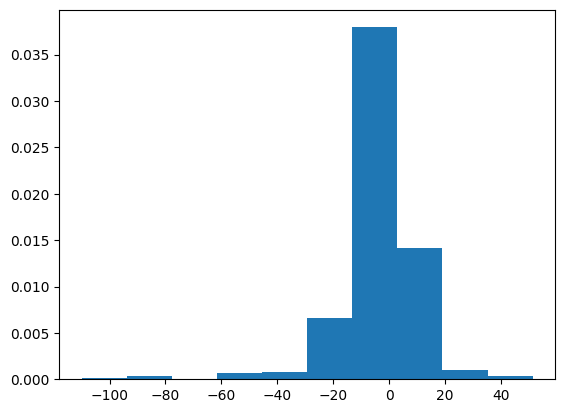

In [175]:
diffs = []
for i in con_dark.consective_inds.unique():
    inds = ast.literal_eval(i)
    trial = con_dark.loc[inds]
    diff = trial.iloc[2].total_distance - trial.iloc[0].total_distance
    diffs.append(diff)
plt.hist(diffs,density=True)